In [1]:
import glob
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import bootstrap
from sklearn import datasets
from sklearn.feature_selection import RFE, f_regression
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB, MultinomialNB
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score, multilabel_confusion_matrix, RocCurveDisplay
from sklearn.preprocessing import LabelBinarizer
import statsmodels.api as sm

In [2]:
csv_files = glob.glob('Data'+'/**/*.csv', recursive=True)

features = []

for file in csv_files:
    data = pd.read_csv(file, header=None, na_values="?", skiprows=5)
    data.columns = ["time", "avg_rss12", "var_rss12", "avg_rss13", "var_rss13", "avg_rss23", "var_rss23"] 
    data = data.drop(columns = ["time"])
    d1 = data.iloc[:int(np.ceil(len(data)/2)), :]
    d1.columns = ["avg_rss11", "var_rss11", "avg_rss21", "var_rss21", "avg_rss31", "var_rss31"] 
    d2 = data.iloc[int(np.ceil(len(data)/2)):, :].reset_index()
    d2 = d2.drop(columns = ["index"])
    d2.columns = ["avg_rss12", "var_rss12", "avg_rss22", "var_rss22", "avg_rss32", "var_rss32"] 
    data = d1.join(d2)
    features.append(data)


In [3]:
X = []
for f in features:
    x = {}
    for col in f.columns:
        x[f'min_{col}'] = f[col].min()
        x[f'max_{col}'] = f[col].max()
        x[f'mean_{col}'] = f[col].mean()
        x[f'median_{col}'] = f[col].median()
        x[f'std_{col}'] = f[col].std()
        x[f'1st_quart_{col}'] = f[col].quantile(0.25)
        x[f'3rd_quart_{col}'] = f[col].quantile(0.75)
    X.append(x)

df = pd.DataFrame(X)

In [4]:
bending_rows = []
for i,a in enumerate(csv_files):
    if 'bending' in a:
        bending_rows.append("Bending")
    else:
        bending_rows.append("Other")

df_ = df.join(pd.DataFrame({"bending": bending_rows}))
print(df_.columns)

Index(['min_avg_rss11', 'max_avg_rss11', 'mean_avg_rss11', 'median_avg_rss11',
       'std_avg_rss11', '1st_quart_avg_rss11', '3rd_quart_avg_rss11',
       'min_var_rss11', 'max_var_rss11', 'mean_var_rss11', 'median_var_rss11',
       'std_var_rss11', '1st_quart_var_rss11', '3rd_quart_var_rss11',
       'min_avg_rss21', 'max_avg_rss21', 'mean_avg_rss21', 'median_avg_rss21',
       'std_avg_rss21', '1st_quart_avg_rss21', '3rd_quart_avg_rss21',
       'min_var_rss21', 'max_var_rss21', 'mean_var_rss21', 'median_var_rss21',
       'std_var_rss21', '1st_quart_var_rss21', '3rd_quart_var_rss21',
       'min_avg_rss31', 'max_avg_rss31', 'mean_avg_rss31', 'median_avg_rss31',
       'std_avg_rss31', '1st_quart_avg_rss31', '3rd_quart_avg_rss31',
       'min_var_rss31', 'max_var_rss31', 'mean_var_rss31', 'median_var_rss31',
       'std_var_rss31', '1st_quart_var_rss31', '3rd_quart_var_rss31',
       'min_avg_rss12', 'max_avg_rss12', 'mean_avg_rss12', 'median_avg_rss12',
       'std_avg_rss12', '1s

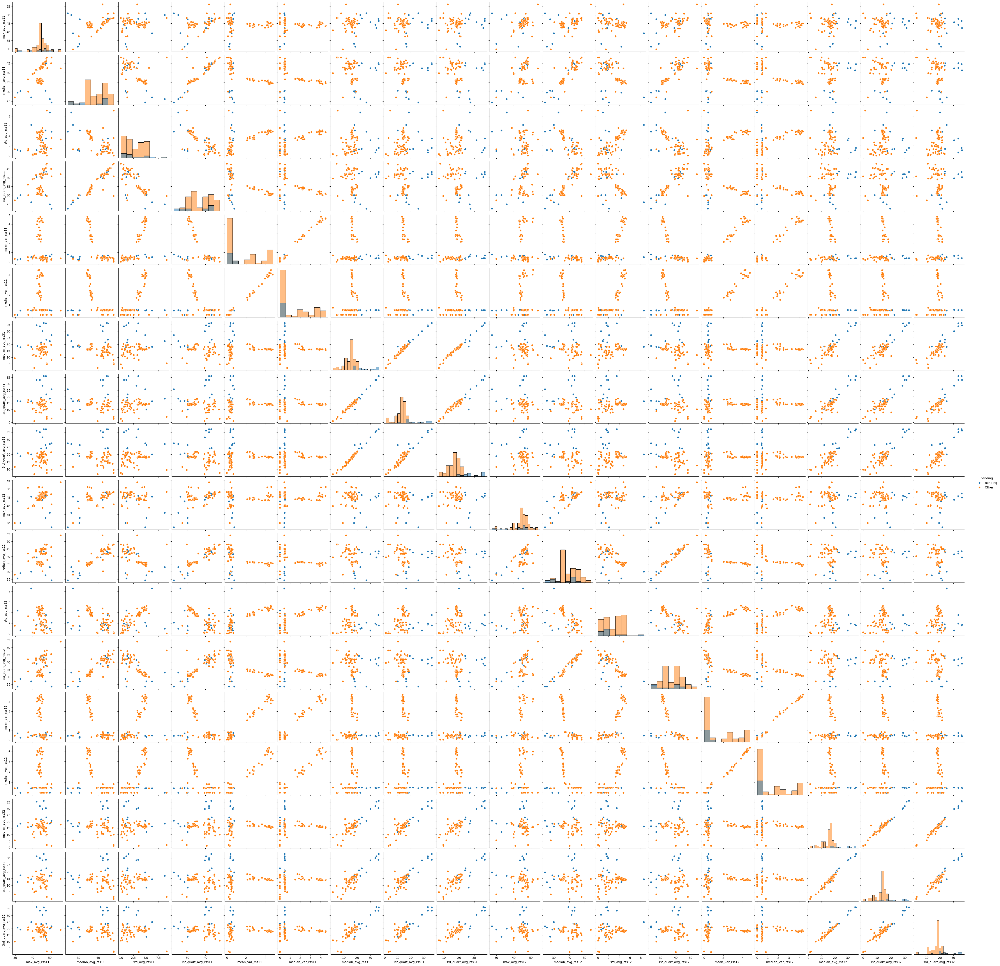

In [5]:
disp_cols = df_.iloc[:, [1, 3, 4, 5, 9, 10, 31, 33, 34, 1+42, 3+42, 4+42, 5+42, 9+42, 10+42, 31+42, 33+42, 34+42, -1]]
sns.pairplot(disp_cols, hue="bending", diag_kind="hist")

No, there is no discrenable difference in the results. 

In [6]:
X_train = {}
X_test = {}
for l in range(1, 21, 1):
    features = []
    
    for file in csv_files:
        data = pd.read_csv(file, header=None, na_values="?", skiprows=5)
        data.columns = ["time", "avg_rss12", "var_rss12", "avg_rss13", "var_rss13", "avg_rss23", "var_rss23"] 
        data = data.drop(columns = ["time"])
        d1 = data.iloc[:int(np.ceil(len(data)/l)), :]
        d1.columns = ["avg_rss11", "var_rss11", "avg_rss21", "var_rss21", "avg_rss31", "var_rss31"] 
        for i in range(1, l, 1):
            d2 = data.iloc[i*int(np.ceil(len(data)/l)):(i+1)*int(np.ceil(len(data)/l)), :].reset_index()
            d2 = d2.drop(columns = ["index"])
            d2.columns = ["avg_rss1"+str(i+1), "var_rss1"+str(i+1), "avg_rss2"+str(i+1), 
                          "var_rss2"+str(i+1), "avg_rss3"+str(i+1), "var_rss3"+str(i+1)] 
            d1 = d1.join(d2)
        
        features.append(d1)

    train = []
    test = []
    for i,f in enumerate(features):
        x = {}
        for col in f.columns:
            x[f'min_{col}'] = f[col].min()
            x[f'max_{col}'] = f[col].max()
            x[f'mean_{col}'] = f[col].mean()
            x[f'median_{col}'] = f[col].median()
            x[f'std_{col}'] = f[col].std()
            x[f'1st_quart_{col}'] = f[col].quantile(0.25)
            x[f'3rd_quart_{col}'] = f[col].quantile(0.75)
        if 'dataset1.csv' in csv_files[i] or 'dataset2.csv' in csv_files[i] or 'dataset3.csv' in csv_files[i]:
            if 'dataset3' in csv_files[i] and 'bending' in csv_files[i]:
                train.append(x)
            else:
                test.append(x)
        else:
            train.append(x)
            
    X_train[l] = pd.DataFrame(train)
    X_test[l] = pd.DataFrame(test)


In [7]:
Y_train = []
Y_test = []
for i,a in enumerate(csv_files):
    if 'dataset1.csv' in a or 'dataset2.csv' in a or 'dataset3.csv' in a:
        if 'dataset3' in a and 'bending' in a:
            Y_train.append(1)
        else:
            if 'bending' in a:
                Y_test.append(1)
            else:
                Y_test.append(0)
    else:
        if 'bending' in a:
            Y_train.append(1)
        else:
            Y_train.append(0)

Y_train = np.array(Y_train)
Y_test = np.array(Y_test)

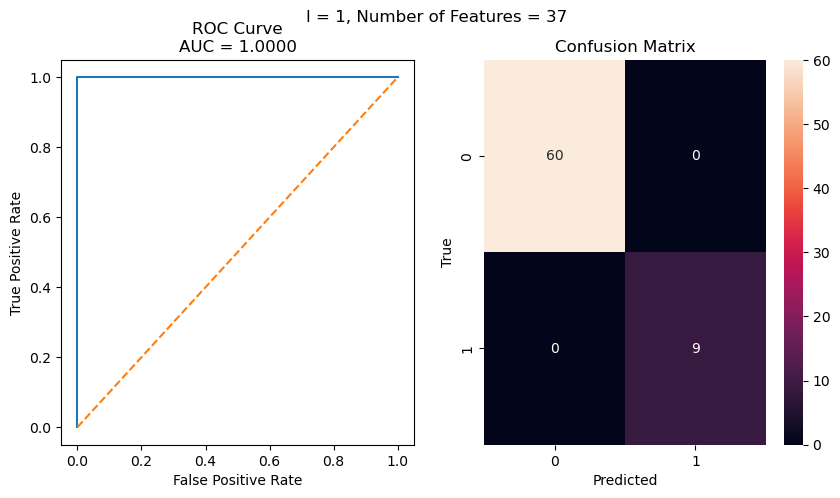

l = 1, Number of Relevant Features = 37, Features:
 Index(['min_avg_rss11', 'max_avg_rss11', 'mean_avg_rss11', 'median_avg_rss11',
       'std_avg_rss11', '1st_quart_avg_rss11', '3rd_quart_avg_rss11',
       'min_var_rss11', 'max_var_rss11', 'mean_var_rss11', 'median_var_rss11',
       'std_var_rss11', '1st_quart_var_rss11', '3rd_quart_var_rss11',
       'min_avg_rss21', 'max_avg_rss21', 'mean_avg_rss21', 'median_avg_rss21',
       'std_avg_rss21', '1st_quart_avg_rss21', '3rd_quart_avg_rss21',
       'min_var_rss21', 'mean_var_rss21', 'median_var_rss21', 'std_var_rss21',
       '1st_quart_var_rss21', '3rd_quart_var_rss21', 'min_avg_rss31',
       'max_avg_rss31', 'mean_avg_rss31', 'median_avg_rss31', 'std_avg_rss31',
       '3rd_quart_avg_rss31', 'min_var_rss31', 'mean_var_rss31',
       'median_var_rss31', '3rd_quart_var_rss31'],
      dtype='object')
                     Model Params  P-Values
min_avg_rss11           -0.112281  0.864027
max_avg_rss11           -0.278865  0.077461
mea

/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


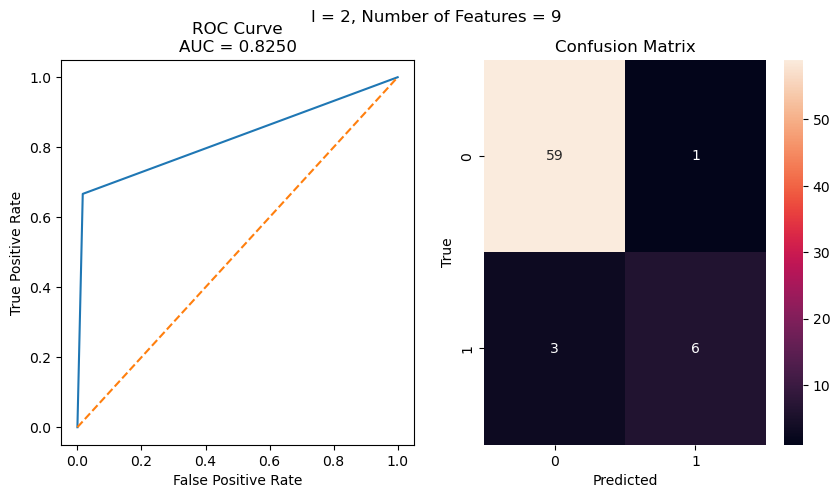

l = 2, Number of Relevant Features = 9, Features:
 Index(['max_avg_rss22', 'std_avg_rss11', 'median_var_rss31', 'std_avg_rss31',
       'max_avg_rss11', 'std_var_rss22', 'mean_var_rss31', 'median_var_rss12',
       'mean_var_rss12'],
      dtype='object')
                  Model Params      P-Values
max_avg_rss22         0.395531  2.244858e-26
std_avg_rss11         0.880445  2.469272e-28
median_var_rss31      5.740317  1.997106e-28
std_avg_rss31         0.533578  1.449261e-29
max_avg_rss11        -0.197789  7.755209e-30
std_var_rss22        -4.084660  4.958248e-30
mean_var_rss31       -8.106920  4.160937e-30
median_var_rss12      0.294304  3.211358e-30
mean_var_rss12        0.349482  7.316208e-31
*********************************************
No Feature with P-Value >= 0.05 for l = 3
choosing feature with top 10% P-Values


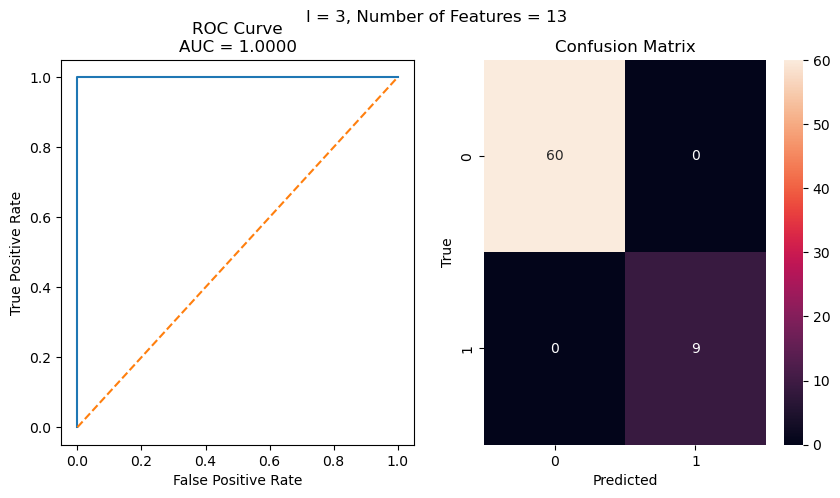

l = 3, Number of Relevant Features = 13, Features:
 Index(['1st_quart_var_rss21', 'std_avg_rss21', 'median_var_rss31',
       'mean_var_rss21', '3rd_quart_avg_rss12', '3rd_quart_avg_rss23',
       'mean_var_rss31', 'std_var_rss31', 'min_var_rss12', 'std_avg_rss31',
       '3rd_quart_avg_rss32', 'min_var_rss23', '3rd_quart_var_rss31'],
      dtype='object')
                     Model Params      P-Values
1st_quart_var_rss21     -3.040258  2.690158e-28
std_avg_rss21           42.272485  2.168834e-28
median_var_rss31        -5.868682  1.150956e-28
mean_var_rss21           0.866444  2.649513e-29
3rd_quart_avg_rss12    -19.678624  2.290991e-29
3rd_quart_avg_rss23    -16.788659  1.466906e-29
mean_var_rss31          -5.739702  1.045761e-29
std_var_rss31            0.333573  1.124084e-30
min_var_rss12           -0.091028  4.169789e-31
std_avg_rss31           36.815162  1.479350e-31
3rd_quart_avg_rss32     37.374439  1.395384e-31
min_var_rss23           -0.091935  1.025746e-31
3rd_quart_var_rss

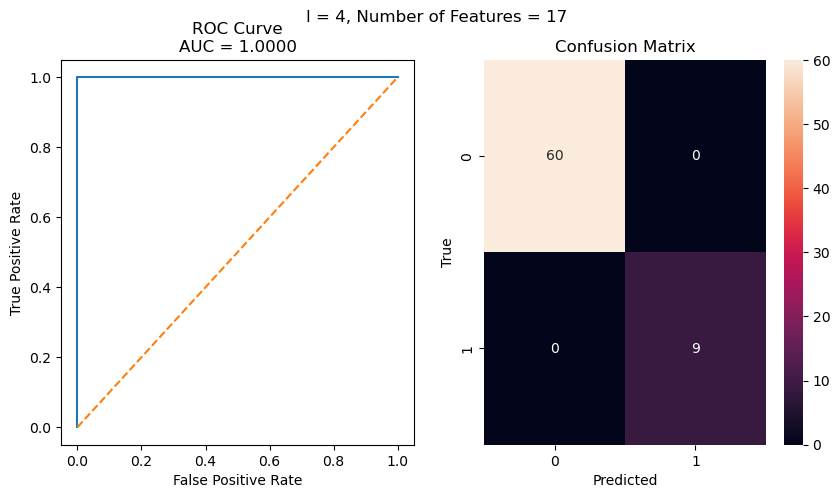

l = 4, Number of Relevant Features = 17, Features:
 Index(['1st_quart_var_rss31', 'std_var_rss23', 'max_var_rss22',
       'mean_var_rss32', 'median_avg_rss23', 'max_var_rss12', 'mean_avg_rss21',
       'median_var_rss32', '3rd_quart_var_rss31', 'std_var_rss31',
       '3rd_quart_avg_rss11', '1st_quart_avg_rss14', 'std_avg_rss23',
       'median_var_rss33', 'min_var_rss14', 'max_var_rss14',
       '1st_quart_var_rss32'],
      dtype='object')
                     Model Params      P-Values
1st_quart_var_rss31   -214.083487  4.474005e-30
std_var_rss23           96.127320  1.186904e-31
max_var_rss22           12.278758  8.130576e-33
mean_var_rss32        -119.739008  7.741353e-33
median_avg_rss23         6.281378  6.557859e-34
max_var_rss12          -25.709845  5.337264e-34
mean_avg_rss21           7.820606  1.827178e-34
median_var_rss32        62.412933  1.401657e-34
3rd_quart_var_rss31   -153.653860  1.353196e-34
std_var_rss31          463.655769  1.112297e-34
3rd_quart_avg_rss11    -1

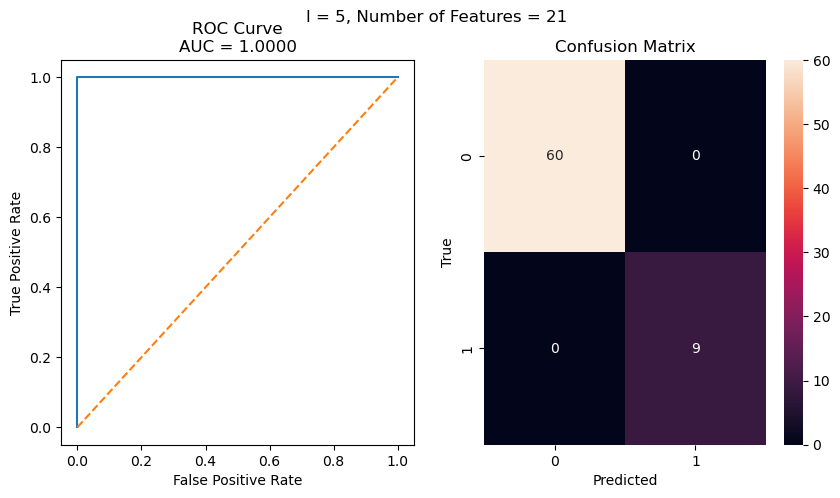

l = 5, Number of Relevant Features = 21, Features:
 Index(['3rd_quart_var_rss23', '1st_quart_avg_rss31', 'mean_var_rss21',
       'std_avg_rss33', 'mean_avg_rss21', 'max_var_rss31', 'mean_var_rss31',
       'mean_avg_rss31', 'median_avg_rss15', '3rd_quart_avg_rss24',
       'std_avg_rss14', 'std_var_rss21', 'std_var_rss31', 'median_var_rss33',
       'max_var_rss35', 'max_avg_rss13', '3rd_quart_avg_rss33',
       'median_avg_rss22', 'max_avg_rss21', 'std_avg_rss21',
       '1st_quart_var_rss12'],
      dtype='object')
                     Model Params      P-Values
3rd_quart_var_rss23     -0.272004  7.426214e-28
1st_quart_avg_rss31      1.745228  5.864335e-28
mean_var_rss21          -0.147027  1.831015e-28
std_avg_rss33            0.008601  9.160901e-29
mean_avg_rss21          -1.040225  7.347793e-29
max_var_rss31            0.178603  2.460020e-29
mean_var_rss31          -0.211566  1.829998e-29
mean_avg_rss31           2.308771  1.367394e-29
median_avg_rss15        -0.544518  5.223827e

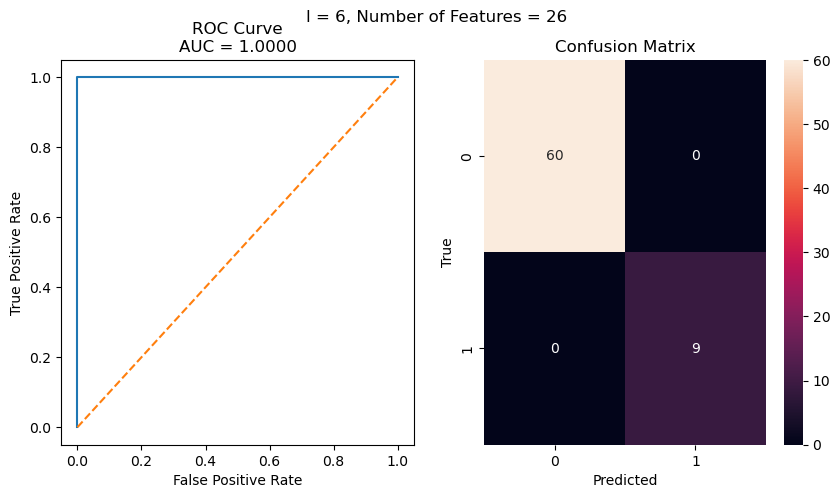

l = 6, Number of Relevant Features = 26, Features:
 Index(['median_var_rss21', '3rd_quart_var_rss26', 'max_avg_rss35',
       'max_avg_rss21', 'min_var_rss31', 'mean_var_rss21', 'median_var_rss31',
       'std_var_rss36', 'max_var_rss25', 'mean_var_rss31', 'std_var_rss21',
       'mean_avg_rss21', 'max_var_rss13', 'std_var_rss31', 'mean_var_rss24',
       '1st_quart_var_rss32', 'min_avg_rss21', 'mean_var_rss13',
       'std_avg_rss25', '3rd_quart_var_rss36', 'max_avg_rss24',
       'min_avg_rss22', 'median_var_rss36', '1st_quart_var_rss24',
       'min_var_rss16', 'std_avg_rss32'],
      dtype='object')
                     Model Params      P-Values
median_var_rss21       -79.032539  2.529638e-27
3rd_quart_var_rss26    -19.829457  1.296210e-29
max_avg_rss35           47.716398  3.579567e-30
max_avg_rss21           22.763688  2.544339e-30
min_var_rss31           -2.213017  1.724509e-30
mean_var_rss21          23.222768  1.342234e-30
median_var_rss31      -201.705103  5.532543e-31
std_v

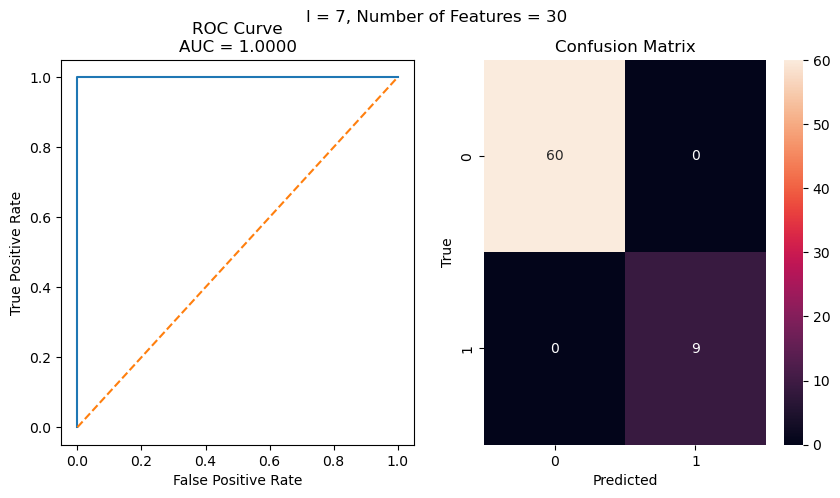

l = 7, Number of Relevant Features = 30, Features:
 Index(['mean_var_rss31', 'std_var_rss31', 'mean_var_rss21', 'std_avg_rss21',
       'mean_avg_rss21', 'mean_avg_rss31', 'std_var_rss21', 'min_var_rss26',
       'median_avg_rss12', 'mean_avg_rss14', 'std_avg_rss23',
       'median_var_rss36', '3rd_quart_var_rss34', '3rd_quart_var_rss27',
       'min_avg_rss17', 'max_avg_rss13', 'mean_var_rss27',
       '1st_quart_var_rss21', 'std_avg_rss11', '3rd_quart_avg_rss33',
       '3rd_quart_avg_rss32', 'max_avg_rss21', 'median_var_rss17',
       'std_avg_rss26', 'std_avg_rss31', 'median_var_rss31',
       '3rd_quart_avg_rss21', 'mean_avg_rss33', 'min_var_rss27',
       'median_var_rss27'],
      dtype='object')
                     Model Params      P-Values
mean_var_rss31          -0.563039  1.522785e-25
std_var_rss31           -0.196213  1.383053e-25
mean_var_rss21          -0.303695  7.893371e-26
std_avg_rss21            1.142088  1.065803e-29
mean_avg_rss21          -1.801986  9.692025e-30

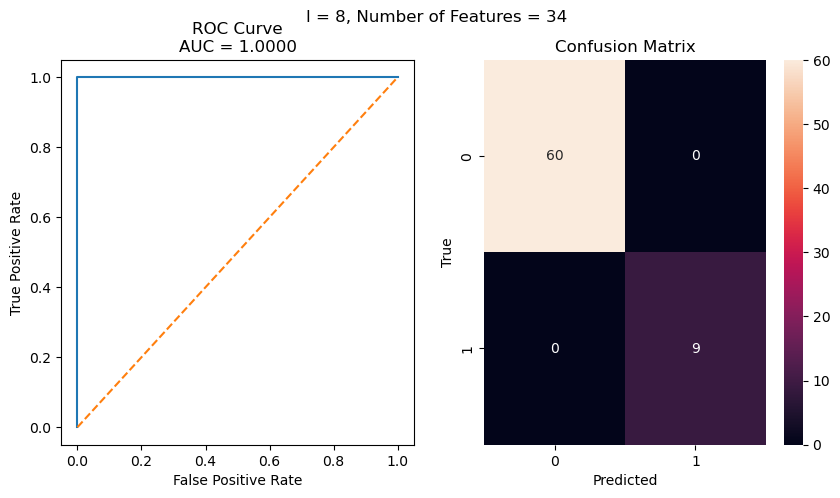

l = 8, Number of Relevant Features = 34, Features:
 Index(['std_var_rss34', 'min_var_rss25', 'mean_var_rss21', 'std_var_rss31',
       'median_var_rss25', 'mean_var_rss31', 'mean_avg_rss21', 'std_avg_rss21',
       'std_var_rss21', 'std_avg_rss34', 'std_avg_rss31', 'min_avg_rss16',
       'std_var_rss24', 'mean_avg_rss31', 'max_avg_rss23', 'min_var_rss36',
       'std_avg_rss26', 'max_avg_rss34', 'median_avg_rss22', 'max_avg_rss21',
       '3rd_quart_avg_rss21', 'min_avg_rss17', '1st_quart_avg_rss22',
       'min_var_rss17', '3rd_quart_avg_rss18', 'median_var_rss28',
       'min_avg_rss31', 'median_avg_rss18', '1st_quart_var_rss38',
       '1st_quart_var_rss21', 'min_avg_rss38', 'max_var_rss11',
       'std_avg_rss18', '1st_quart_avg_rss13'],
      dtype='object')
                     Model Params      P-Values
std_var_rss34           -1.150498  1.287160e-25
min_var_rss25           -0.155896  1.603228e-26
mean_var_rss21          -1.507646  8.079525e-28
std_var_rss31           -0.534973

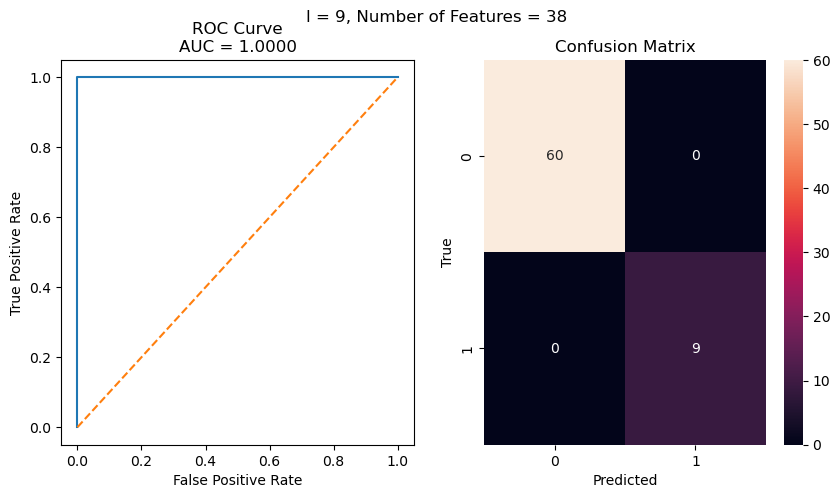

l = 9, Number of Relevant Features = 38, Features:
 Index(['3rd_quart_avg_rss19', 'median_var_rss21', 'mean_var_rss21',
       'std_var_rss31', 'median_var_rss31', 'mean_var_rss31', 'std_avg_rss24',
       'std_avg_rss21', 'std_var_rss33', 'std_var_rss21', 'std_var_rss22',
       'median_avg_rss25', 'mean_avg_rss31', '1st_quart_var_rss23',
       'median_var_rss18', 'mean_avg_rss21', 'max_avg_rss31',
       'median_avg_rss33', 'std_avg_rss31', 'std_var_rss32',
       '3rd_quart_avg_rss11', '3rd_quart_avg_rss21', 'max_avg_rss21',
       'mean_avg_rss15', '3rd_quart_var_rss14', 'median_var_rss14',
       'median_var_rss28', 'std_var_rss38', 'median_var_rss23',
       'mean_var_rss22', 'median_var_rss26', '3rd_quart_avg_rss38',
       'max_var_rss33', 'min_var_rss19', '1st_quart_var_rss21',
       'std_avg_rss11', '3rd_quart_var_rss15', 'max_avg_rss12'],
      dtype='object')
                     Model Params      P-Values
3rd_quart_avg_rss19     -1.347906  2.335057e-23
median_var_rss21  

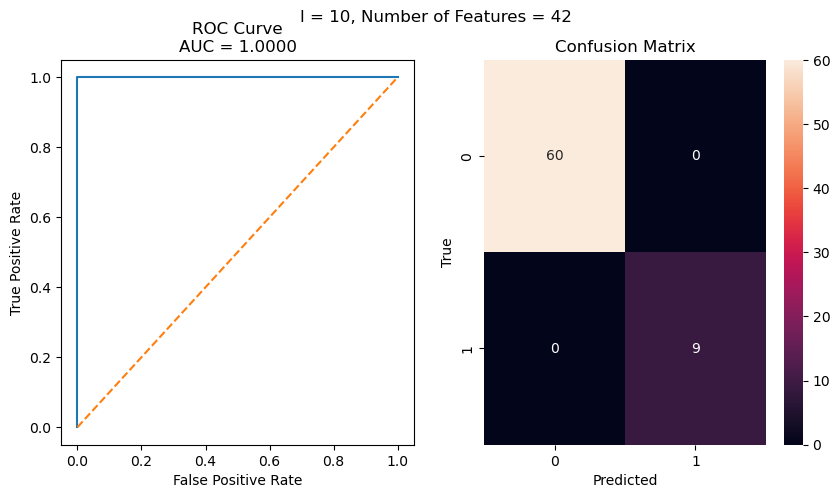

l = 10, Number of Relevant Features = 42, Features:
 Index(['median_var_rss21', 'min_var_rss35', '3rd_quart_var_rss23',
       'std_var_rss31', 'mean_var_rss31', 'min_var_rss28',
       '3rd_quart_avg_rss21', 'mean_avg_rss11', 'std_avg_rss21',
       'median_var_rss210', 'min_var_rss31', 'mean_var_rss12', 'min_var_rss27',
       'max_var_rss19', 'min_avg_rss21', 'mean_var_rss21',
       '1st_quart_var_rss21', 'mean_avg_rss22', 'max_avg_rss37',
       '3rd_quart_avg_rss33', 'min_avg_rss13', 'std_avg_rss29',
       'min_var_rss23', '3rd_quart_var_rss34', 'mean_avg_rss21',
       'min_avg_rss310', 'median_avg_rss210', 'max_avg_rss35',
       '1st_quart_var_rss110', 'min_var_rss15', 'min_avg_rss24',
       'mean_var_rss34', 'median_var_rss27', 'std_var_rss33', 'std_var_rss18',
       'median_var_rss26', 'std_var_rss35', '3rd_quart_var_rss19',
       'std_var_rss39', 'max_var_rss25', 'std_avg_rss18', 'min_var_rss25'],
      dtype='object')
                      Model Params      P-Values
me

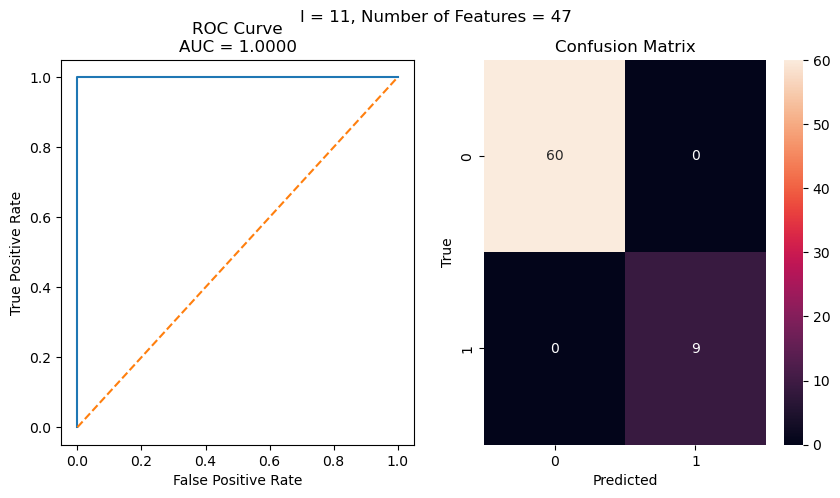

l = 11, Number of Relevant Features = 47, Features:
 Index(['min_avg_rss11', 'median_var_rss21', 'std_avg_rss39', 'max_var_rss36',
       '1st_quart_var_rss12', 'min_avg_rss14', '1st_quart_var_rss31',
       'std_var_rss21', 'median_avg_rss31', 'max_avg_rss35', 'std_avg_rss21',
       'median_var_rss33', '3rd_quart_var_rss310', 'median_avg_rss26',
       '1st_quart_var_rss18', 'min_avg_rss31', 'std_avg_rss22',
       'mean_var_rss11', '3rd_quart_avg_rss37', '1st_quart_avg_rss26',
       'mean_var_rss21', 'min_avg_rss39', '3rd_quart_var_rss23',
       'std_avg_rss31', 'median_var_rss36', 'max_avg_rss32', 'max_avg_rss26',
       'mean_var_rss111', '3rd_quart_var_rss35', 'std_var_rss31',
       'median_var_rss23', 'mean_var_rss31', 'median_var_rss27',
       'min_avg_rss32', 'median_avg_rss27', 'mean_var_rss23',
       'median_var_rss311', '1st_quart_var_rss19', 'median_var_rss38',
       'median_avg_rss34', '3rd_quart_avg_rss11', 'max_avg_rss36',
       'mean_avg_rss310', 'median_avg_rss

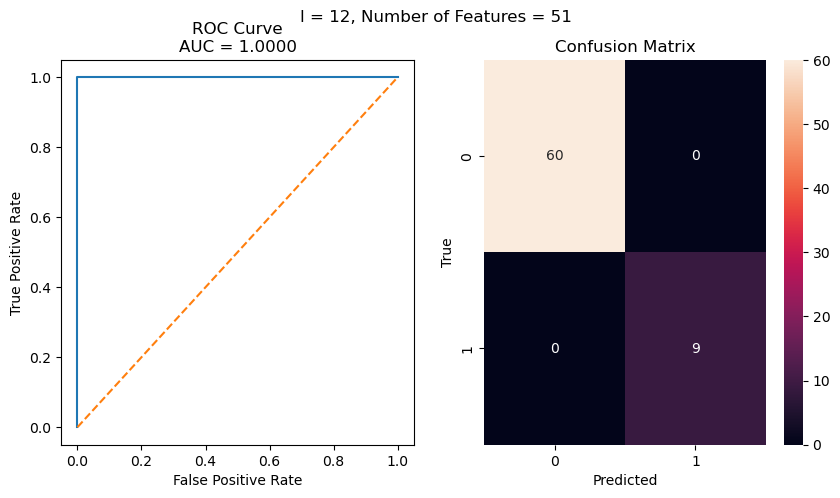

l = 12, Number of Relevant Features = 51, Features:
 Index(['1st_quart_var_rss31', 'mean_avg_rss112', 'median_avg_rss311',
       'min_avg_rss211', 'median_var_rss23', 'max_var_rss21',
       '3rd_quart_var_rss31', 'median_var_rss311', 'min_var_rss28',
       '1st_quart_avg_rss110', '1st_quart_avg_rss16', 'min_var_rss110',
       '1st_quart_avg_rss12', '3rd_quart_var_rss37', '3rd_quart_avg_rss11',
       'mean_var_rss111', 'mean_var_rss31', '3rd_quart_avg_rss26',
       'median_avg_rss14', 'mean_avg_rss37', 'mean_var_rss15', 'min_var_rss23',
       'min_var_rss29', 'median_var_rss15', 'std_avg_rss16',
       'median_avg_rss28', 'mean_avg_rss21', '1st_quart_var_rss310',
       '1st_quart_avg_rss14', 'mean_var_rss21', '3rd_quart_var_rss36',
       'median_var_rss24', 'min_var_rss36', 'std_avg_rss31',
       '1st_quart_var_rss36', 'max_avg_rss31', 'min_avg_rss32',
       'max_avg_rss210', 'std_var_rss31', 'mean_avg_rss35', 'min_var_rss35',
       'median_avg_rss110', 'min_avg_rss310', '3r

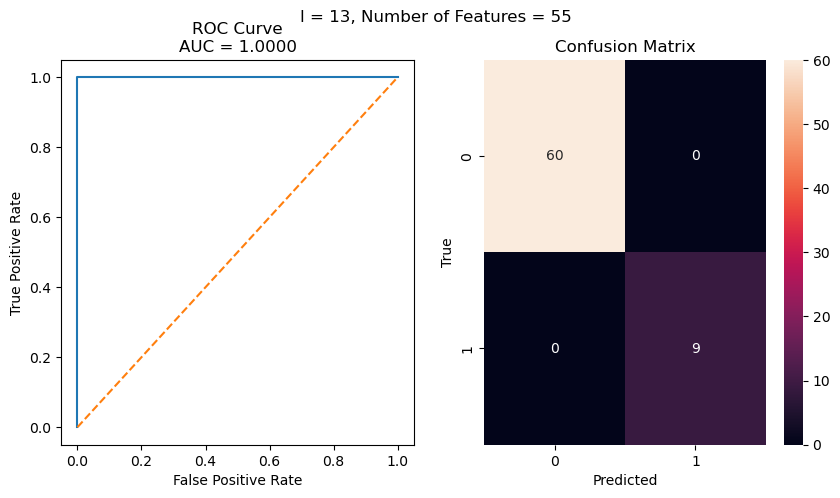

l = 13, Number of Relevant Features = 55, Features:
 Index(['3rd_quart_var_rss21', 'mean_var_rss21', 'min_var_rss23',
       'min_var_rss16', 'std_var_rss21', 'std_var_rss17', 'std_avg_rss21',
       'mean_var_rss31', 'mean_avg_rss36', 'std_var_rss31',
       '3rd_quart_var_rss29', '3rd_quart_avg_rss27', 'mean_avg_rss38',
       'mean_var_rss29', 'min_var_rss211', '1st_quart_var_rss26',
       'std_var_rss23', 'min_avg_rss313', 'std_var_rss26', 'min_avg_rss23',
       'std_var_rss19', 'mean_var_rss22', 'max_var_rss18',
       '1st_quart_var_rss32', '1st_quart_var_rss21', 'min_avg_rss24',
       '1st_quart_avg_rss12', '3rd_quart_avg_rss38', 'min_var_rss310',
       'min_avg_rss38', '3rd_quart_var_rss38', '3rd_quart_var_rss22',
       'min_var_rss39', 'median_var_rss13', 'mean_var_rss211', 'max_var_rss27',
       '3rd_quart_avg_rss211', 'median_var_rss29', 'max_avg_rss111',
       'median_avg_rss211', 'median_var_rss212', 'min_var_rss33',
       '3rd_quart_var_rss35', 'min_var_rss29', 'm

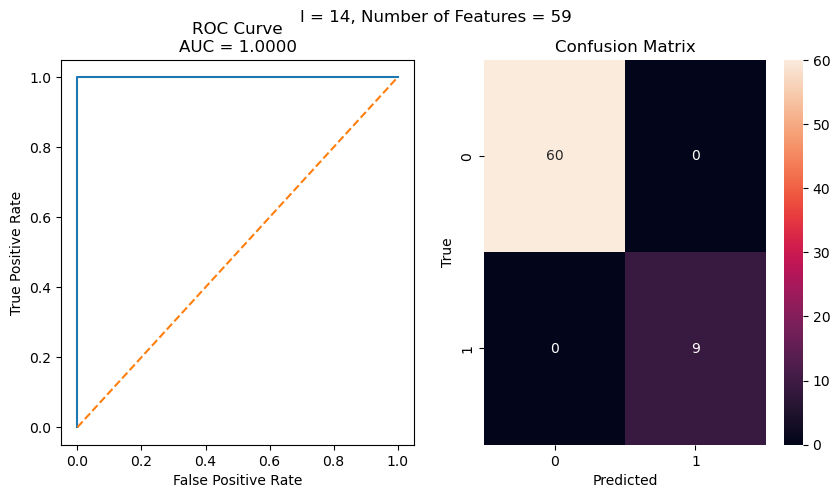

l = 14, Number of Relevant Features = 59, Features:
 Index(['median_var_rss21', 'std_avg_rss34', '3rd_quart_var_rss21',
       'median_var_rss212', 'max_avg_rss111', 'std_var_rss21',
       'median_var_rss31', 'mean_var_rss21', '3rd_quart_var_rss31',
       'std_var_rss29', 'std_var_rss31', 'max_var_rss18', 'median_var_rss13',
       'min_var_rss11', 'median_var_rss311', 'mean_var_rss31',
       'std_var_rss113', '3rd_quart_var_rss24', 'min_var_rss17',
       '1st_quart_avg_rss310', '3rd_quart_avg_rss12', 'min_var_rss211',
       'std_avg_rss21', '1st_quart_avg_rss17', 'min_var_rss33',
       'std_var_rss39', 'max_avg_rss18', 'min_var_rss37', 'median_avg_rss22',
       'std_var_rss213', 'median_var_rss26', '3rd_quart_var_rss313',
       'max_avg_rss19', 'mean_var_rss110', 'median_avg_rss35', 'std_avg_rss11',
       'min_avg_rss27', 'std_var_rss35', 'median_var_rss24', 'min_var_rss311',
       'max_var_rss39', 'std_var_rss110', 'mean_var_rss312', 'mean_var_rss313',
       'std_avg_rss13

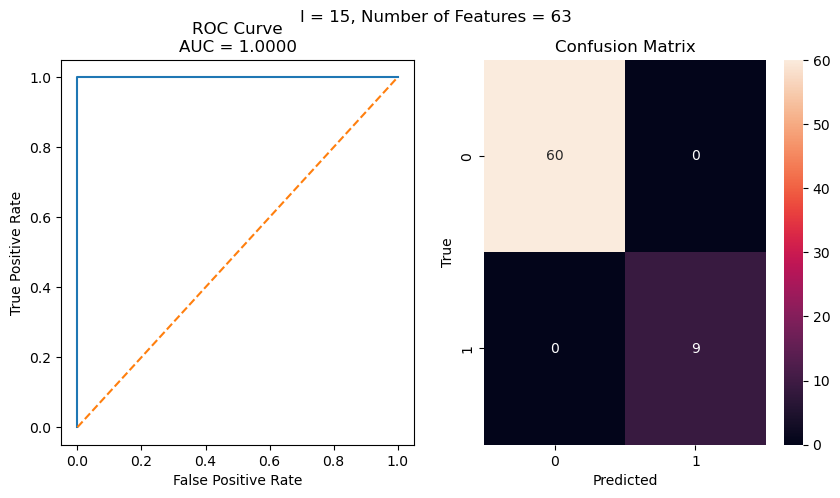

l = 15, Number of Relevant Features = 63, Features:
 Index(['std_var_rss21', '1st_quart_avg_rss110', 'mean_var_rss21',
       'median_var_rss21', '3rd_quart_var_rss21', 'min_var_rss34',
       '1st_quart_var_rss36', 'mean_var_rss26', 'std_var_rss31',
       'max_var_rss19', 'median_var_rss31', '3rd_quart_var_rss28',
       'mean_var_rss31', 'median_var_rss313', 'mean_var_rss32',
       '3rd_quart_var_rss111', 'median_var_rss34', 'median_var_rss212',
       '3rd_quart_var_rss27', 'mean_var_rss34', '3rd_quart_var_rss19',
       'min_var_rss214', 'mean_var_rss311', 'max_avg_rss31',
       'median_avg_rss115', 'median_avg_rss28', 'mean_var_rss210',
       'std_avg_rss113', '3rd_quart_var_rss212', '3rd_quart_var_rss310',
       'mean_avg_rss22', 'mean_var_rss36', 'median_var_rss214',
       '3rd_quart_avg_rss17', 'median_avg_rss36', 'min_var_rss37',
       'max_var_rss26', 'median_var_rss28', 'std_avg_rss21',
       'median_var_rss23', 'min_avg_rss24', 'min_avg_rss112',
       'mean_var_rss

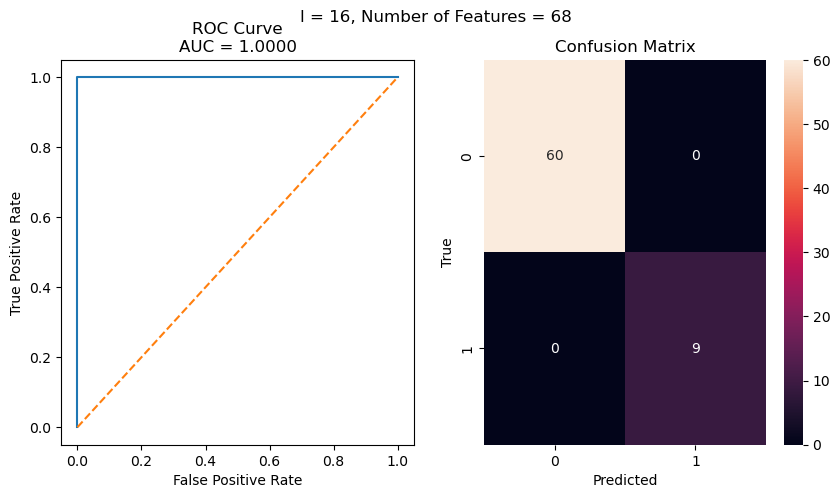

l = 16, Number of Relevant Features = 68, Features:
 Index(['median_var_rss21', 'std_var_rss31', '3rd_quart_var_rss21',
       'min_var_rss26', 'mean_var_rss21', 'median_var_rss215',
       '3rd_quart_avg_rss18', 'std_var_rss21', 'median_var_rss31',
       'std_var_rss37', 'median_var_rss26', 'mean_var_rss31',
       '1st_quart_avg_rss13', '1st_quart_var_rss29', '3rd_quart_var_rss215',
       'median_avg_rss115', 'max_var_rss31', 'mean_var_rss35', 'std_avg_rss11',
       'std_avg_rss31', 'mean_var_rss27', 'max_var_rss27', 'max_avg_rss18',
       'mean_var_rss18', 'mean_var_rss316', 'mean_avg_rss22', 'min_avg_rss35',
       'median_avg_rss39', 'min_var_rss210', '3rd_quart_var_rss213',
       '1st_quart_var_rss315', '3rd_quart_var_rss12', 'mean_avg_rss21',
       'mean_var_rss29', 'min_var_rss112', '3rd_quart_var_rss27',
       'mean_var_rss24', 'max_var_rss36', 'min_var_rss311', 'min_var_rss21',
       'max_var_rss112', 'median_var_rss33', 'median_var_rss35',
       'min_var_rss212', 'm

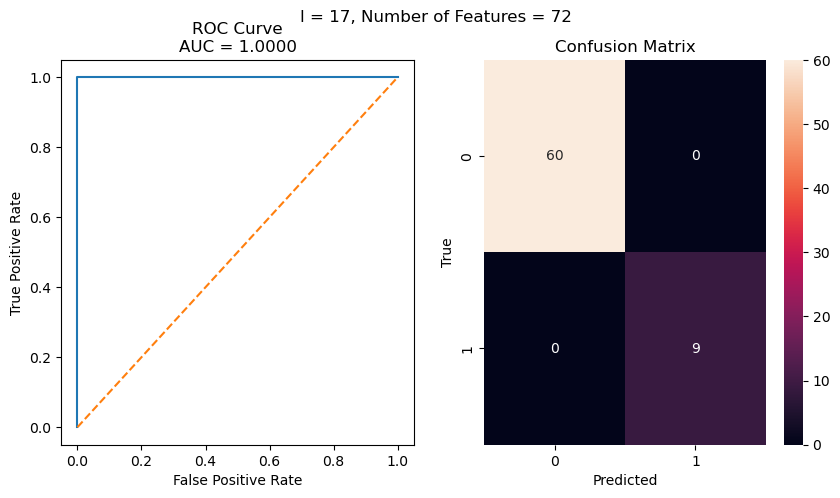

l = 17, Number of Relevant Features = 72, Features:
 Index(['median_var_rss21', '3rd_quart_var_rss21', 'min_avg_rss31',
       'min_var_rss27', 'min_avg_rss12', 'median_var_rss31', 'max_var_rss19',
       'mean_var_rss21', 'median_var_rss29', 'std_var_rss21', 'mean_var_rss31',
       'max_var_rss214', 'std_var_rss115', 'std_var_rss31',
       '1st_quart_var_rss33', 'min_var_rss213', 'median_avg_rss14',
       '1st_quart_avg_rss314', '3rd_quart_var_rss39', 'median_var_rss23',
       '3rd_quart_var_rss28', 'min_avg_rss212', '3rd_quart_var_rss27',
       '1st_quart_var_rss23', 'mean_avg_rss21', 'std_avg_rss115',
       'std_avg_rss112', 'min_avg_rss210', '3rd_quart_var_rss25',
       'min_var_rss117', 'std_avg_rss21', 'std_var_rss112',
       'median_var_rss316', 'mean_var_rss29', 'std_avg_rss17', 'std_var_rss18',
       '3rd_quart_var_rss17', 'max_avg_rss29', 'median_var_rss215',
       'median_avg_rss13', '3rd_quart_var_rss213', 'min_avg_rss111',
       'mean_var_rss117', 'min_var_rss14

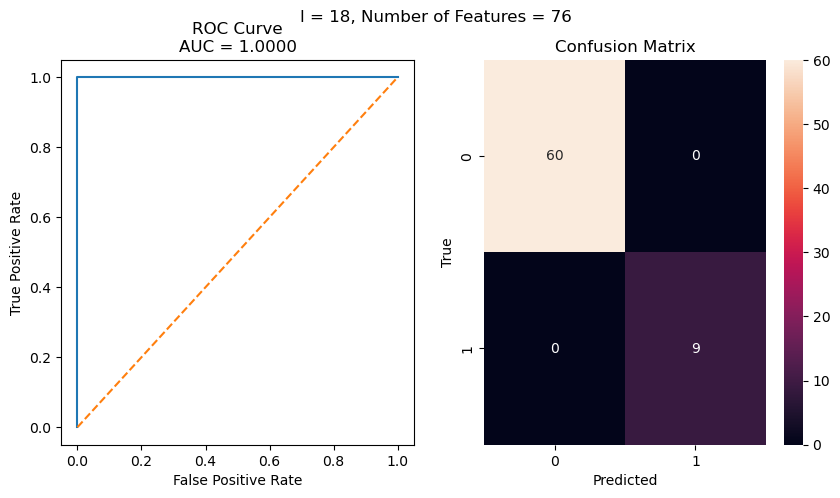

l = 18, Number of Relevant Features = 76, Features:
 Index(['std_avg_rss31', '3rd_quart_var_rss21', 'std_var_rss31',
       'mean_var_rss21', 'std_var_rss21', 'mean_var_rss313',
       '1st_quart_var_rss21', 'mean_var_rss31', 'median_var_rss37',
       'max_var_rss36', 'mean_var_rss34', 'median_avg_rss28', 'mean_avg_rss31',
       'max_var_rss315', 'std_avg_rss21', 'min_avg_rss29', 'mean_avg_rss216',
       'min_avg_rss28', 'mean_avg_rss21', 'min_avg_rss114', 'min_var_rss214',
       '3rd_quart_var_rss15', 'mean_avg_rss215', 'median_avg_rss11',
       'min_avg_rss313', 'max_var_rss110', 'mean_var_rss13',
       'median_var_rss318', 'max_var_rss17', 'median_avg_rss317',
       'median_var_rss117', '1st_quart_var_rss38', '1st_quart_var_rss24',
       'max_avg_rss114', 'min_avg_rss26', 'max_var_rss21',
       '1st_quart_avg_rss211', 'std_var_rss32', '3rd_quart_avg_rss31',
       'max_avg_rss34', 'median_var_rss27', 'min_avg_rss213',
       '3rd_quart_avg_rss11', 'min_var_rss215', 'std_avg

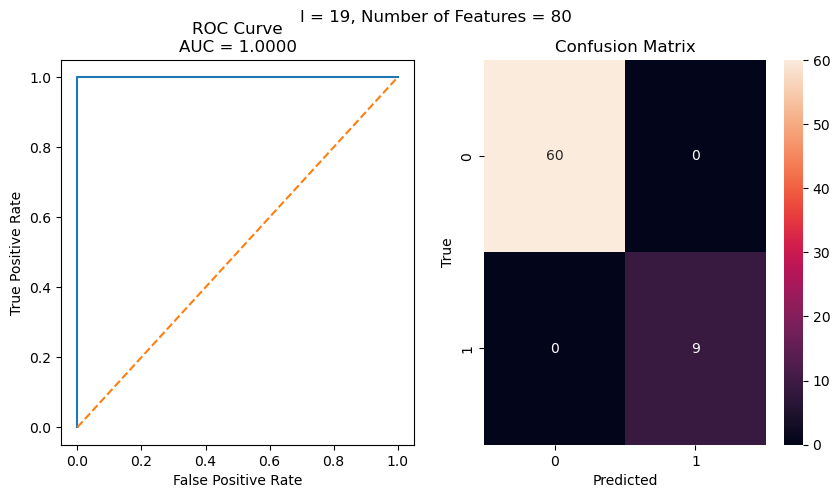

l = 19, Number of Relevant Features = 80, Features:
 Index(['std_var_rss21', 'mean_var_rss21', 'min_var_rss28',
       '3rd_quart_var_rss21', 'min_var_rss37', 'std_var_rss29',
       '1st_quart_var_rss119', 'std_var_rss31', 'median_var_rss31',
       'mean_var_rss31', 'min_var_rss110', 'std_var_rss16',
       'median_avg_rss119', 'std_var_rss14', '3rd_quart_var_rss113',
       '1st_quart_avg_rss35', 'median_avg_rss115', 'mean_avg_rss21',
       'min_var_rss29', '3rd_quart_var_rss317', 'std_avg_rss21',
       'std_avg_rss31', '3rd_quart_var_rss16', 'std_var_rss11',
       'median_avg_rss216', 'min_var_rss311', '1st_quart_var_rss219',
       'median_avg_rss21', '3rd_quart_var_rss118', 'std_var_rss112',
       'std_avg_rss111', 'mean_var_rss15', 'mean_avg_rss31', 'max_var_rss112',
       'std_var_rss18', 'std_avg_rss315', '3rd_quart_var_rss212',
       'max_var_rss210', 'median_var_rss17', 'median_avg_rss24',
       'mean_var_rss16', 'mean_var_rss210', 'std_avg_rss32', 'max_avg_rss15',
  

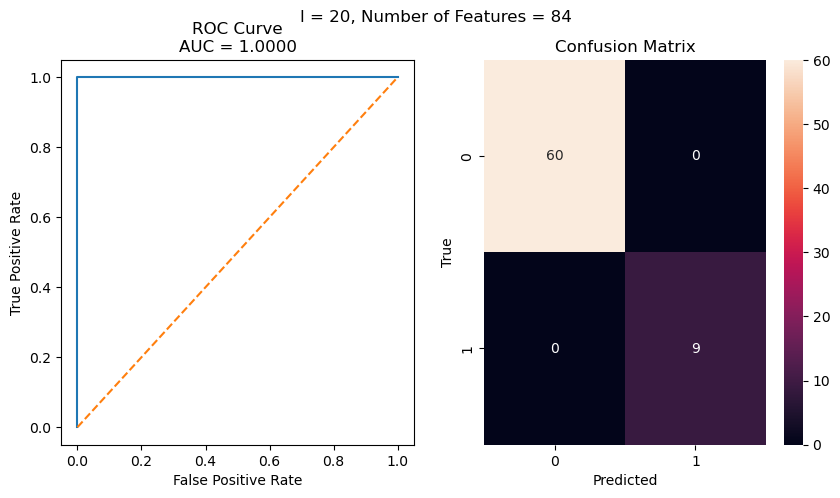

l = 20, Number of Relevant Features = 84, Features:
 Index(['mean_var_rss21', 'std_var_rss21', '3rd_quart_var_rss21',
       'median_var_rss31', 'std_avg_rss31', 'std_var_rss215', 'std_var_rss31',
       'mean_var_rss31', '1st_quart_var_rss25', 'std_avg_rss21',
       'std_avg_rss114', '3rd_quart_avg_rss218', 'mean_avg_rss31',
       'mean_avg_rss21', 'mean_var_rss23', '3rd_quart_avg_rss311',
       'std_var_rss34', 'min_var_rss14', 'max_var_rss17', 'median_var_rss114',
       'std_var_rss313', 'median_avg_rss110', 'mean_var_rss33',
       'std_var_rss32', '3rd_quart_avg_rss35', 'mean_var_rss17',
       '3rd_quart_var_rss17', 'std_avg_rss14', 'mean_var_rss110',
       'min_var_rss23', 'min_var_rss11', 'mean_var_rss118', 'mean_avg_rss314',
       'max_avg_rss117', '1st_quart_avg_rss12', '3rd_quart_var_rss36',
       'max_var_rss215', 'median_var_rss29', 'min_var_rss33', 'min_var_rss320',
       'max_var_rss110', 'mean_var_rss29', 'max_var_rss312', 'min_var_rss119',
       'mean_var_rss1

In [8]:
X_reduced_train = {}
X_reduced_test = {}
model = LogisticRegression(penalty=None, max_iter=100)

for l in range(1, 21, 1): 
    model_statsmodels = sm.OLS(Y_train, X_train[l])
    results = model_statsmodels.fit()    
    p = results.pvalues
    indicies = [i for i in range(len(p)) if p.iloc[i] >= 0.05]
    if indicies == []:
        print("*********************************************")
        print(f'No Feature with P-Value >= 0.05 for l = {l}')
        print("choosing feature with top 10% P-Values")
        indicies = np.argsort(-p)[:int(np.ceil(len(p)/10))]

    p = p.iloc[indicies]
    X_reduced_train[l] = X_train[l].iloc[:, indicies]
    X_reduced_test[l] = X_test[l].iloc[:, indicies]
    if l == 1:
        pca_indicies = indicies

    model.fit(X_reduced_train[l], Y_train)
    Y_pred = model.predict(X_reduced_train[l])

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(f'l = {l}, Number of Features = {len(indicies)}')
    FPR, TPR, thresholds = roc_curve(Y_train, Y_pred) 
    ax1.plot(FPR, TPR)
    ax1.plot([0, 1], [0, 1], linestyle = '--')  
    ax1.set(xlabel="False Positive Rate", ylabel="True Positive Rate")
    ax1.set_title(f'ROC Curve\nAUC = {roc_auc_score(Y_train, Y_pred):.4f}')
    sns.heatmap(confusion_matrix(Y_train, Y_pred), annot=True)
    ax2.set(xlabel="Predicted", ylabel="True")
    ax2.set_title("Confusion Matrix")
    plt.show()
    
    print(f'l = {l}, Number of Relevant Features = {len(indicies)}, Features:\n', X_reduced_train[l].columns)
    print(pd.DataFrame({"Model Params": model.coef_[0], "P-Values": p}))

In [9]:
for l in range(1, 21, 1):
    print(f'l = {l}')
    print("Cross Validation Scores:", cross_val_score(model, X_reduced_train[l], Y_train, cv=5))
    model.fit(X_reduced_train[l], Y_train)
    Y_pred = model.predict(X_reduced_test[l])
    print(f'Test Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')


l = 1
Cross Validation Scores: [0.85714286 1.         0.92857143 0.92857143 1.        ]
Test Accuracy: 1.0000
l = 2
Cross Validation Scores: [0.85714286 1.         0.35714286 0.64285714 0.92307692]
Test Accuracy: 0.7895
l = 3
Cross Validation Scores:

/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-

 [0.85714286 1.         0.64285714 0.92857143 1.        ]
Test Accuracy: 0.9474
l = 4
Cross Validation Scores: [0.92857143 0.78571429 0.35714286 0.78571429 0.92307692]
Test Accuracy: 0.9474
l = 5
Cross Validation Scores: [0.85714286 1.         0.85714286 0.92857143 1.        ]
Test Accuracy: 1.0000
l = 6
Cross Validation Scores: [0.92857143 0.85714286 0.71428571 0.71428571 0.92307692]
Test Accuracy: 0.8947
l = 7
Cross Validation Scores: [0.85714286 1.         0.85714286 0.85714286 1.        ]
Test Accuracy: 1.0000
l = 8
Cross Validation Scores: [0.85714286 1.         0.85714286 0.71428571 1.        ]
Test Accuracy: 0.9474
l = 9
Cross Validation Scores: [0.92857143 1.         0.92857143 1.         1.        ]
Test Accuracy: 0.9474
l = 10
Cross Validation Scores: [0.85714286 1.         0.85714286 0.92857143 1.        ]
Test Accuracy: 0.9474
l = 11
Cross Validation Scores: [0.92857143 1.         0.92857143 1.         1.        ]
Test Accuracy: 1.0000
l = 12
Cross Validation Scores: [1.   

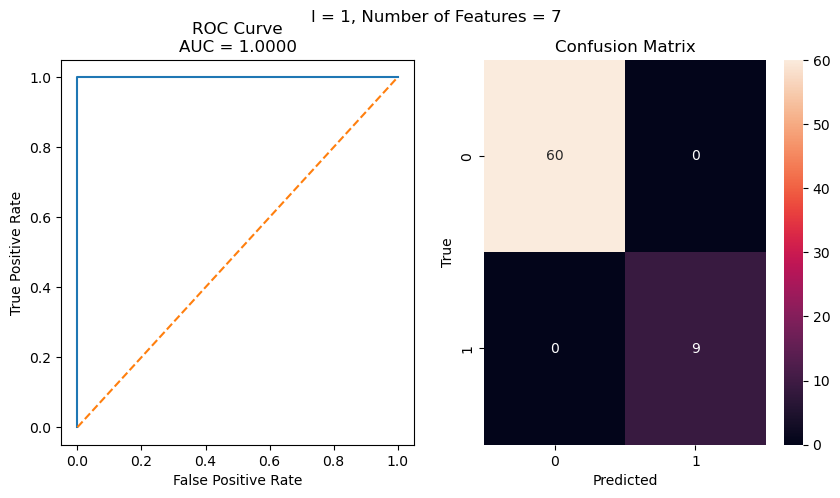

l = 1, Number of Relevant Features = 7, Features:
 Index(['mean_avg_rss11', '1st_quart_avg_rss11', '3rd_quart_avg_rss11',
       'max_var_rss11', 'min_avg_rss31', 'max_avg_rss31',
       '1st_quart_avg_rss31'],
      dtype='object')
   Model Params
0     -0.067321
1     -0.051822
2     -0.451731
3     -0.359320
4      0.423032
5      0.595715
6      0.220951


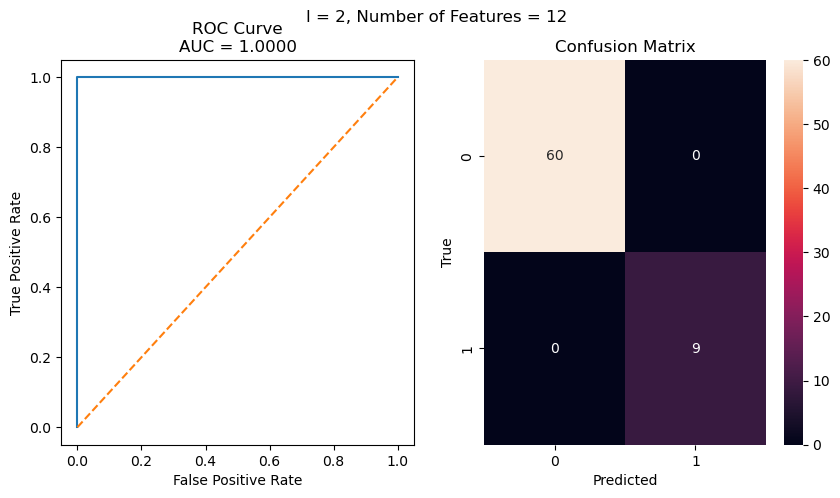

l = 2, Number of Relevant Features = 12, Features:
 Index(['median_avg_rss11', '1st_quart_avg_rss11', 'max_var_rss11',
       '1st_quart_avg_rss21', 'min_avg_rss31', 'max_avg_rss31',
       'max_avg_rss12', 'median_avg_rss12', '3rd_quart_avg_rss12',
       'max_var_rss12', 'min_avg_rss32', '1st_quart_avg_rss32'],
      dtype='object')
    Model Params
0      -0.197694
1      -0.058853
2      -0.349103
3      -0.052068
4       0.483970
5       0.510943
6      -0.048111
7      -0.136704
8      -0.046183
9      -0.113022
10      0.021003
11      0.152958


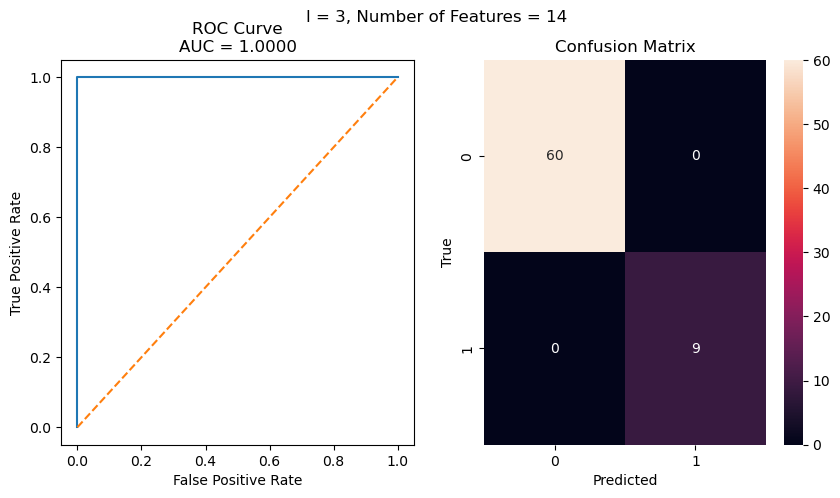

l = 3, Number of Relevant Features = 14, Features:
 Index(['median_avg_rss11', '3rd_quart_avg_rss11', 'max_var_rss11',
       '1st_quart_avg_rss21', 'min_avg_rss31', 'max_avg_rss31',
       '3rd_quart_avg_rss31', 'max_avg_rss12', '3rd_quart_avg_rss12',
       'min_avg_rss32', 'max_avg_rss13', 'max_var_rss13', 'min_avg_rss33',
       'max_var_rss33'],
      dtype='object')
    Model Params
0      -0.056571
1      -0.059050
2      -0.389072
3      -0.065665
4       0.169323
5       0.506046
6       0.120170
7      -0.071420
8      -0.201084
9       0.067993
10     -0.048730
11     -0.000599
12      0.081119
13     -0.002694


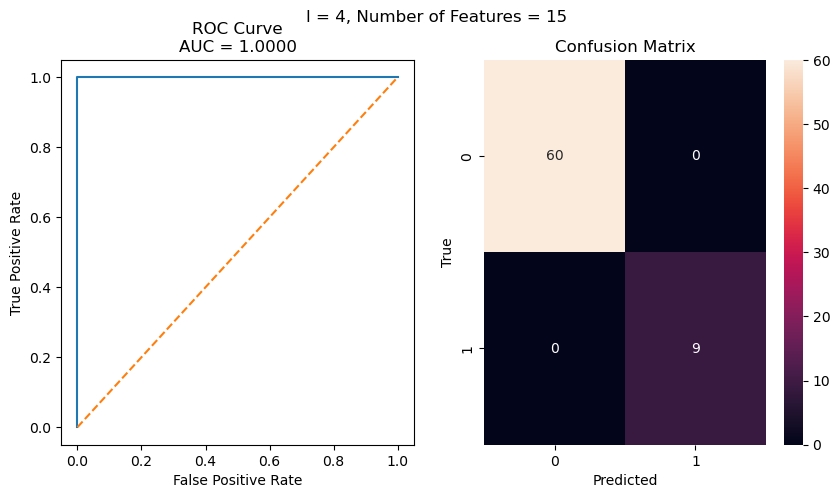

l = 4, Number of Relevant Features = 15, Features:
 Index(['max_avg_rss11', '3rd_quart_avg_rss11', 'max_var_rss11',
       '1st_quart_avg_rss21', 'max_avg_rss31', 'mean_avg_rss31',
       '1st_quart_avg_rss31', '3rd_quart_avg_rss31', 'max_avg_rss12',
       'mean_avg_rss13', 'median_avg_rss13', '1st_quart_avg_rss13',
       '3rd_quart_avg_rss13', 'min_avg_rss33', 'max_var_rss33'],
      dtype='object')
    Model Params
0      -0.049379
1      -0.037400
2      -0.229781
3      -0.116756
4       0.398735
5       0.000928
6       0.024937
7       0.282716
8      -0.010191
9      -0.011434
10     -0.082643
11     -0.093807
12     -0.159863
13      0.162483
14     -0.164655


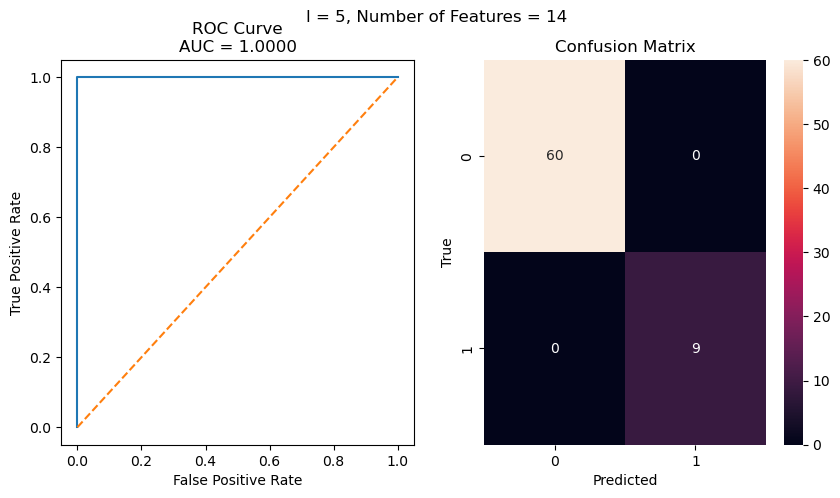

l = 5, Number of Relevant Features = 14, Features:
 Index(['min_avg_rss21', 'min_avg_rss31', 'max_avg_rss31', 'mean_avg_rss31',
       '3rd_quart_avg_rss31', 'max_var_rss12', 'min_avg_rss32',
       'max_avg_rss13', '3rd_quart_avg_rss13', 'max_avg_rss14',
       '3rd_quart_avg_rss14', 'max_var_rss14', 'min_avg_rss34',
       '1st_quart_avg_rss35'],
      dtype='object')
    Model Params
0      -0.146721
1       0.064186
2       0.212900
3       0.117383
4       0.356897
5      -0.207940
6       0.031366
7      -0.082816
8      -0.222725
9      -0.026099
10     -0.140022
11     -0.002113
12      0.036830
13      0.126458


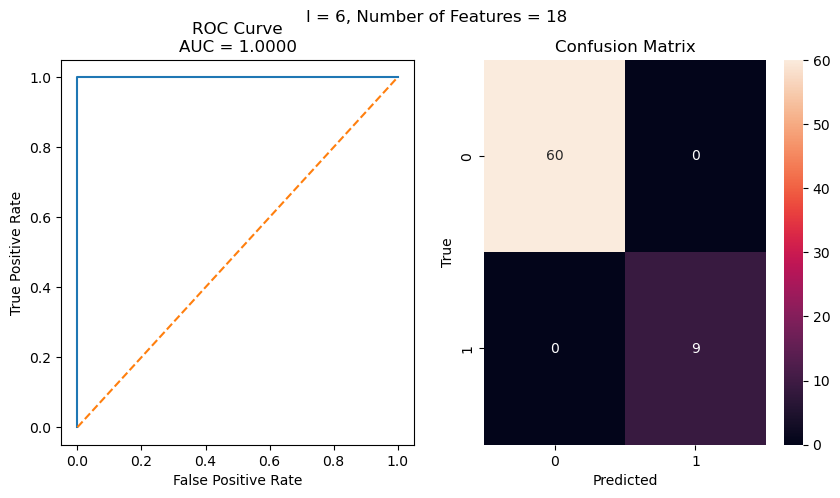

l = 6, Number of Relevant Features = 18, Features:
 Index(['max_avg_rss11', '3rd_quart_avg_rss11', 'min_avg_rss21',
       'min_avg_rss31', 'max_avg_rss31', 'mean_avg_rss31',
       '3rd_quart_avg_rss31', 'max_var_rss12', 'min_avg_rss32',
       'max_avg_rss32', 'max_avg_rss13', 'max_avg_rss14', 'median_avg_rss14',
       '3rd_quart_avg_rss14', 'min_avg_rss34', '3rd_quart_avg_rss15',
       'max_var_rss16', '1st_quart_avg_rss36'],
      dtype='object')
    Model Params
0      -0.054698
1      -0.021830
2      -0.082296
3       0.026087
4       0.141721
5       0.107375
6       0.207467
7      -0.221584
8       0.120475
9       0.140151
10     -0.040951
11     -0.002634
12     -0.132340
13     -0.082255
14      0.125872
15     -0.119366
16     -0.066039
17      0.083417


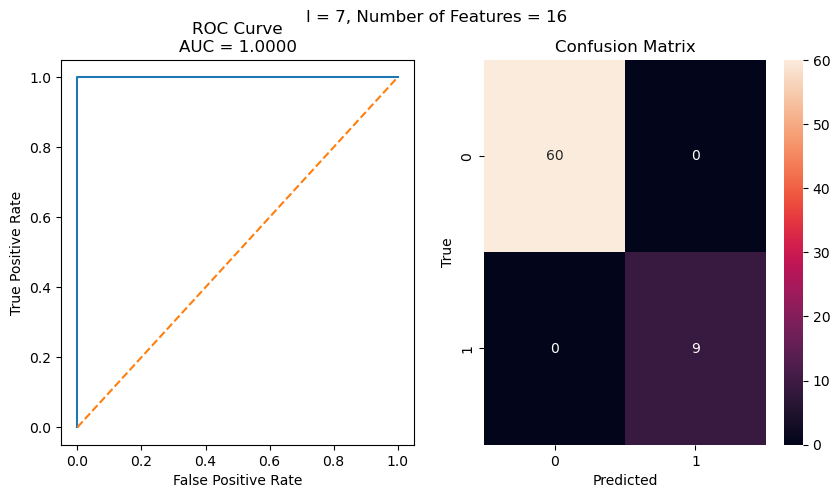

l = 7, Number of Relevant Features = 16, Features:
 Index(['max_avg_rss11', '3rd_quart_avg_rss11', 'min_avg_rss21',
       'max_avg_rss31', '3rd_quart_avg_rss31', 'max_var_rss12',
       'min_avg_rss32', 'max_avg_rss32', 'max_avg_rss14',
       '3rd_quart_avg_rss14', 'max_var_rss14', 'max_avg_rss15',
       '3rd_quart_avg_rss15', 'min_avg_rss35', 'min_avg_rss36',
       '1st_quart_avg_rss37'],
      dtype='object')
    Model Params
0      -0.047792
1      -0.002873
2      -0.080225
3       0.176698
4       0.289772
5      -0.117822
6       0.197614
7       0.090081
8      -0.160227
9      -0.083280
10     -0.013008
11     -0.088786
12     -0.079985
13      0.073701
14      0.122816
15      0.048656


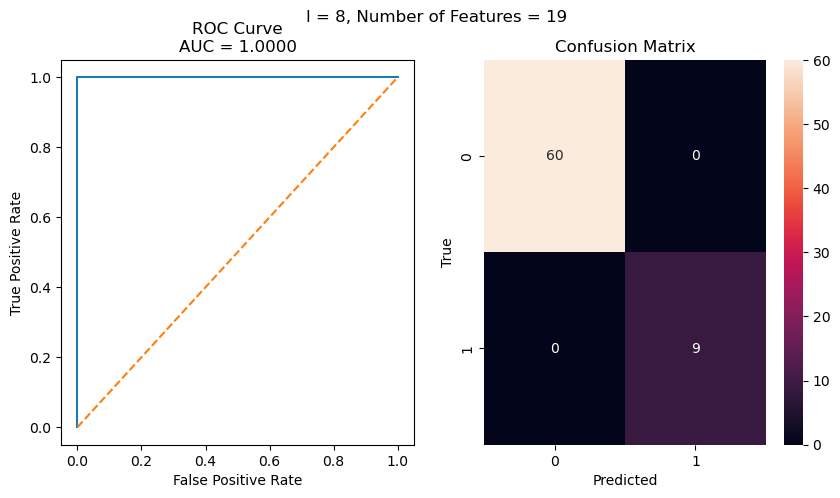

l = 8, Number of Relevant Features = 19, Features:
 Index(['max_avg_rss11', '3rd_quart_avg_rss11', 'max_avg_rss31',
       '3rd_quart_avg_rss31', 'max_avg_rss12', 'max_var_rss12',
       'min_avg_rss22', 'max_avg_rss32', 'mean_avg_rss32',
       '3rd_quart_avg_rss32', 'min_avg_rss33', 'max_avg_rss15',
       'median_avg_rss15', '3rd_quart_avg_rss15', 'max_avg_rss16',
       '3rd_quart_avg_rss16', 'max_var_rss16', 'min_avg_rss37',
       'min_avg_rss28'],
      dtype='object')
    Model Params
0      -0.035014
1      -0.001122
2       0.142722
3       0.090229
4      -0.004103
5      -0.045423
6      -0.005307
7       0.112309
8       0.027527
9       0.214897
10      0.138684
11     -0.006102
12     -0.103312
13     -0.132331
14     -0.100990
15     -0.092177
16     -0.202327
17      0.250905
18     -0.000232


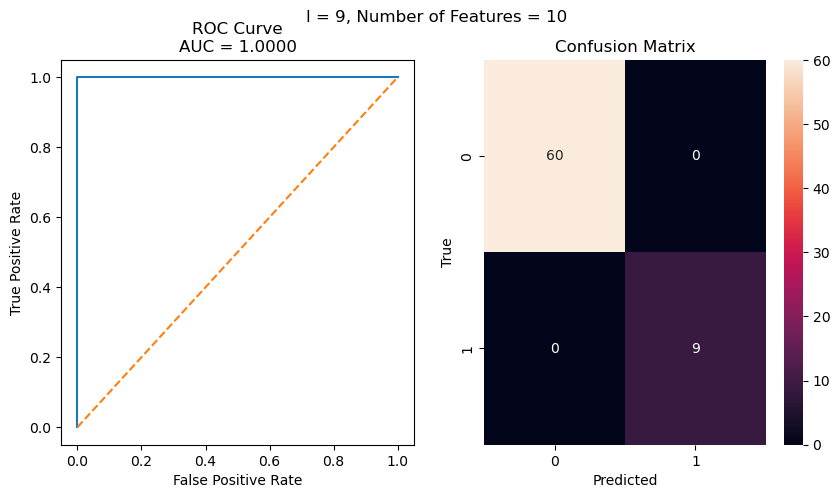

l = 9, Number of Relevant Features = 10, Features:
 Index(['max_avg_rss11', 'max_avg_rss31', 'median_avg_rss32',
       '3rd_quart_avg_rss32', 'min_avg_rss33', 'max_avg_rss15',
       'max_var_rss15', 'max_avg_rss16', 'max_avg_rss17', 'min_avg_rss38'],
      dtype='object')
   Model Params
0     -0.033952
1      0.211082
2      0.417979
3      0.033694
4      0.093475
5     -0.322920
6     -0.051299
7     -0.048718
8     -0.075644
9      0.237440


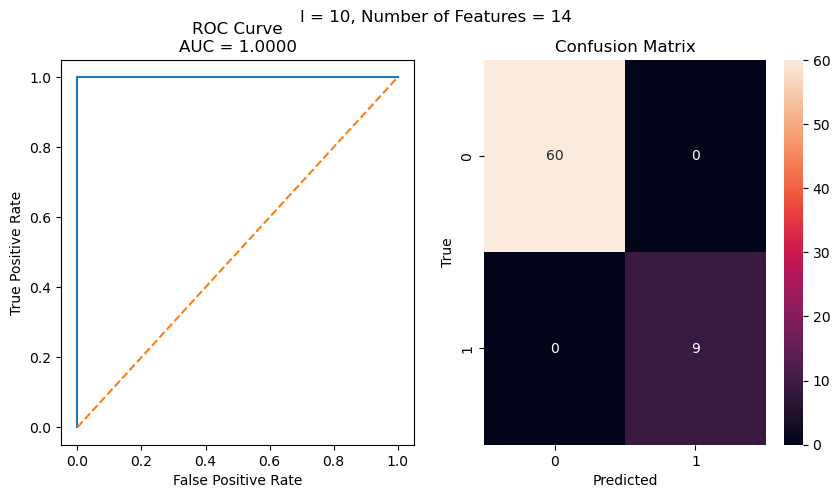

l = 10, Number of Relevant Features = 14, Features:
 Index(['max_avg_rss11', 'max_avg_rss31', 'median_avg_rss32',
       '1st_quart_avg_rss32', '3rd_quart_avg_rss32', 'min_avg_rss14',
       '1st_quart_avg_rss24', 'max_avg_rss15', 'max_avg_rss16',
       'median_avg_rss16', '3rd_quart_avg_rss16', 'max_avg_rss18',
       '3rd_quart_avg_rss18', 'min_avg_rss39'],
      dtype='object')
    Model Params
0      -0.034533
1       0.123150
2       0.131820
3       0.365240
4       0.054382
5       0.062468
6      -0.006509
7      -0.088138
8      -0.091806
9      -0.015489
10     -0.121422
11     -0.121829
12     -0.036771
13      0.290314


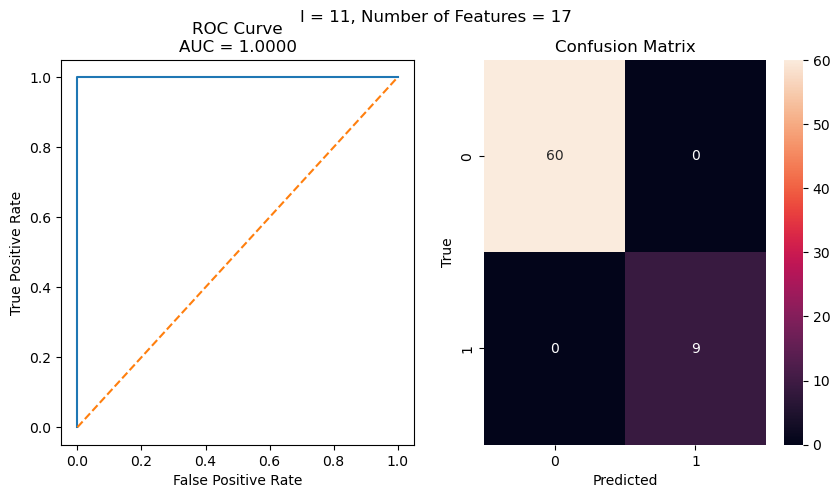

l = 11, Number of Relevant Features = 17, Features:
 Index(['max_avg_rss31', 'max_avg_rss12', 'min_avg_rss32', 'mean_avg_rss32',
       'median_avg_rss32', '1st_quart_avg_rss32', 'max_var_rss13',
       'min_avg_rss34', 'max_avg_rss16', 'median_avg_rss17',
       '3rd_quart_avg_rss17', 'max_avg_rss18', '3rd_quart_avg_rss18',
       '3rd_quart_avg_rss19', 'min_avg_rss110', 'max_avg_rss210',
       'min_avg_rss310'],
      dtype='object')
    Model Params
0       0.044893
1      -0.053434
2       0.112848
3       0.079309
4       0.139609
5       0.286706
6      -0.010534
7       0.013307
8      -0.183918
9      -0.018676
10     -0.066588
11     -0.069823
12     -0.020626
13     -0.025405
14      0.029210
15     -0.029620
16      0.270972


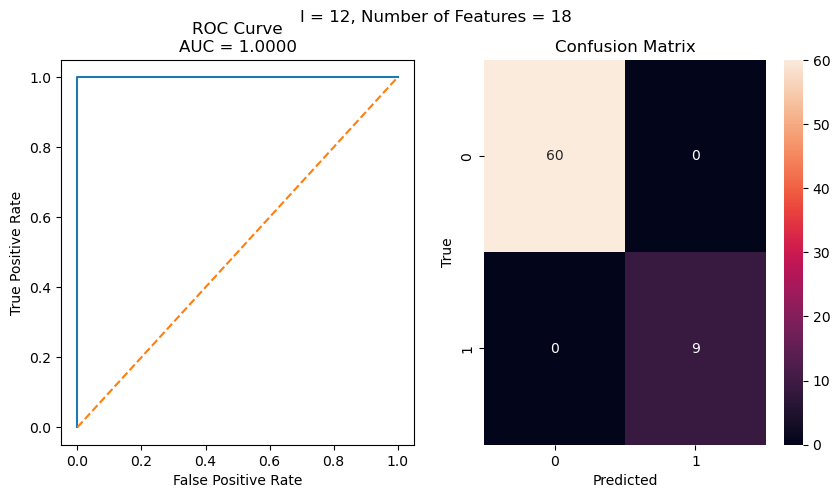

l = 12, Number of Relevant Features = 18, Features:
 Index(['max_avg_rss12', 'min_avg_rss32', 'mean_avg_rss32', 'median_avg_rss32',
       '1st_quart_avg_rss32', 'max_avg_rss13', 'min_avg_rss34',
       'min_avg_rss25', 'max_avg_rss16', '3rd_quart_avg_rss16',
       'max_avg_rss17', '3rd_quart_avg_rss17', 'max_avg_rss18',
       '3rd_quart_avg_rss18', 'max_avg_rss19', '3rd_quart_avg_rss19',
       'max_avg_rss211', 'min_avg_rss311'],
      dtype='object')
    Model Params
0      -0.022411
1       0.175607
2       0.060499
3       0.079085
4       0.297815
5      -0.002009
6       0.098451
7      -0.000024
8      -0.077698
9      -0.004392
10     -0.106360
11     -0.037219
12     -0.057105
13     -0.027058
14     -0.041585
15     -0.014732
16     -0.041286
17      0.244906


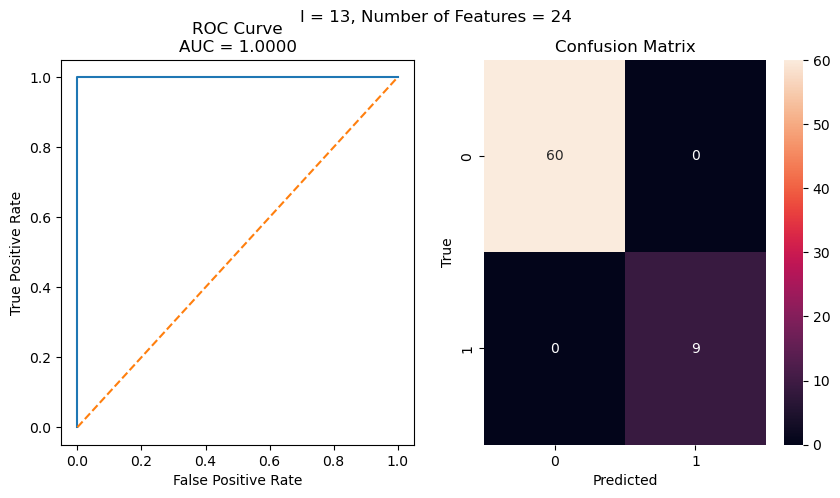

l = 13, Number of Relevant Features = 24, Features:
 Index(['max_avg_rss11', 'max_avg_rss12', 'min_avg_rss32', 'mean_avg_rss32',
       'median_avg_rss32', '1st_quart_avg_rss32', '3rd_quart_avg_rss32',
       'max_avg_rss13', 'min_avg_rss34', 'max_avg_rss16', 'max_avg_rss26',
       'max_avg_rss17', 'max_avg_rss18', 'mean_avg_rss18', 'median_avg_rss18',
       '3rd_quart_avg_rss18', 'max_avg_rss19', '3rd_quart_avg_rss19',
       'max_avg_rss110', '3rd_quart_avg_rss110', 'max_avg_rss111',
       'max_avg_rss212', 'min_avg_rss312', 'max_avg_rss113'],
      dtype='object')
    Model Params
0      -0.019610
1      -0.036006
2       0.295020
3       0.085950
4       0.098730
5       0.119671
6       0.026012
7      -0.002366
8       0.153247
9      -0.014214
10     -0.009922
11     -0.057182
12     -0.023616
13     -0.003230
14     -0.019919
15     -0.057410
16     -0.066492
17     -0.022087
18     -0.049316
19     -0.017803
20     -0.020707
21     -0.009556
22      0.234575
23     -0.00857

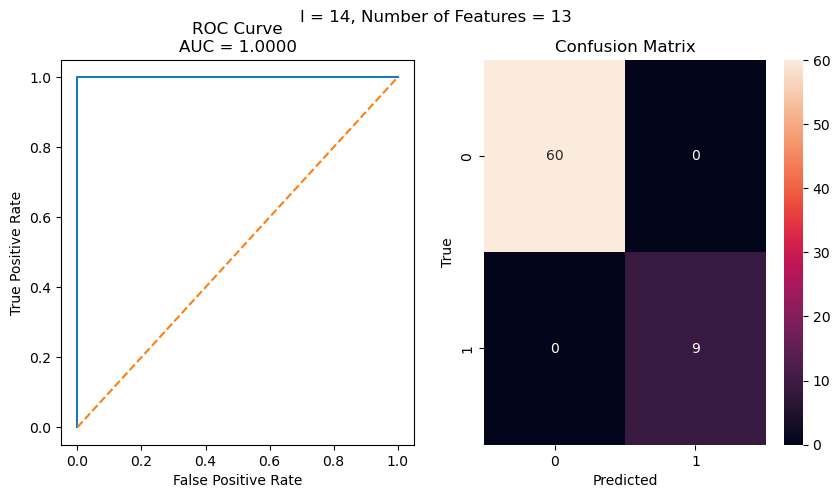

l = 14, Number of Relevant Features = 13, Features:
 Index(['max_avg_rss12', 'min_avg_rss32', 'median_avg_rss32',
       '3rd_quart_avg_rss32', 'min_avg_rss34', 'max_avg_rss17',
       'max_avg_rss18', '3rd_quart_avg_rss18', 'max_avg_rss19',
       'max_avg_rss110', 'max_avg_rss111', 'min_avg_rss312', 'min_avg_rss313'],
      dtype='object')
    Model Params
0      -0.029255
1       0.372666
2       0.140020
3       0.029457
4       0.247765
5      -0.082506
6      -0.173751
7      -0.000764
8      -0.026488
9      -0.067087
10     -0.018441
11      0.160648
12      0.042904


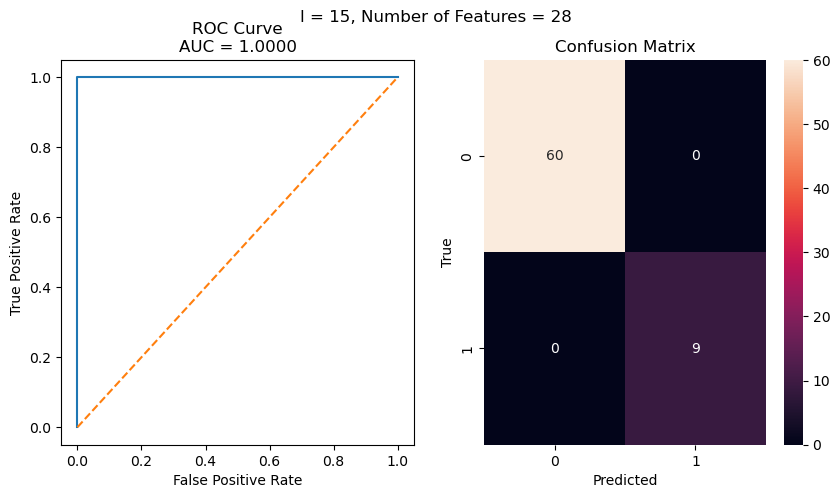

l = 15, Number of Relevant Features = 28, Features:
 Index(['max_avg_rss31', 'max_avg_rss12', 'min_avg_rss32', 'max_avg_rss32',
       'mean_avg_rss32', 'median_avg_rss32', '3rd_quart_avg_rss32',
       'mean_avg_rss33', 'median_avg_rss33', '1st_quart_avg_rss33',
       '3rd_quart_avg_rss33', 'min_avg_rss35', 'min_avg_rss26',
       'max_avg_rss17', 'max_avg_rss18', 'max_avg_rss19', 'mean_avg_rss19',
       'median_avg_rss19', '3rd_quart_avg_rss19', 'max_avg_rss110',
       '3rd_quart_avg_rss110', 'max_avg_rss111', '3rd_quart_avg_rss111',
       'max_avg_rss112', '3rd_quart_avg_rss112', 'min_avg_rss313',
       'max_avg_rss214', 'min_avg_rss314'],
      dtype='object')
    Model Params
0       0.024970
1      -0.017378
2       0.165424
3       0.000018
4       0.033178
5       0.069360
6       0.056259
7       0.044830
8       0.124131
9       0.128810
10      0.040768
11      0.154778
12     -0.001733
13     -0.019185
14     -0.050795
15     -0.044399
16     -0.017607
17     -0.031739

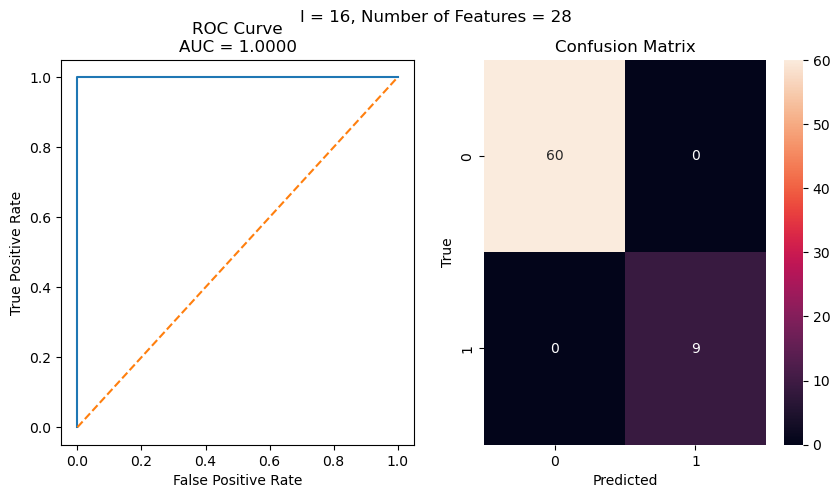

l = 16, Number of Relevant Features = 28, Features:
 Index(['max_avg_rss31', 'max_avg_rss12', 'min_avg_rss32', 'mean_avg_rss32',
       '3rd_quart_avg_rss32', 'max_avg_rss13', 'min_avg_rss33',
       'mean_avg_rss33', 'median_avg_rss33', '1st_quart_avg_rss33',
       '3rd_quart_avg_rss33', 'min_avg_rss35', 'max_avg_rss18',
       'max_avg_rss19', '3rd_quart_avg_rss19', 'max_avg_rss110',
       'mean_avg_rss110', 'median_avg_rss110', '3rd_quart_avg_rss110',
       'max_avg_rss111', '3rd_quart_avg_rss111', 'max_avg_rss112',
       '3rd_quart_avg_rss112', 'max_avg_rss113', '3rd_quart_avg_rss113',
       'min_avg_rss314', 'max_avg_rss215', 'min_avg_rss315'],
      dtype='object')
    Model Params
0       0.018396
1      -0.013388
2       0.153769
3       0.007024
4       0.036178
5      -0.001941
6       0.095372
7       0.086047
8       0.098246
9       0.109431
10      0.053193
11      0.139486
12     -0.068410
13     -0.067015
14     -0.025222
15     -0.022437
16     -0.010920
17     -0

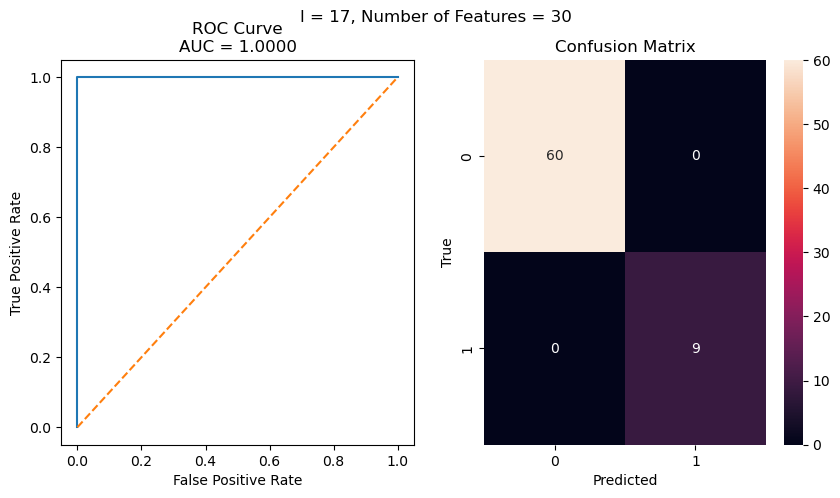

l = 17, Number of Relevant Features = 30, Features:
 Index(['max_avg_rss11', 'max_avg_rss31', 'max_avg_rss12', 'min_avg_rss32',
       'mean_avg_rss32', '3rd_quart_avg_rss32', 'max_avg_rss13',
       'min_avg_rss33', 'mean_avg_rss33', 'median_avg_rss33',
       '1st_quart_avg_rss33', '3rd_quart_avg_rss33', 'max_avg_rss14',
       'min_avg_rss35', '3rd_quart_avg_rss18', 'max_avg_rss19',
       'max_avg_rss110', 'mean_avg_rss110', 'median_avg_rss110',
       '3rd_quart_avg_rss110', 'max_avg_rss111', '3rd_quart_avg_rss111',
       'max_avg_rss112', '3rd_quart_avg_rss112', 'max_avg_rss113',
       '3rd_quart_avg_rss113', 'min_avg_rss314', 'max_avg_rss215',
       '3rd_quart_avg_rss215', 'min_avg_rss315'],
      dtype='object')
    Model Params
0      -0.000039
1       0.054935
2      -0.018463
3       0.092430
4       0.000312
5       0.044296
6      -0.019465
7       0.201759
8       0.039864
9       0.097000
10      0.032701
11      0.064507
12     -0.000169
13      0.083489
14     -0.00

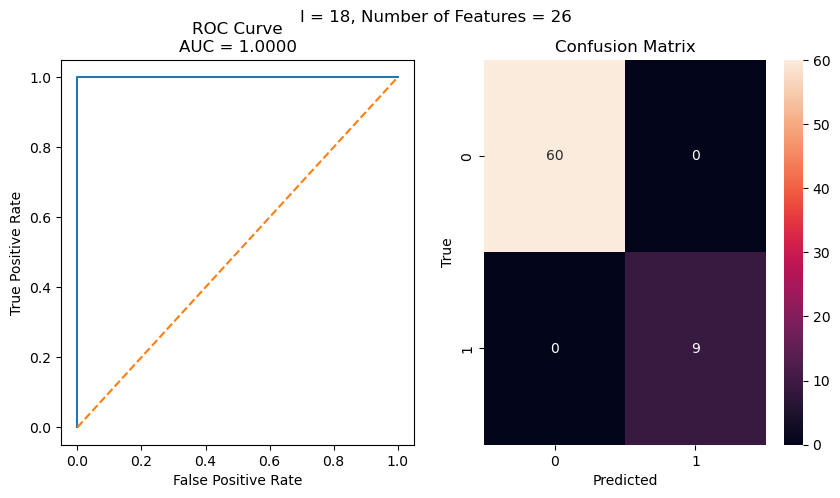

l = 18, Number of Relevant Features = 26, Features:
 Index(['max_avg_rss11', 'max_avg_rss31', 'max_avg_rss12', 'min_avg_rss32',
       'max_avg_rss13', 'min_avg_rss33', 'mean_avg_rss33', 'median_avg_rss33',
       '1st_quart_avg_rss33', 'max_avg_rss15', 'min_avg_rss35',
       'max_avg_rss19', 'max_avg_rss110', '3rd_quart_avg_rss110',
       'max_avg_rss111', 'median_avg_rss111', '3rd_quart_avg_rss111',
       'max_avg_rss112', '3rd_quart_avg_rss112', 'max_avg_rss113',
       '3rd_quart_avg_rss113', 'max_avg_rss114', '3rd_quart_avg_rss114',
       'min_avg_rss315', 'min_avg_rss316', 'min_avg_rss317'],
      dtype='object')
    Model Params
0      -0.004434
1       0.027318
2      -0.024359
3       0.123002
4      -0.024365
5       0.160435
6       0.040693
7       0.072637
8       0.149090
9      -0.002294
10      0.150449
11     -0.055280
12     -0.068501
13     -0.022412
14     -0.030259
15     -0.018451
16     -0.027179
17     -0.047742
18     -0.012155
19     -0.041860
20     -0.00

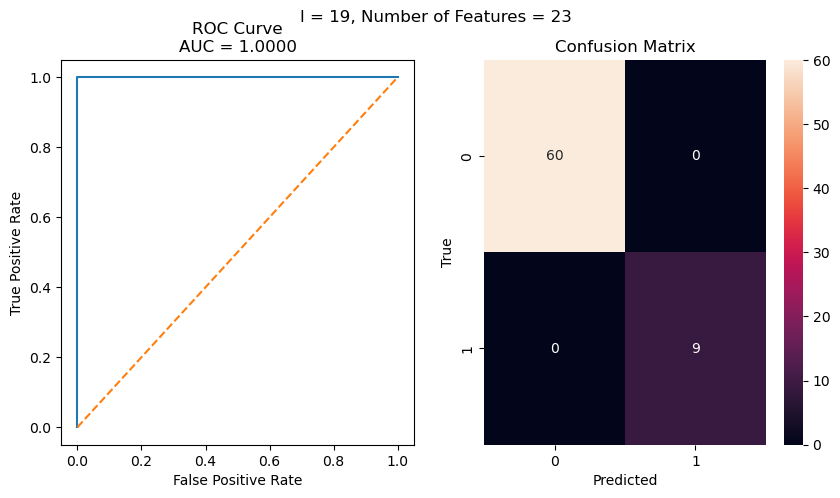

l = 19, Number of Relevant Features = 23, Features:
 Index(['min_avg_rss32', 'min_avg_rss33', 'mean_avg_rss33', 'median_avg_rss33',
       '1st_quart_avg_rss33', 'min_avg_rss36', 'max_avg_rss28',
       'max_avg_rss19', 'max_avg_rss110', 'max_avg_rss111', 'mean_avg_rss111',
       'median_avg_rss111', '3rd_quart_avg_rss111', 'max_avg_rss112',
       '3rd_quart_avg_rss112', 'max_avg_rss113', '3rd_quart_avg_rss113',
       'max_avg_rss114', '3rd_quart_avg_rss114', 'max_avg_rss115',
       '3rd_quart_avg_rss115', 'max_avg_rss217', 'min_avg_rss317'],
      dtype='object')
    Model Params
0       0.091797
1       0.220667
2       0.056704
3       0.049300
4       0.182062
5       0.064117
6      -0.014816
7      -0.010368
8      -0.039827
9      -0.046197
10     -0.016635
11     -0.016582
12     -0.042406
13     -0.026485
14     -0.014575
15     -0.034445
16     -0.014362
17     -0.033429
18     -0.009766
19     -0.032614
20     -0.013077
21     -0.080570
22      0.213550


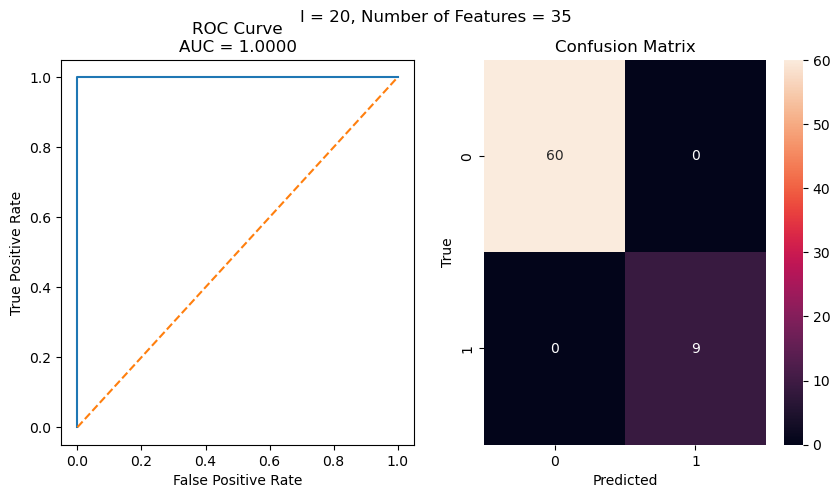

l = 20, Number of Relevant Features = 35, Features:
 Index(['max_avg_rss31', 'max_avg_rss12', 'min_avg_rss32', 'max_avg_rss13',
       'min_avg_rss33', 'mean_avg_rss33', 'median_avg_rss33',
       '1st_quart_avg_rss33', 'max_avg_rss14', 'median_avg_rss34',
       '1st_quart_avg_rss34', 'min_avg_rss36', 'max_avg_rss19',
       'max_avg_rss29', 'max_avg_rss110', 'max_avg_rss111', 'max_avg_rss112',
       'mean_avg_rss112', 'median_avg_rss112', '3rd_quart_avg_rss112',
       'max_avg_rss113', '3rd_quart_avg_rss113', 'max_avg_rss114',
       '3rd_quart_avg_rss114', 'max_avg_rss115', '3rd_quart_avg_rss115',
       'min_avg_rss315', 'max_avg_rss116', '3rd_quart_avg_rss116',
       'max_avg_rss216', 'max_avg_rss117', 'min_avg_rss317', 'max_avg_rss218',
       'min_avg_rss318', 'min_avg_rss319'],
      dtype='object')
    Model Params
0       0.023771
1      -0.020010
2       0.071152
3      -0.010100
4       0.242963
5       0.047861
6       0.045069
7       0.124997
8      -0.002638
9       

In [10]:
X_reduced_train = {}
X_reduced_test = {}
model = LogisticRegression(penalty='l1', solver='liblinear', max_iter=100)

for l in range(1, 21, 1):
    model.fit(X_train[l], Y_train)
    Y_pred = model.predict(X_train[l])

    indicies = [i for i in range(len(model.coef_[0])) if model.coef_[0][i] != 0]
    X_reduced_train[l] = X_train[l].iloc[:, indicies]
    X_reduced_test[l] = X_test[l].iloc[:, indicies]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 5))
    fig.suptitle(f'l = {l}, Number of Features = {len(indicies)}')
    FPR, TPR, thresholds = roc_curve(Y_train, Y_pred) 
    ax1.plot(FPR, TPR)
    ax1.plot([0, 1], [0, 1], linestyle = '--')  
    ax1.set(xlabel="False Positive Rate", ylabel="True Positive Rate")
    ax1.set_title(f'ROC Curve\nAUC = {roc_auc_score(Y_train, Y_pred):.4f}')
    sns.heatmap(confusion_matrix(Y_train, Y_pred), annot=True)
    ax2.set(xlabel="Predicted", ylabel="True")
    ax2.set_title("Confusion Matrix")
    plt.show()
    
 
    
    print(f'l = {l}, Number of Relevant Features = {len(indicies)}, Features:\n', X_reduced_train[l].columns)
    print(pd.DataFrame({"Model Params": model.coef_[0][indicies]}))

In [11]:
for l in range(1, 21, 1):
    print(f'l = {l}')
    print("Cross Validation Scores:", cross_val_score(model, X_reduced_train[l], Y_train, cv=5))
    model.fit(X_reduced_train[l], Y_train)
    Y_pred = model.predict(X_reduced_test[l])
    print(f'Test Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')


l = 1
Cross Validation Scores: [0.85714286 1.         0.92857143 1.         1.        ]
Test Accuracy: 1.0000
l = 2
Cross Validation Scores: [0.85714286 1.         0.92857143 0.92857143 1.        ]
Test Accuracy: 1.0000
l = 3
Cross Validation Scores: [0.85714286 1.         1.         0.92857143 1.        ]
Test Accuracy: 1.0000
l = 4
Cross Validation Scores: [0.92857143 1.         1.         0.92857143 1.        ]
Test Accuracy: 0.9474
l = 5
Cross Validation Scores: [0.92857143 1.         0.92857143 0.92857143 1.        ]
Test Accuracy: 1.0000
l = 6
Cross Validation Scores: [0.85714286 1.         0.92857143 0.92857143 1.        ]
Test Accuracy: 1.0000
l = 7
Cross Validation Scores: [0.85714286 1.         0.92857143 0.92857143 1.        ]
Test Accuracy: 0.9474
l = 8
Cross Validation Scores: [0.85714286 1.         1.         0.92857143 1.        ]
Test Accuracy: 0.9474
l = 9
Cross Validation Scores: [0.85714286 1.         1.         0.92857143 1.        ]
Test Accuracy: 0.9474
l = 10
Cro

In [12]:
Y_train = []
Y_test = []
for i,a in enumerate(csv_files):
    if 'dataset1.csv' in a or 'dataset2.csv' in a or 'dataset3.csv' in a:
        if 'dataset3' in a and 'bending' in a:
            Y_train.append(a.split('/')[1])
        else:
            Y_test.append(a.split('/')[1])
    else:
        Y_train.append(a.split('/')[1])

Y_train = np.array(Y_train)
Y_test = np.array(Y_test)
label_binarizer = LabelBinarizer().fit(Y_train)
Y_onehot_test = label_binarizer.transform(Y_test)
Y_onehot_train = label_binarizer.transform(Y_train)

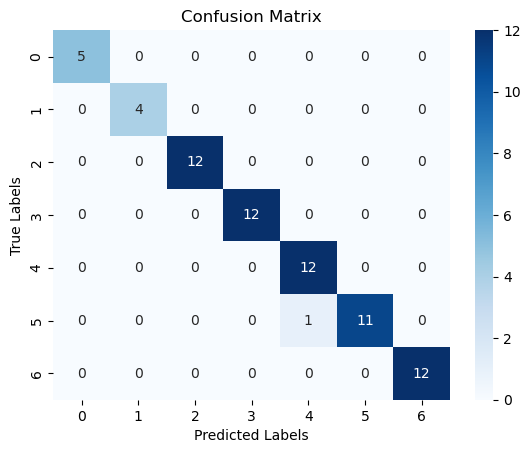

l = 1, Number of Relevant Features = 9, Features:
 Index(['min_avg_rss11', 'max_avg_rss11', '3rd_quart_avg_rss11',
       'min_avg_rss21', 'max_var_rss21', 'min_avg_rss31', 'max_avg_rss31',
       '1st_quart_avg_rss31', 'max_var_rss31'],
      dtype='object')
   Model Params
0     -0.036833
1     -0.090073
2     -0.091142
3      0.250630
4      0.024873
5      0.186369
6      0.114027
7      0.401332
8     -1.026845


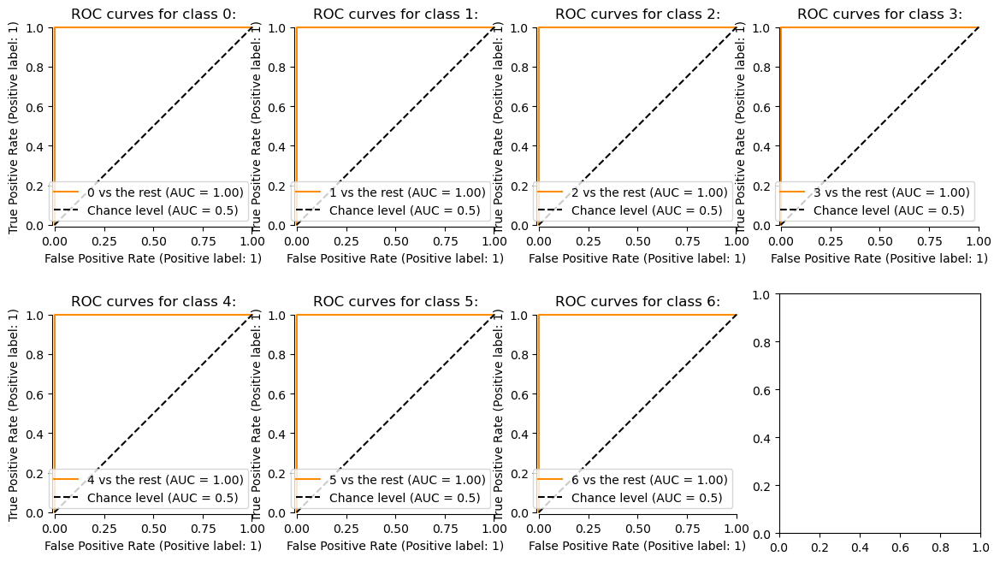

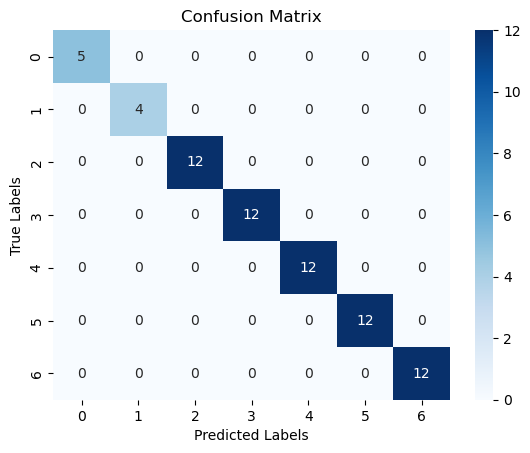

l = 2, Number of Relevant Features = 9, Features:
 Index(['max_avg_rss11', 'min_avg_rss21', 'max_avg_rss21', 'min_avg_rss31',
       'max_avg_rss31', 'max_var_rss31', '3rd_quart_avg_rss12',
       '3rd_quart_avg_rss22', '1st_quart_avg_rss32'],
      dtype='object')
   Model Params
0     -0.248830
1      0.238998
2      0.119439
3      0.163450
4      0.218225
5     -0.651220
6     -0.038206
7     -0.208415
8      0.333854


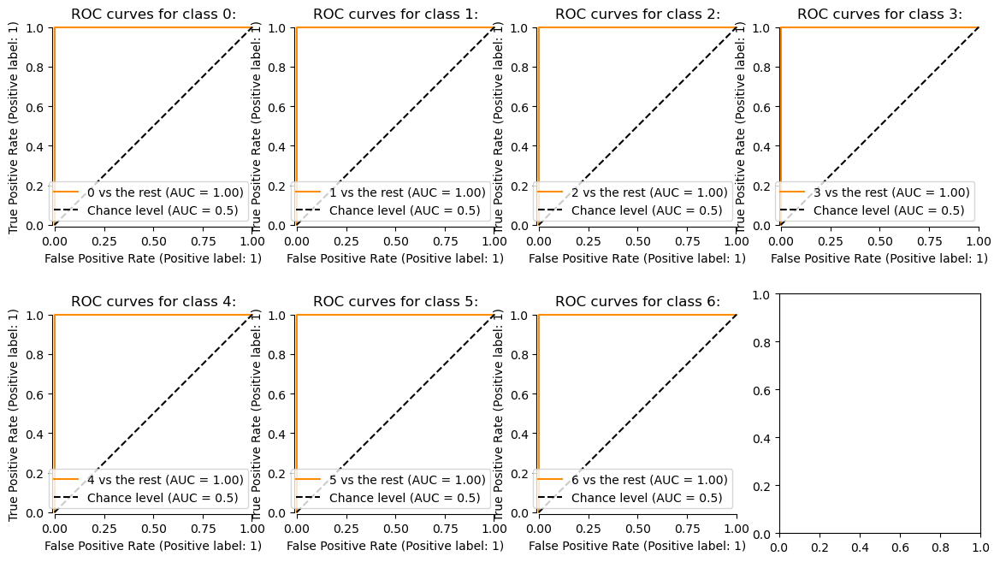

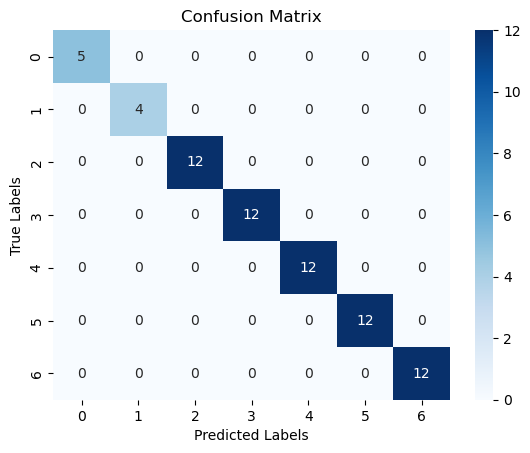

l = 3, Number of Relevant Features = 10, Features:
 Index(['max_avg_rss11', 'max_var_rss11', 'min_avg_rss21', 'max_avg_rss21',
       'min_avg_rss31', 'max_avg_rss31', 'max_var_rss31', 'min_avg_rss32',
       '3rd_quart_avg_rss23', '1st_quart_avg_rss33'],
      dtype='object')
   Model Params
0     -0.290967
1     -0.018601
2      0.138617
3      0.223300
4      0.298288
5      0.165278
6     -0.632242
7      0.035567
8     -0.165181
9      0.168559


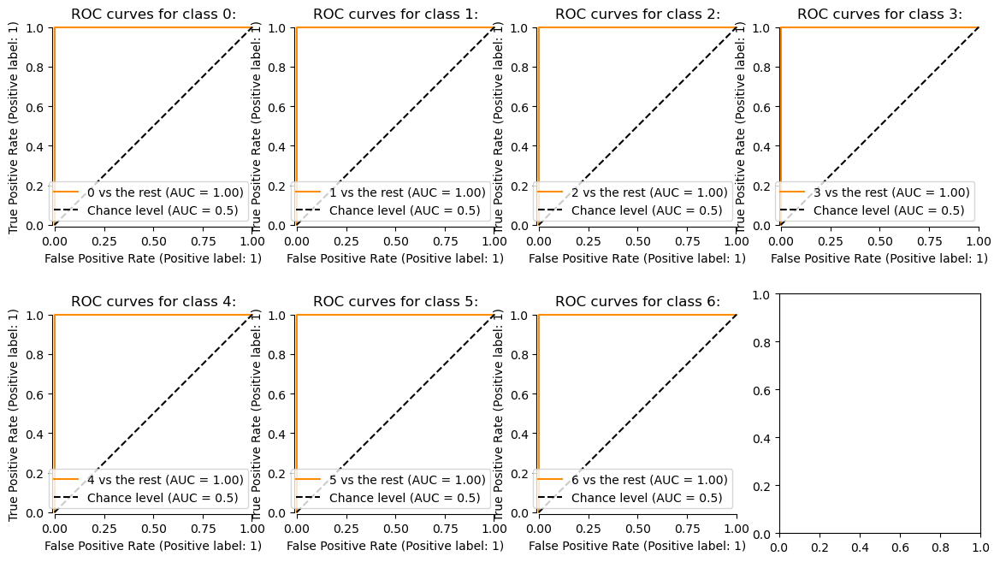

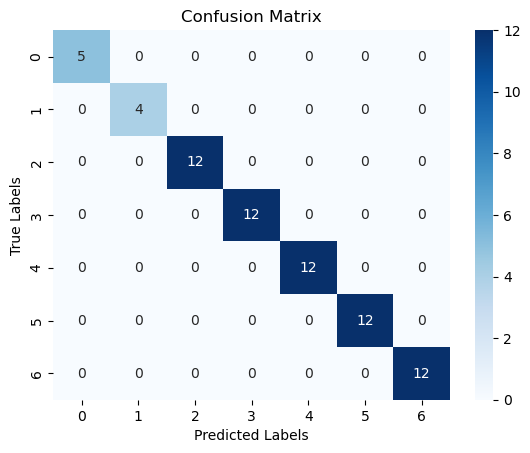

l = 4, Number of Relevant Features = 11, Features:
 Index(['max_avg_rss11', 'max_avg_rss21', 'max_var_rss31', 'mean_avg_rss22',
       'median_avg_rss22', '3rd_quart_avg_rss13', '1st_quart_avg_rss23',
       'min_avg_rss33', '3rd_quart_avg_rss24', 'min_avg_rss34',
       'max_avg_rss34'],
      dtype='object')
    Model Params
0      -0.225045
1       0.202318
2      -0.329039
3       0.005022
4       0.171432
5      -0.081379
6       0.043512
7       0.571100
8      -0.159205
9      -0.014395
10     -0.023995


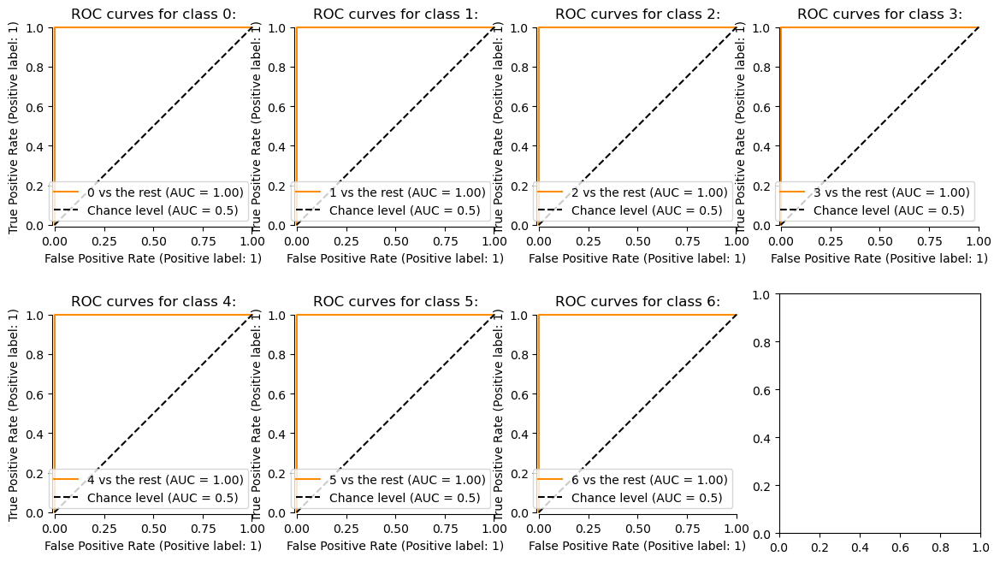

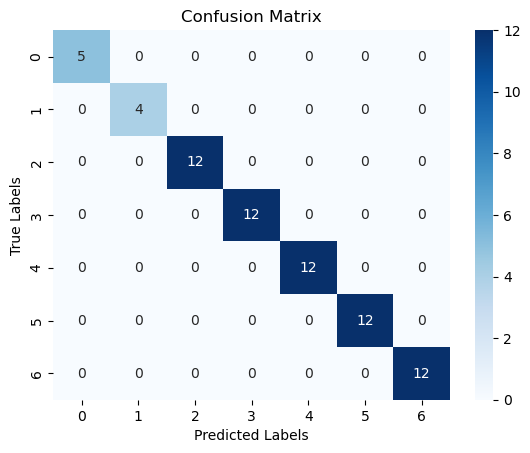

l = 5, Number of Relevant Features = 9, Features:
 Index(['max_avg_rss31', 'max_var_rss31', 'max_avg_rss12',
       '1st_quart_avg_rss22', 'min_avg_rss32', 'max_avg_rss32',
       'min_avg_rss14', 'min_avg_rss34', '3rd_quart_avg_rss25'],
      dtype='object')
   Model Params
0      0.450120
1     -0.774497
2     -0.181712
3      0.037930
4      0.209668
5     -0.053920
6     -0.079648
7      0.050174
8     -0.141356


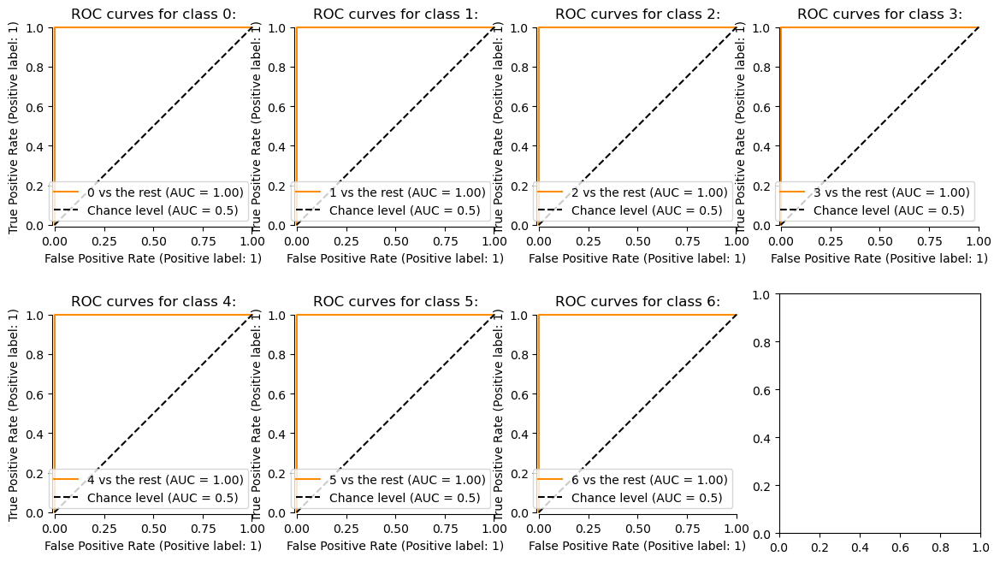

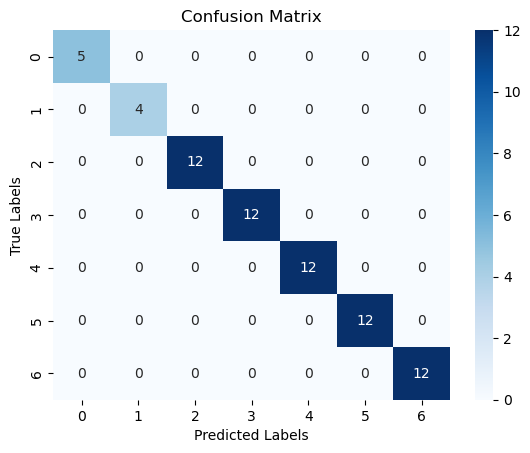

l = 6, Number of Relevant Features = 10, Features:
 Index(['max_avg_rss11', 'max_avg_rss31', 'max_var_rss31', 'max_avg_rss12',
       'min_avg_rss22', 'min_avg_rss13', 'max_avg_rss13', 'min_avg_rss23',
       'min_avg_rss34', 'max_avg_rss15'],
      dtype='object')
   Model Params
0     -0.084394
1      0.247384
2     -0.537541
3     -0.122216
4      0.138325
5     -0.082674
6     -0.055339
7      0.109321
8      0.421151
9     -0.001391


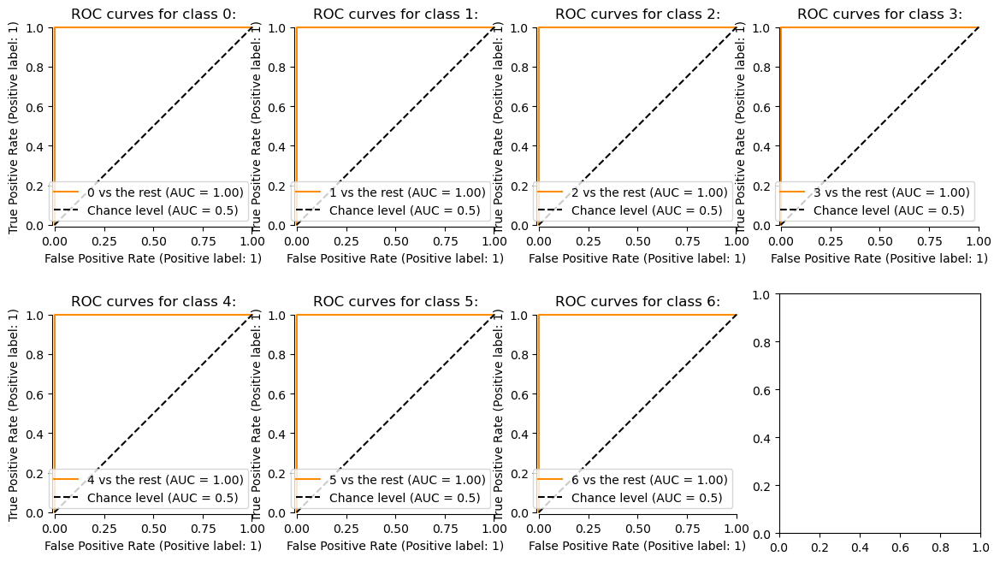

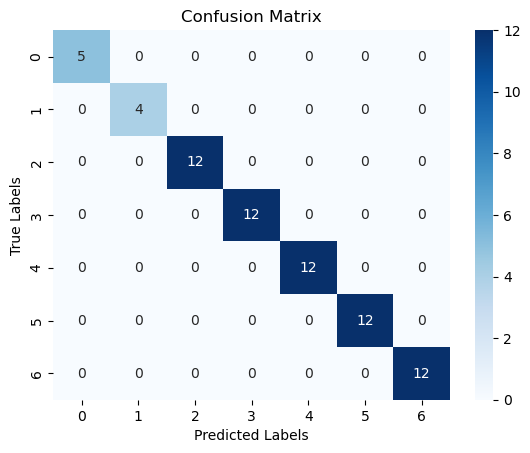

l = 7, Number of Relevant Features = 10, Features:
 Index(['max_avg_rss31', 'max_var_rss31', 'max_avg_rss12', 'min_avg_rss23',
       'min_avg_rss33', 'max_avg_rss15', 'min_avg_rss25', 'max_avg_rss25',
       'min_avg_rss35', 'min_avg_rss36'],
      dtype='object')
   Model Params
0      0.316540
1     -0.407407
2     -0.216666
3      0.332798
4      0.074396
5     -0.061883
6      0.032845
7     -0.178752
8      0.013104
9      0.184004


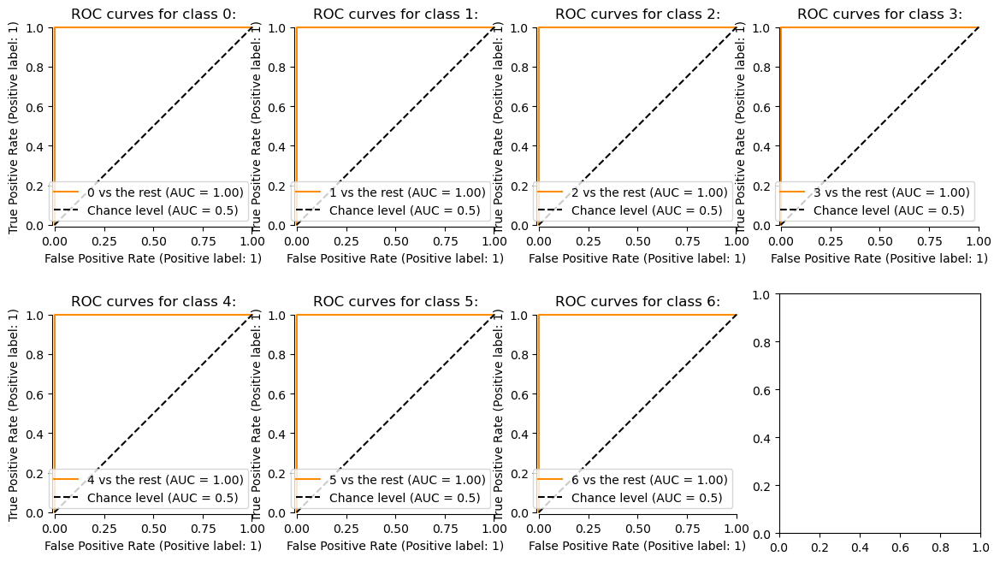

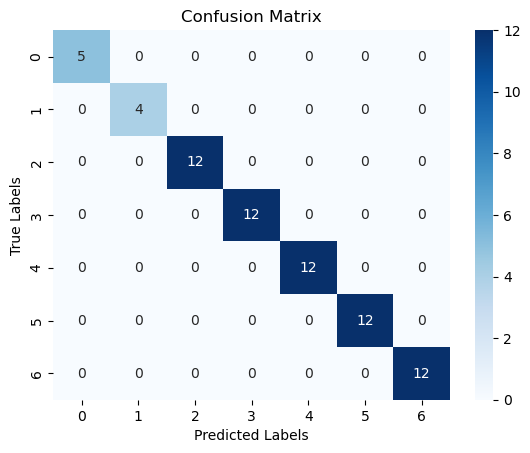

l = 8, Number of Relevant Features = 13, Features:
 Index(['max_avg_rss11', 'max_avg_rss21', 'max_var_rss31', 'max_avg_rss12',
       '1st_quart_avg_rss23', 'min_avg_rss33', 'max_avg_rss14',
       'max_avg_rss15', 'min_avg_rss25', 'min_avg_rss35', 'max_avg_rss16',
       'min_avg_rss26', '3rd_quart_avg_rss28'],
      dtype='object')
    Model Params
0      -0.087663
1       0.035703
2      -0.226298
3      -0.145760
4       0.204980
5       0.159502
6      -0.002828
7      -0.091080
8      -0.022656
9       0.429026
10     -0.003009
11      0.222151
12     -0.052911


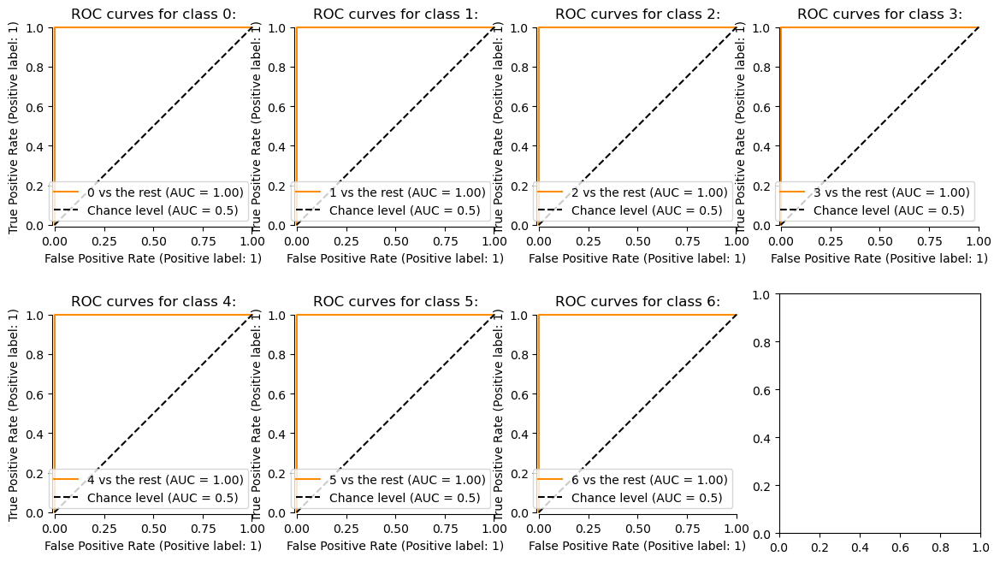

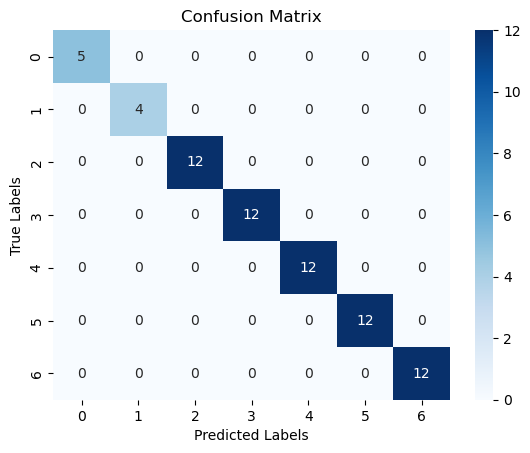

l = 9, Number of Relevant Features = 14, Features:
 Index(['max_avg_rss11', 'max_avg_rss21', '1st_quart_avg_rss21',
       'max_avg_rss12', '3rd_quart_avg_rss12', '1st_quart_avg_rss23',
       'min_avg_rss33', 'max_avg_rss14', '1st_quart_avg_rss24',
       'min_avg_rss15', 'max_avg_rss16', 'max_avg_rss26', 'min_avg_rss36',
       'max_avg_rss19'],
      dtype='object')
    Model Params
0      -0.048293
1       0.054931
2       0.086367
3      -0.097034
4      -0.029819
5       0.111259
6       0.572329
7      -0.020305
8       0.038992
9      -0.028816
10     -0.150437
11     -0.053128
12      0.173284
13     -0.024192


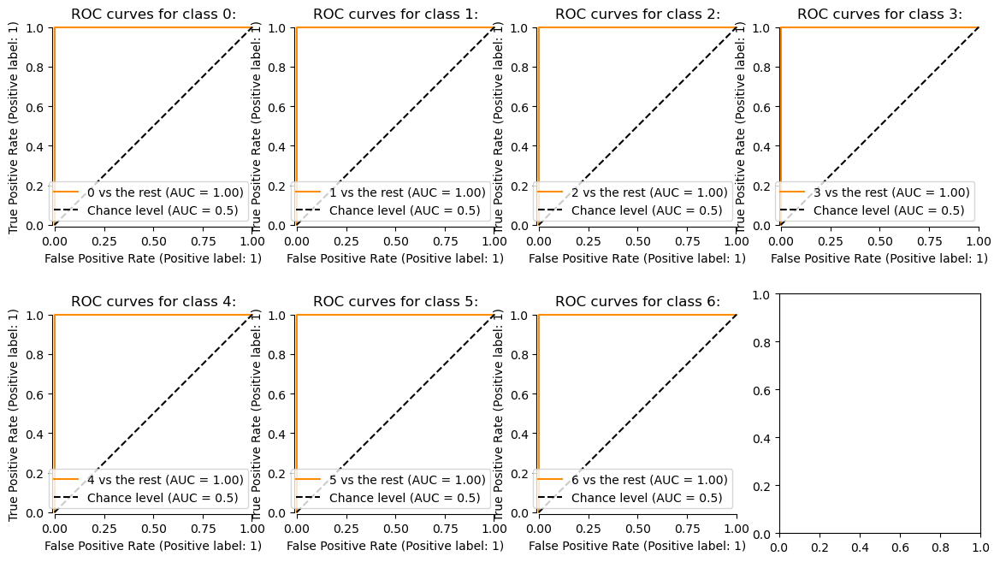

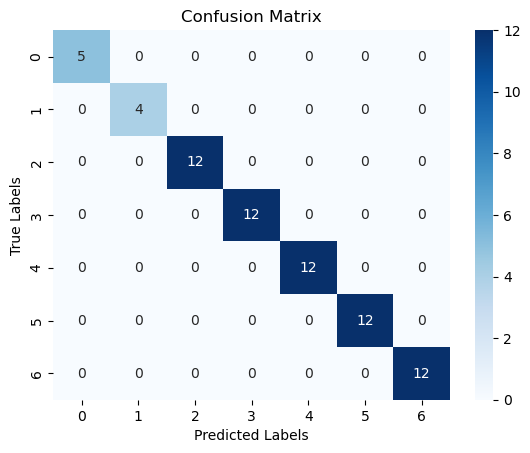

l = 10, Number of Relevant Features = 12, Features:
 Index(['max_avg_rss31', 'max_avg_rss12', '1st_quart_avg_rss32',
       'max_var_rss32', 'max_avg_rss13', 'median_avg_rss24', 'min_avg_rss15',
       'min_avg_rss36', 'max_avg_rss17', 'min_avg_rss27', 'min_avg_rss18',
       'median_avg_rss29'],
      dtype='object')
    Model Params
0       0.211430
1      -0.029070
2       0.081716
3      -0.481637
4      -0.146771
5       0.071810
6      -0.041998
7       0.370686
8      -0.134251
9       0.096410
10     -0.000017
11     -0.006956


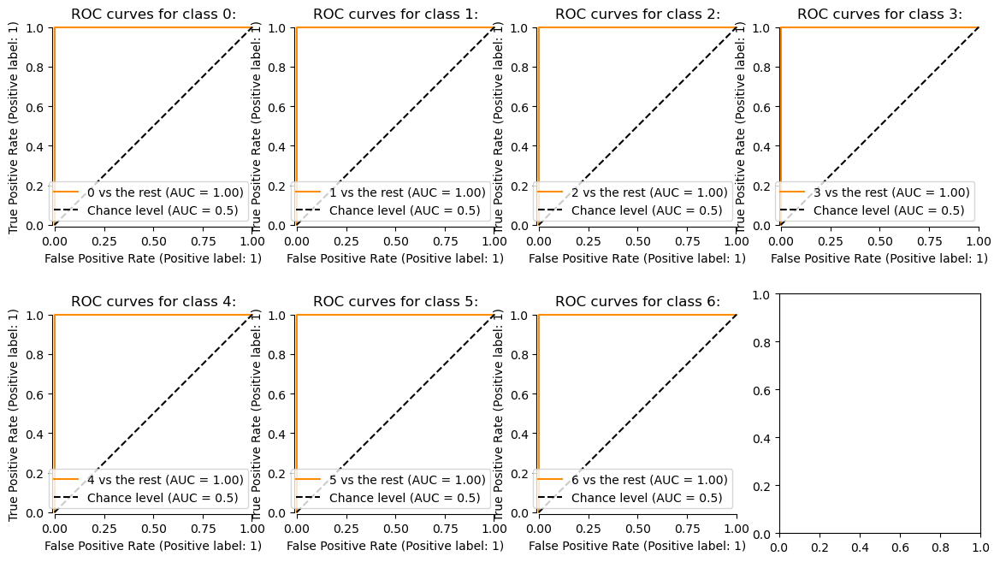

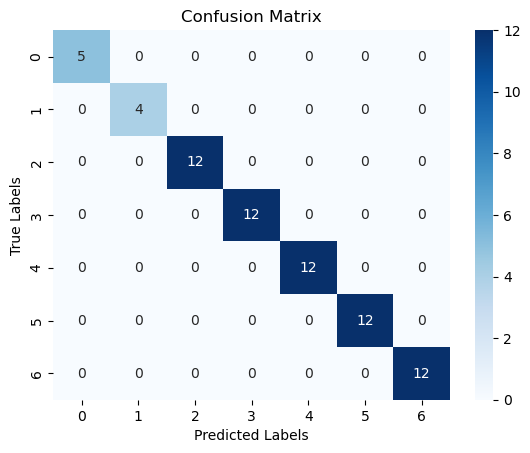

l = 11, Number of Relevant Features = 11, Features:
 Index(['max_avg_rss12', 'min_avg_rss32', 'max_avg_rss13', 'min_avg_rss24',
       'min_avg_rss34', 'max_avg_rss17', 'max_avg_rss27', 'min_avg_rss37',
       'min_avg_rss28', '3rd_quart_avg_rss210', 'max_avg_rss111'],
      dtype='object')
    Model Params
0      -0.008948
1       0.371128
2      -0.128252
3       0.204682
4       0.125238
5      -0.103832
6      -0.108051
7       0.125966
8       0.143600
9      -0.091639
10     -0.018282


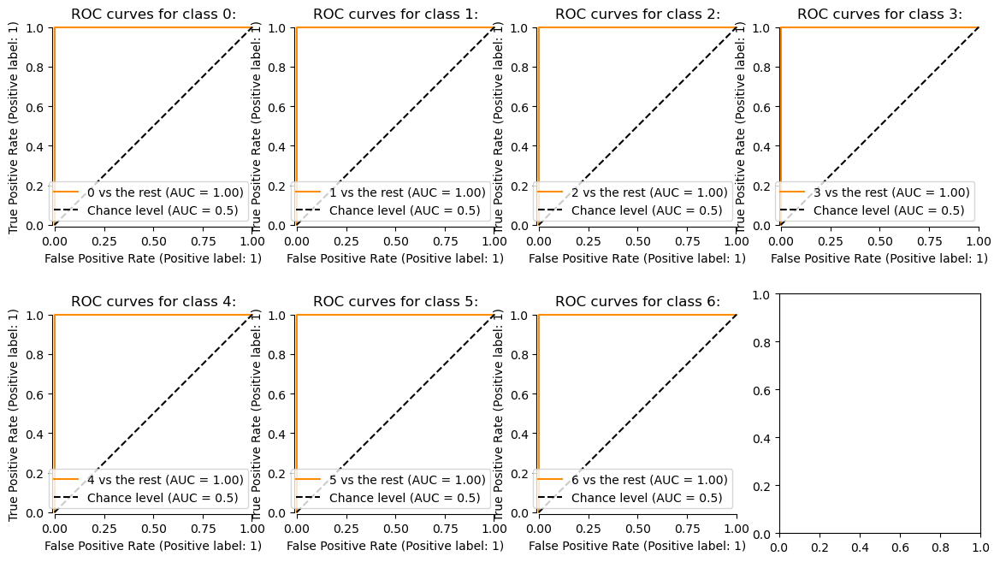

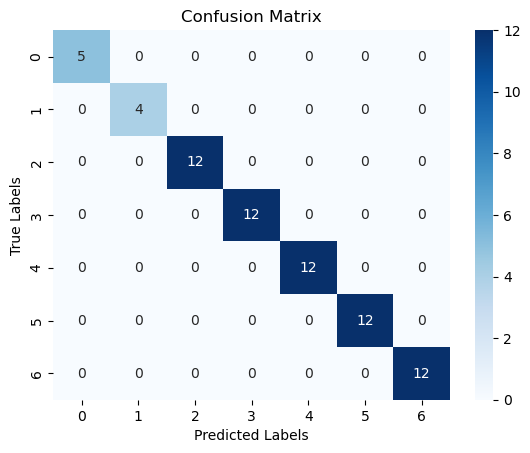

l = 12, Number of Relevant Features = 14, Features:
 Index(['max_avg_rss12', 'min_avg_rss32', 'max_avg_rss13',
       '1st_quart_avg_rss24', 'min_avg_rss34', 'min_avg_rss16',
       'max_avg_rss16', 'min_avg_rss37', 'max_avg_rss18', 'max_avg_rss28',
       'min_avg_rss38', 'min_avg_rss29', 'max_avg_rss110',
       '3rd_quart_avg_rss211'],
      dtype='object')
    Model Params
0      -0.000251
1       0.194834
2      -0.081859
3       0.140914
4       0.169426
5      -0.029045
6      -0.012480
7       0.109899
8      -0.114640
9      -0.130444
10      0.111846
11      0.291878
12     -0.026462
13     -0.167797


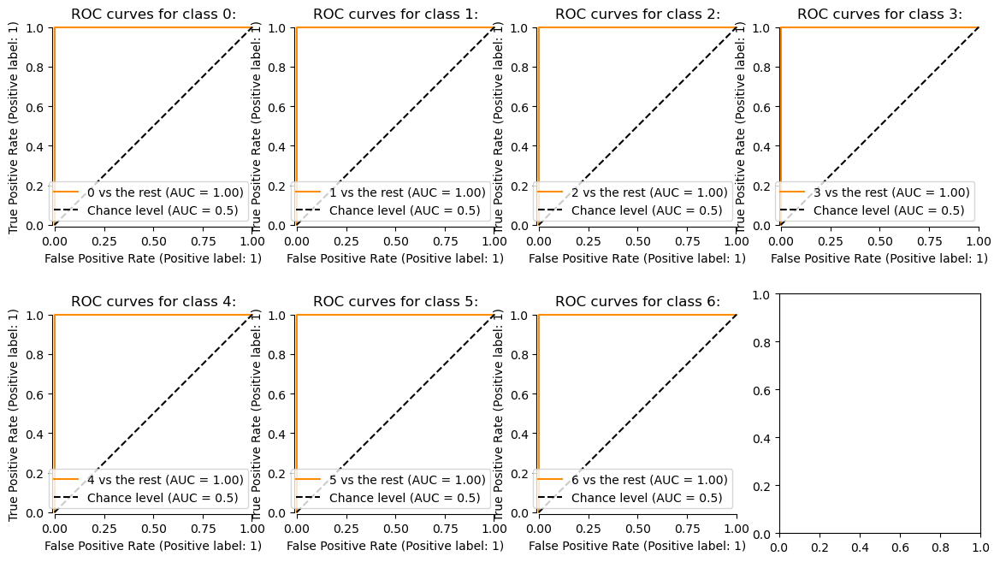

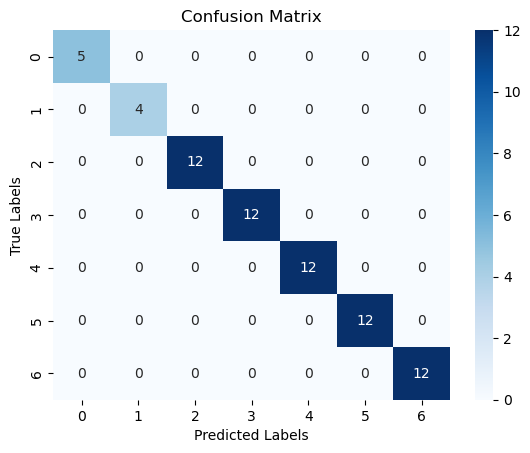

l = 13, Number of Relevant Features = 17, Features:
 Index(['max_avg_rss12', 'min_avg_rss32', 'max_avg_rss13', 'max_avg_rss14',
       '1st_quart_avg_rss24', 'min_avg_rss34', 'max_avg_rss15',
       'min_avg_rss25', 'max_avg_rss16', 'min_avg_rss36', 'min_avg_rss17',
       'max_avg_rss18', 'min_avg_rss38', 'max_avg_rss19', 'min_avg_rss210',
       'max_avg_rss111', '3rd_quart_avg_rss212'],
      dtype='object')
    Model Params
0      -0.033959
1       0.135091
2      -0.054252
3      -0.041501
4       0.063752
5       0.357456
6      -0.028727
7       0.226192
8      -0.042297
9       0.037198
10     -0.052315
11     -0.037763
12      0.145326
13     -0.025035
14      0.088763
15     -0.009074
16     -0.185480


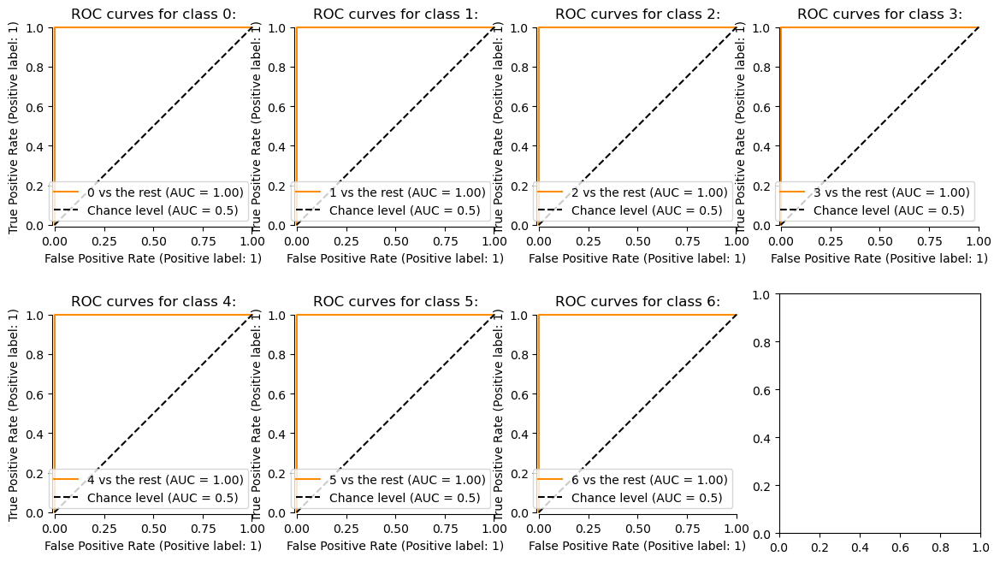

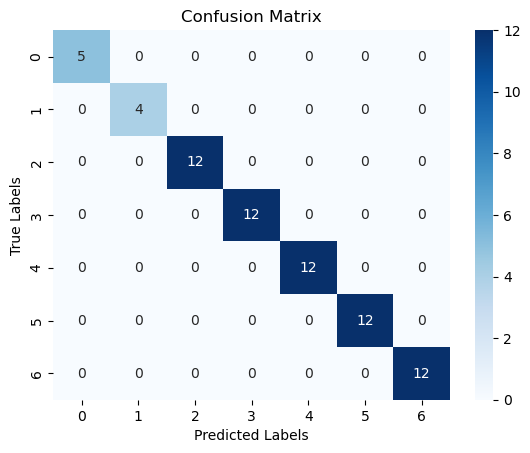

l = 14, Number of Relevant Features = 14, Features:
 Index(['min_avg_rss32', 'max_var_rss32', 'max_avg_rss14', 'min_avg_rss34',
       'min_avg_rss25', 'min_avg_rss35', 'max_avg_rss16', 'min_avg_rss28',
       'max_avg_rss19', 'max_avg_rss29', 'min_avg_rss39', 'min_avg_rss210',
       'max_avg_rss213', '3rd_quart_avg_rss213'],
      dtype='object')
    Model Params
0       0.211834
1      -0.013445
2      -0.196715
3       0.243178
4       0.337627
5       0.061283
6      -0.021459
7      -0.021083
8      -0.097327
9      -0.040670
10      0.117436
11      0.047403
12     -0.017393
13     -0.047790


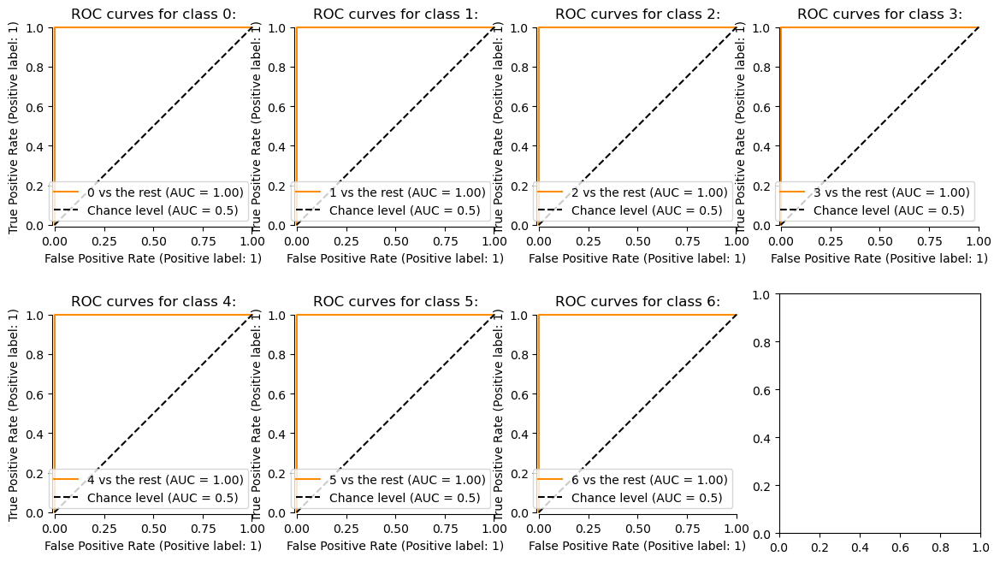

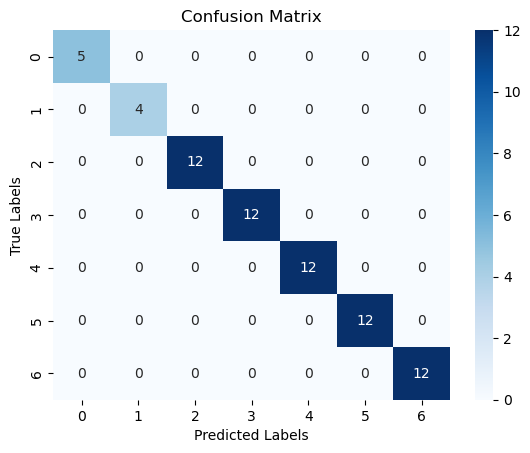

l = 15, Number of Relevant Features = 16, Features:
 Index(['3rd_quart_avg_rss22', 'min_avg_rss32', '1st_quart_avg_rss33',
       'max_avg_rss14', 'max_avg_rss15', 'min_avg_rss35', 'max_avg_rss16',
       '1st_quart_avg_rss26', 'max_avg_rss17', 'min_avg_rss18',
       'min_avg_rss39', 'max_avg_rss110', 'max_avg_rss210', 'min_avg_rss211',
       'max_avg_rss214', '3rd_quart_avg_rss214'],
      dtype='object')
    Model Params
0       0.015726
1       0.086881
2       0.054137
3      -0.035045
4      -0.021683
5       0.205816
6      -0.021408
7       0.212802
8      -0.063163
9      -0.084437
10      0.282163
11     -0.081663
12     -0.083681
13      0.179761
14     -0.052934
15     -0.158910


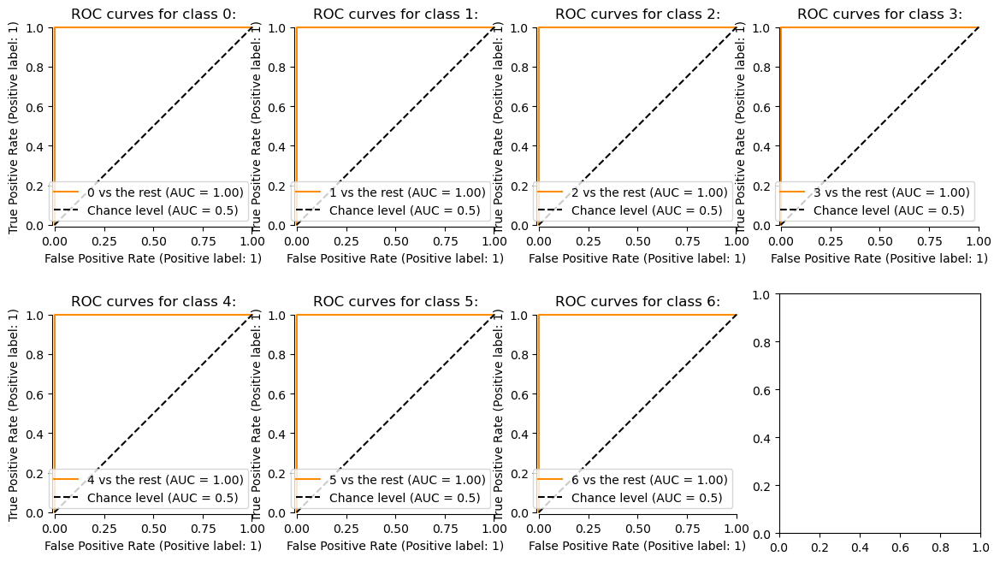

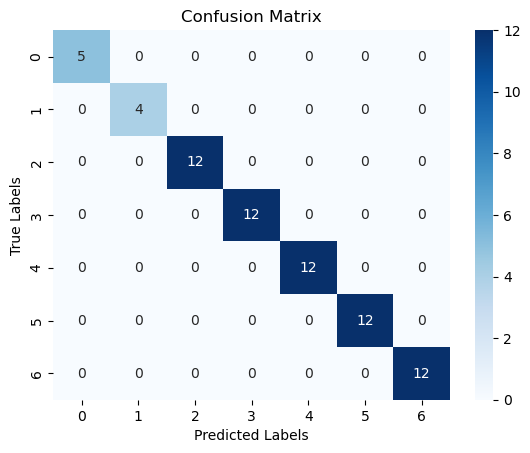

l = 16, Number of Relevant Features = 16, Features:
 Index(['max_avg_rss12', 'min_avg_rss33', 'max_avg_rss14',
       '1st_quart_avg_rss25', 'min_avg_rss35', 'min_avg_rss26',
       'median_avg_rss26', '1st_quart_avg_rss26', 'min_avg_rss18',
       'max_avg_rss110', 'max_avg_rss210', 'min_avg_rss310', 'max_avg_rss111',
       'min_avg_rss212', 'max_avg_rss215', '3rd_quart_avg_rss215'],
      dtype='object')
    Model Params
0      -0.010052
1       0.187320
2      -0.061808
3       0.022991
4       0.138059
5       0.017406
6       0.076146
7       0.028340
8      -0.071402
9      -0.085682
10     -0.120394
11      0.224003
12     -0.017563
13      0.249851
14     -0.087203
15     -0.139950


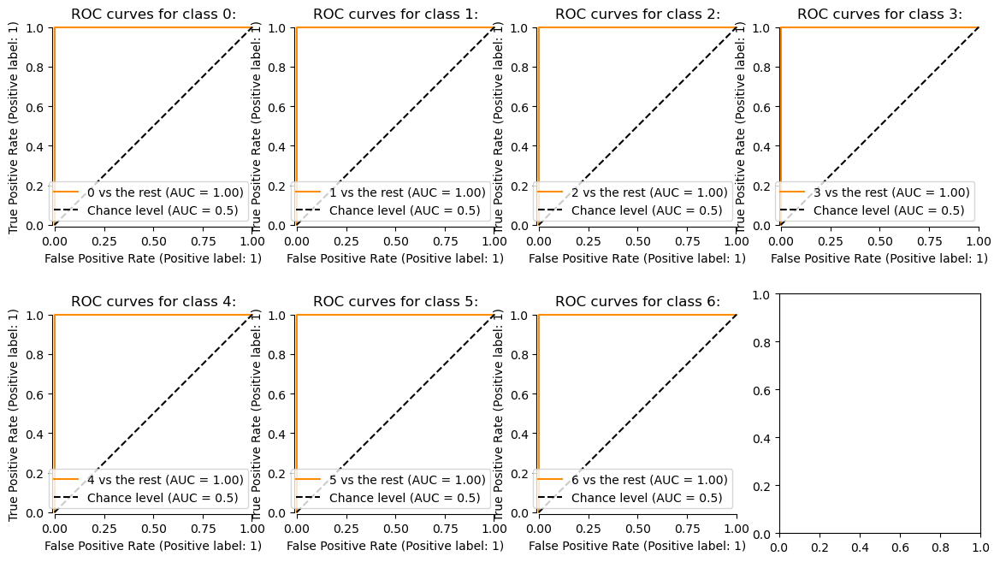

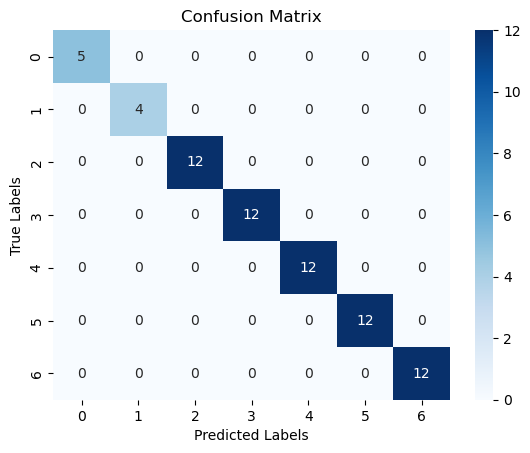

l = 17, Number of Relevant Features = 16, Features:
 Index(['max_avg_rss12', 'min_avg_rss33', 'max_avg_rss14', 'min_avg_rss25',
       'min_avg_rss35', 'max_avg_rss16', 'min_avg_rss26', 'min_avg_rss36',
       'max_avg_rss110', 'min_avg_rss310', 'max_avg_rss111',
       '3rd_quart_avg_rss111', 'max_avg_rss114', '3rd_quart_avg_rss215',
       'max_avg_rss116', 'min_avg_rss317'],
      dtype='object')
    Model Params
0      -0.041158
1       0.350040
2      -0.094500
3       0.038492
4       0.021774
5      -0.024074
6       0.284108
7       0.075328
8      -0.003963
9       0.194362
10     -0.097543
11     -0.012752
12     -0.035619
13     -0.089469
14     -0.012937
15     -0.053173


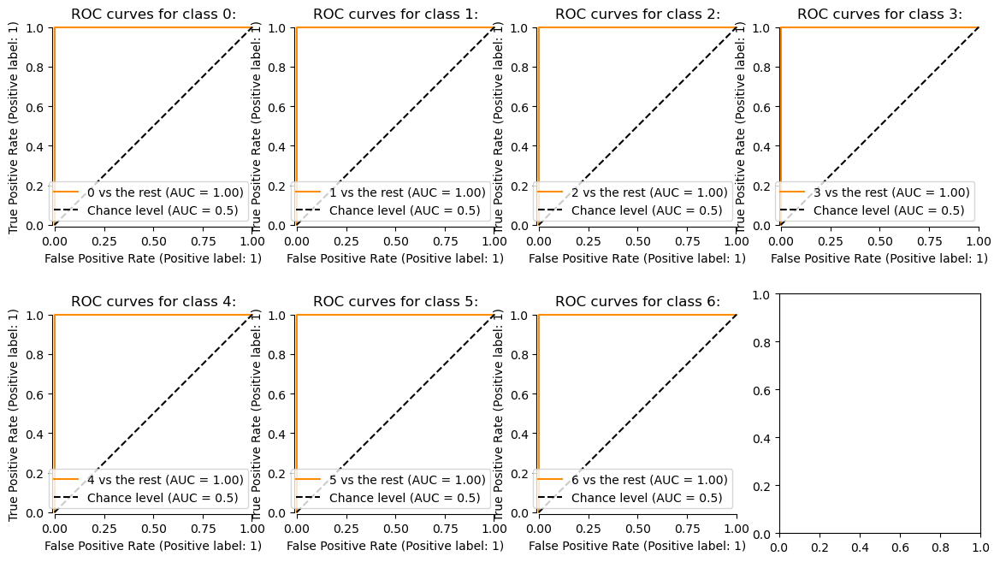

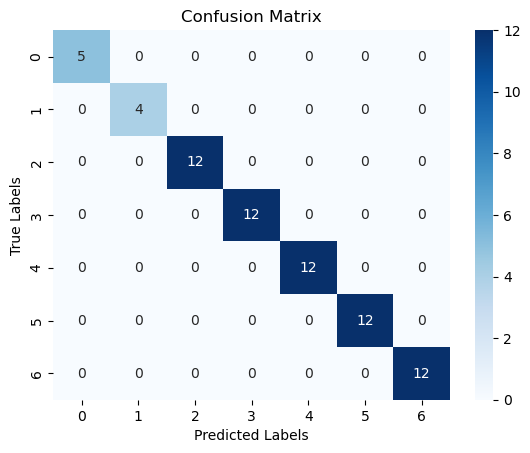

l = 18, Number of Relevant Features = 18, Features:
 Index(['max_avg_rss12', 'max_avg_rss13', 'min_avg_rss33', 'max_avg_rss14',
       'max_avg_rss15', 'min_avg_rss35', 'min_avg_rss26', 'min_avg_rss36',
       'min_avg_rss19', 'max_avg_rss111', 'max_avg_rss211', 'min_avg_rss311',
       'max_avg_rss112', 'max_avg_rss115', 'max_avg_rss215',
       '3rd_quart_avg_rss216', 'min_avg_rss317', 'min_avg_rss318'],
      dtype='object')
    Model Params
0      -0.013877
1      -0.009645
2       0.335694
3      -0.031148
4      -0.063494
5       0.038415
6       0.130092
7       0.215145
8      -0.013982
9      -0.125114
10     -0.088518
11      0.136899
12     -0.035334
13     -0.015226
14     -0.003650
15     -0.001181
16      0.018148
17     -0.066834


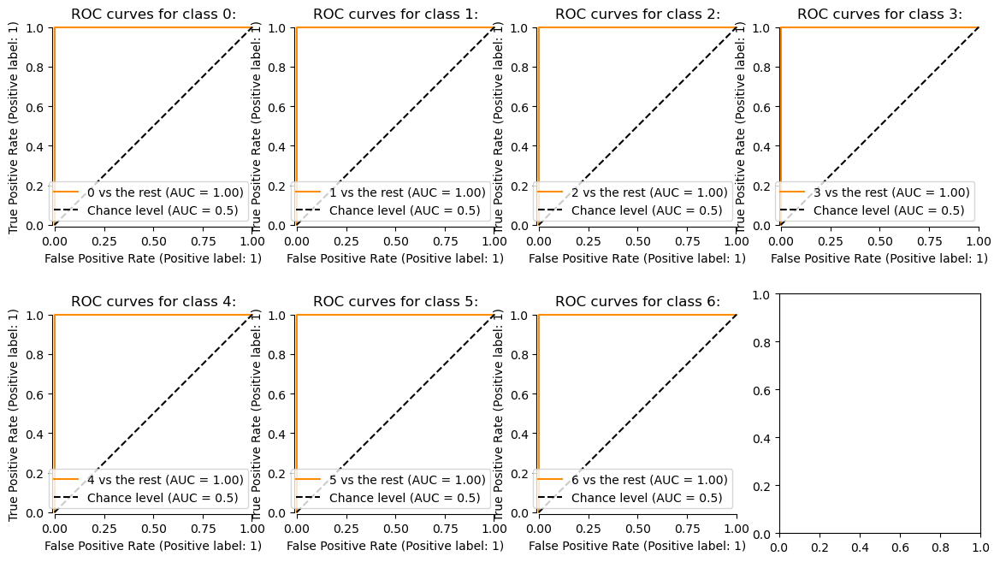

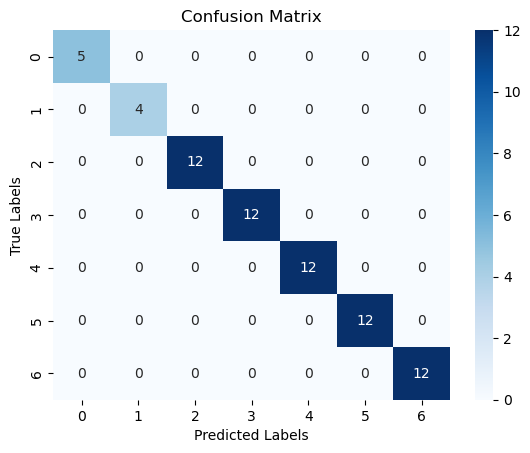

l = 19, Number of Relevant Features = 21, Features:
 Index(['min_avg_rss33', 'max_avg_rss15', 'max_avg_rss35', 'max_avg_rss16',
       '3rd_quart_avg_rss16', 'min_avg_rss26', 'min_avg_rss36',
       'min_avg_rss27', 'max_avg_rss18', 'median_avg_rss18', 'min_avg_rss311',
       'max_avg_rss112', 'max_avg_rss212', 'max_avg_rss113', 'min_avg_rss214',
       'min_avg_rss115', 'max_avg_rss115', '1st_quart_avg_rss115',
       'max_avg_rss215', 'max_avg_rss217', '3rd_quart_avg_rss217'],
      dtype='object')
    Model Params
0       0.312162
1      -0.045146
2      -0.021013
3      -0.053575
4      -0.028230
5       0.048274
6       0.093044
7       0.161790
8      -0.020717
9      -0.000892
10      0.272289
11     -0.059106
12     -0.042960
13     -0.036104
14      0.044362
15     -0.008552
16     -0.018492
17     -0.014666
18     -0.039997
19     -0.102719
20     -0.017559


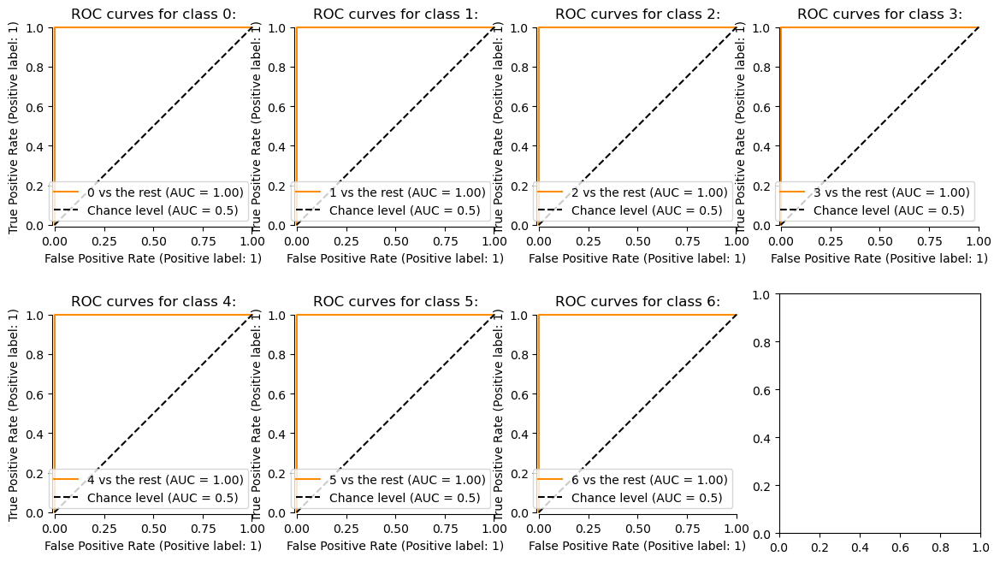

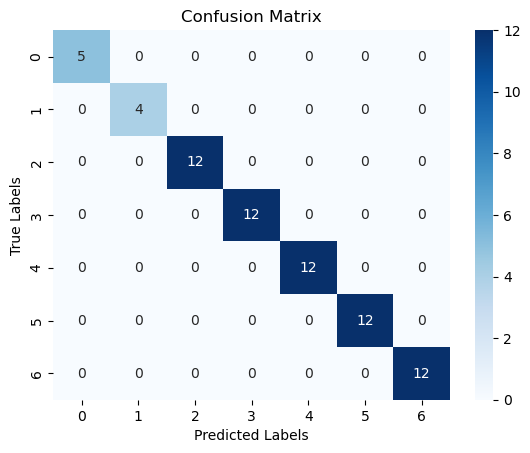

l = 20, Number of Relevant Features = 19, Features:
 Index(['max_avg_rss13', 'min_avg_rss33', 'max_avg_rss15', 'min_avg_rss26',
       'max_avg_rss17', 'min_avg_rss27', 'min_avg_rss37', 'min_avg_rss110',
       'max_avg_rss112', 'min_avg_rss312', 'max_avg_rss113', 'max_avg_rss114',
       '3rd_quart_avg_rss114', 'min_avg_rss215', 'max_avg_rss116',
       '1st_quart_avg_rss116', 'max_avg_rss216', 'max_avg_rss117',
       'max_avg_rss119'],
      dtype='object')
    Model Params
0      -0.018385
1       0.279773
2      -0.045520
3       0.011536
4      -0.005581
5       0.191094
6       0.204548
7      -0.021577
8      -0.004622
9       0.202930
10     -0.079185
11     -0.040854
12     -0.000773
13      0.021416
14     -0.026073
15     -0.000032
16     -0.223085
17     -0.022634
18     -0.014451


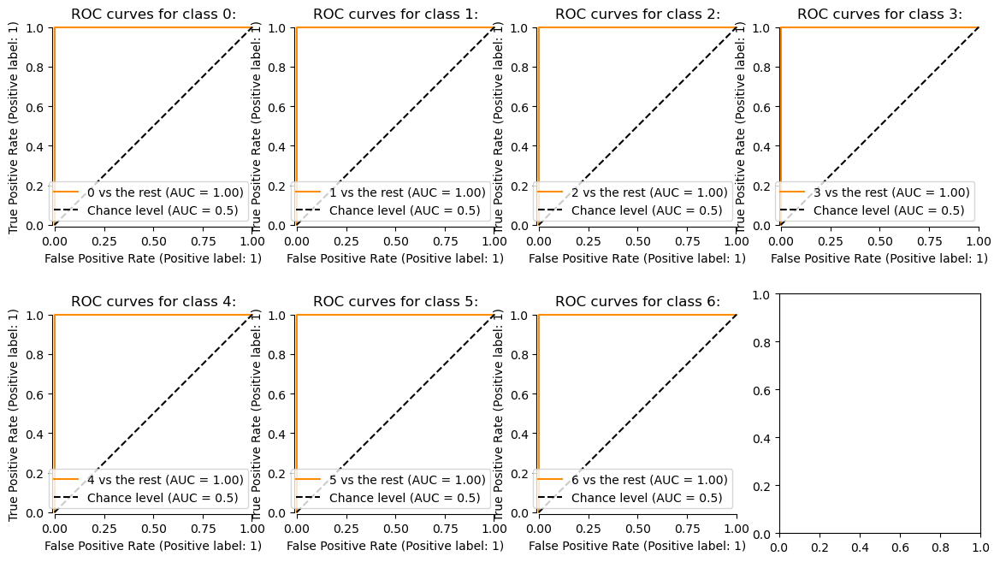

In [13]:
X_reduced_train = {}
X_reduced_test = {}
model = LogisticRegression(penalty='l1', solver='liblinear', max_iter=100)

for l in range(1, 21, 1):
    model.fit(X_train[l], Y_train)
    Y_pred = model.predict(X_train[l])
    Y_score = model.predict_log_proba(X_train[l])

    cm = confusion_matrix(Y_train, Y_pred)
    plt.figure()
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

    fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(14, 8))

    for i in range(len(cm)):
        RocCurveDisplay.from_predictions(
            Y_onehot_train[:, i],
            Y_score[:, i],
            ax=axs[i//4, i-4],
            name=f"{i} vs the rest",
            color="darkorange",
            plot_chance_level=True,
            despine=True,
        )
        axs[i//4, i-4].set_title(f'ROC curves for class {i}:')
        axs[i//4, i-4].plot(
            xlabel="False Positive Rate",
            ylabel="True Positive Rate",
        )
    indicies = [i for i in range(len(model.coef_[0])) if model.coef_[0][i] != 0]
    X_reduced_train[l] = X_train[l].iloc[:, indicies]
    X_reduced_test[l] = X_test[l].iloc[:, indicies]
    
    print(f'l = {l}, Number of Relevant Features = {len(indicies)}, Features:\n', X_reduced_train[l].columns)
    print(pd.DataFrame({"Model Params": model.coef_[0][indicies]}))

In [14]:
for l in range(1, 21, 1):
    print(f'l = {l}')
    print("Cross Validation Scores:", cross_val_score(model, X_reduced_train[l], Y_train, cv=5))
    model.fit(X_reduced_train[l], Y_train)
    Y_pred = model.predict(X_reduced_test[l])
    print(f'Test Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')


l = 1
Cross Validation Scores: [0.71428571 0.85714286 0.64285714 0.71428571 0.76923077]
Test Accuracy: 0.6842
l = 2


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_s

Cross Validation Scores: [0.78571429 1.         0.57142857 0.64285714 0.61538462]
Test Accuracy: 0.6316
l = 3
Cross Validation Scores: [0.92857143 0.78571429 0.57142857 0.78571429 0.84615385]
Test Accuracy: 0.7368
l = 4
Cross Validation Scores: [0.78571429 0.64285714 0.57142857 0.64285714 0.61538462]
Test Accuracy: 0.6842
l = 5


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Cross Validation Scores: [0.78571429 0.78571429 0.71428571 0.64285714 0.69230769]
Test Accuracy: 0.6842
l = 6
Cross Validation Scores: [0.57142857 0.78571429 0.71428571 0.71428571 0.76923077]
Test Accuracy: 0.5263
l = 7
Cross Validation Scores: [0.42857143 0.64285714 0.42857143 0.57142857 0.53846154]
Test Accuracy: 0.6316
l = 8


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Cross Validation Scores: [0.5        0.71428571 0.78571429 0.57142857 0.46153846]
Test Accuracy: 0.5263
l = 9


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Cross Validation Scores: [0.71428571 0.85714286 0.57142857 0.71428571 0.61538462]
Test Accuracy: 0.6842
l = 10
Cross Validation Scores: [0.85714286 0.71428571 0.64285714 0.57142857 0.76923077]
Test Accuracy: 0.6316
l = 11


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Cross Validation Scores: [0.42857143 0.64285714 0.42857143 0.57142857 0.46153846]
Test Accuracy: 0.3684
l = 12
Cross Validation Scores: [0.57142857 0.64285714 0.57142857 0.57142857 0.53846154]
Test Accuracy: 0.6316
l = 13


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Cross Validation Scores: [0.71428571 0.57142857 0.57142857 0.78571429 0.69230769]
Test Accuracy: 0.5789
l = 14
Cross Validation Scores: [0.42857143 0.57142857 0.57142857 0.5        0.46153846]
Test Accuracy: 0.5789
l = 15
Cross Validation Scores: [0.64285714 0.57142857 0.78571429 0.5        0.61538462]


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Test Accuracy: 0.6316
l = 16


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Cross Validation Scores: [0.57142857 0.78571429 0.71428571 0.57142857 0.53846154]
Test Accuracy: 0.7368
l = 17


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Cross Validation Scores: [0.57142857 0.64285714 0.5        0.5        0.53846154]
Test Accuracy: 0.5789
l = 18


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Cross Validation Scores: [0.57142857 0.57142857 0.57142857 0.71428571 0.38461538]
Test Accuracy: 0.4737
l = 19


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


Cross Validation Scores: [0.78571429 0.78571429 0.5        0.5        0.53846154]
Test Accuracy: 0.7895
l = 20


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/svm/_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Cross Validation Scores: [0.64285714 0.5        0.5        0.57142857 0.46153846]
Test Accuracy: 0.5789


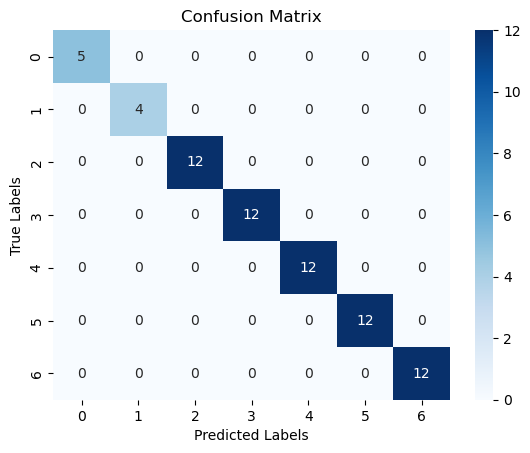

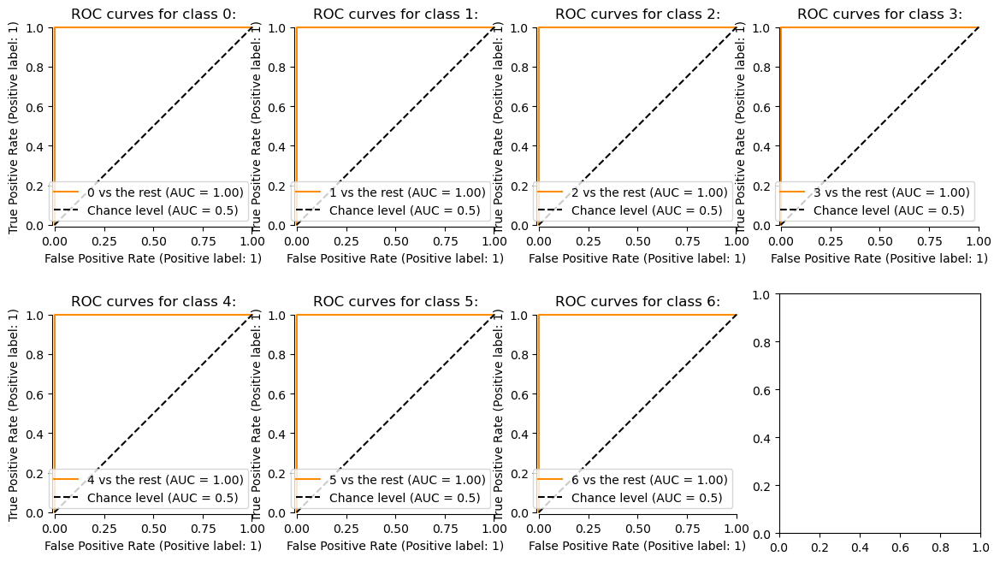

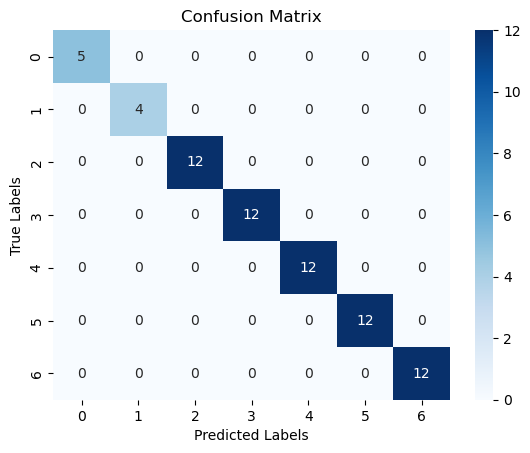

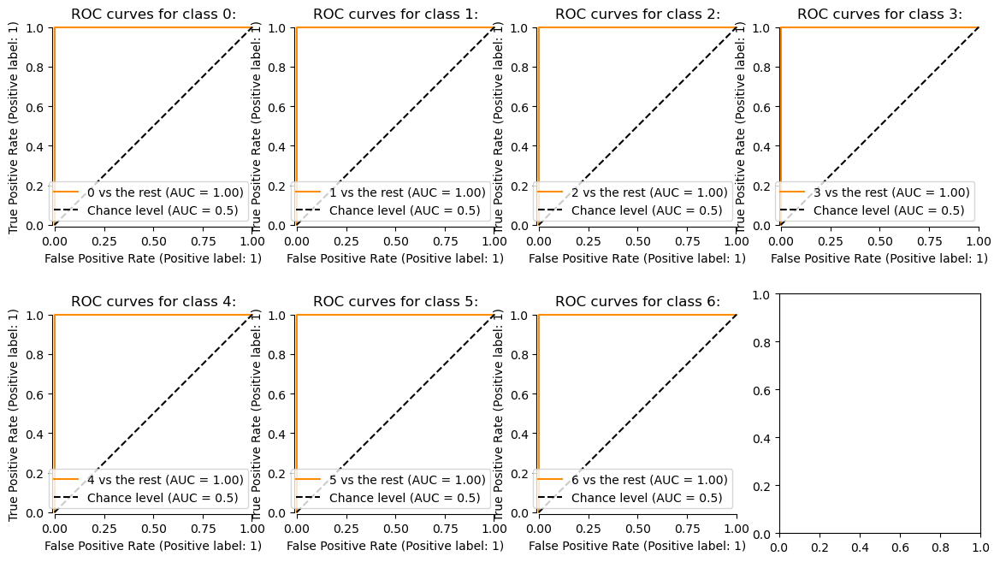

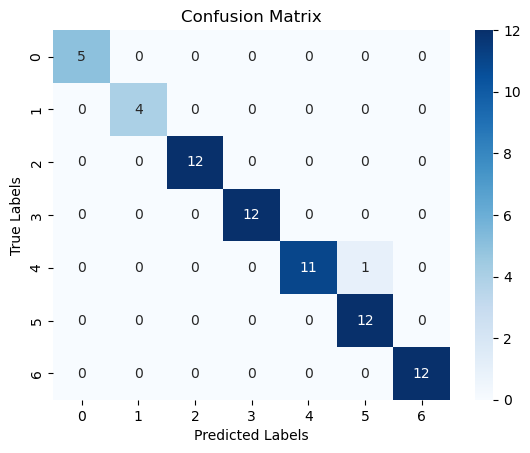

...

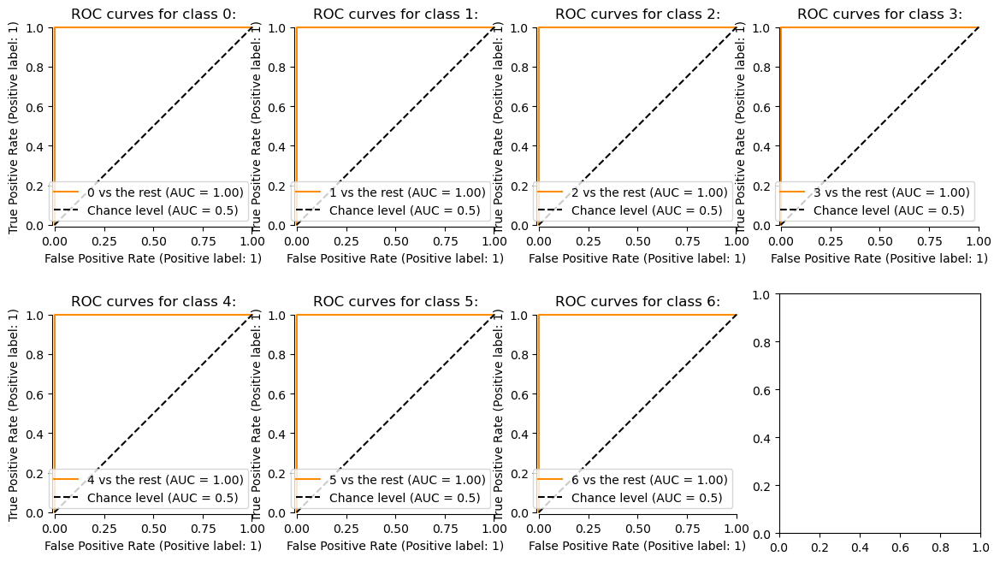

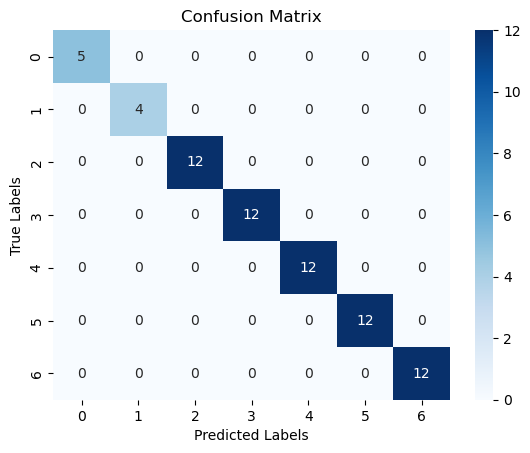

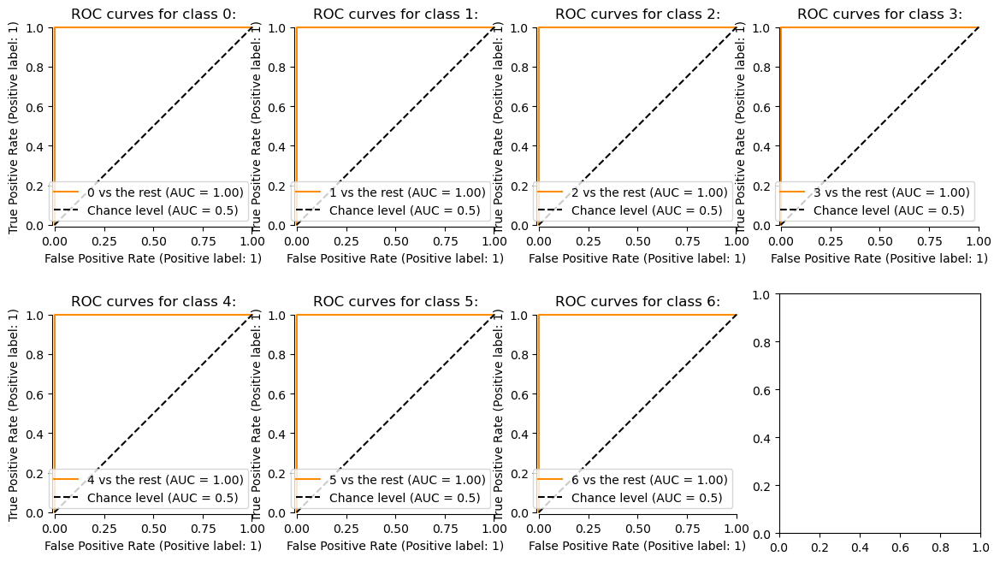

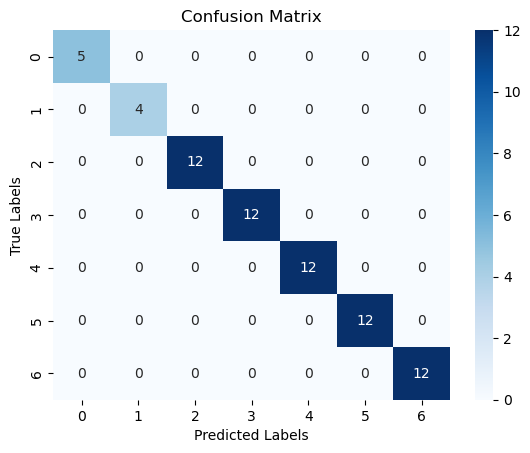

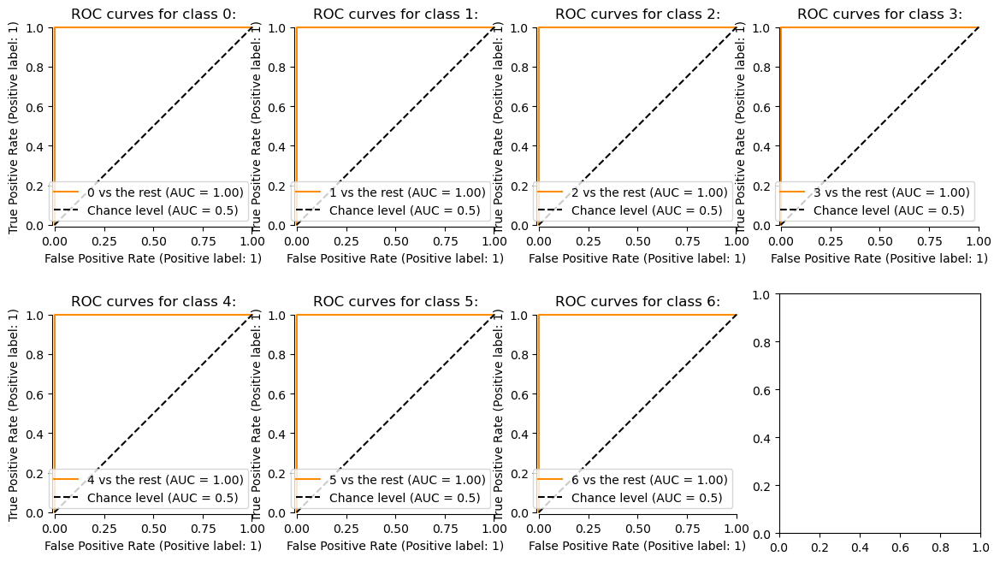

In [15]:
X_reduced_train = {}
X_reduced_test = {}
model = GaussianNB()

for l in range(1, 21, 1):
    model.fit(X_train[l], Y_train)

    Y_pred = model.predict(X_train[l])
    Y_score = model.predict_log_proba(X_train[l])

    cm = confusion_matrix(Y_train, Y_pred)
    plt.figure()
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()

    fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(14, 8))

    for i in range(len(cm)):
        RocCurveDisplay.from_predictions(
            Y_onehot_train[:, i],
            Y_score[:, i],
            ax=axs[i//4, i-4],
            name=f"{i} vs the rest",
            color="darkorange",
            plot_chance_level=True,
            despine=True,
        )
        axs[i//4, i-4].set_title(f'ROC curves for class {i}:')
        axs[i//4, i-4].plot(
            xlabel="False Positive Rate",
            ylabel="True Positive Rate",
        )

In [16]:
for l in range(1, 21, 1):
    print(f'l = {l}')
    print("Cross Validation Scores:", cross_val_score(model, X_train[l], Y_train, cv=5))
    model.fit(X_train[l], Y_train)
    Y_pred = model.predict(X_test[l])
    print(f'Test Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')


l = 1
Cross Validation Scores: [0.92857143 0.78571429 0.92857143 0.92857143 0.53846154]
Test Accuracy: 0.8947
l = 2
Cross Validation Scores: [0.85714286 0.78571429 0.85714286 0.78571429 0.92307692]
Test Accuracy: 0.6316
l = 3
Cross Validation Scores: [0.78571429 0.71428571 0.71428571 0.71428571 0.69230769]
Test Accuracy: 0.7368
l = 4
Cross Validation Scores: [0.71428571 0.78571429 0.71428571 0.57142857 0.53846154]
Test Accuracy: 0.7895
l = 5
Cross Validation Scores: [0.57142857 0.64285714 0.85714286 0.64285714 0.76923077]
Test Accuracy: 0.7895
l = 6
Cross Validation Scores: [0.57142857 0.71428571 0.64285714 0.71428571 0.69230769]
Test Accuracy: 0.6316
l = 7
Cross Validation Scores: [0.64285714 0.85714286 0.71428571 0.5        0.69230769]
Test Accuracy: 0.6842
l = 8
Cross Validation Scores: [0.78571429 0.78571429 0.64285714 0.64285714 0.61538462]
Test Accuracy: 0.7368
l = 9
Cross Validation Scores: [0.64285714 0.78571429 0.64285714 0.64285714 0.53846154]
Test Accuracy: 0.7895
l = 10
Cro

/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=

Cross Validation Scores: [0.64285714 0.57142857 0.57142857 0.64285714 0.53846154]
Test Accuracy: 0.5789
l = 15
Cross Validation Scores: [0.57142857 0.64285714 0.5        0.64285714 0.53846154]
Test Accuracy: 0.5789
l = 16
Cross Validation Scores: [0.64285714 0.57142857 0.64285714 0.5        0.53846154]
Test Accuracy: 0.5263
l = 17
Cross Validation Scores: [0.57142857 0.64285714 0.57142857 0.5        0.61538462]
Test Accuracy: 0.5263
l = 18
Cross Validation Scores: [0.57142857 0.57142857 0.5        0.5        0.53846154]
Test Accuracy: 0.6316
l = 19
Cross Validation Scores: [0.64285714 0.57142857 0.5        0.5        0.53846154]
Test Accuracy: 0.6316
l = 20
Cross Validation Scores: [0.64285714 0.57142857 0.5        0.57142857 0.53846154]
Test Accuracy: 0.5789


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=

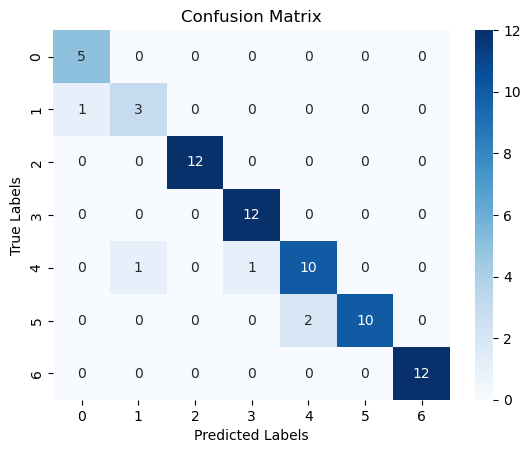

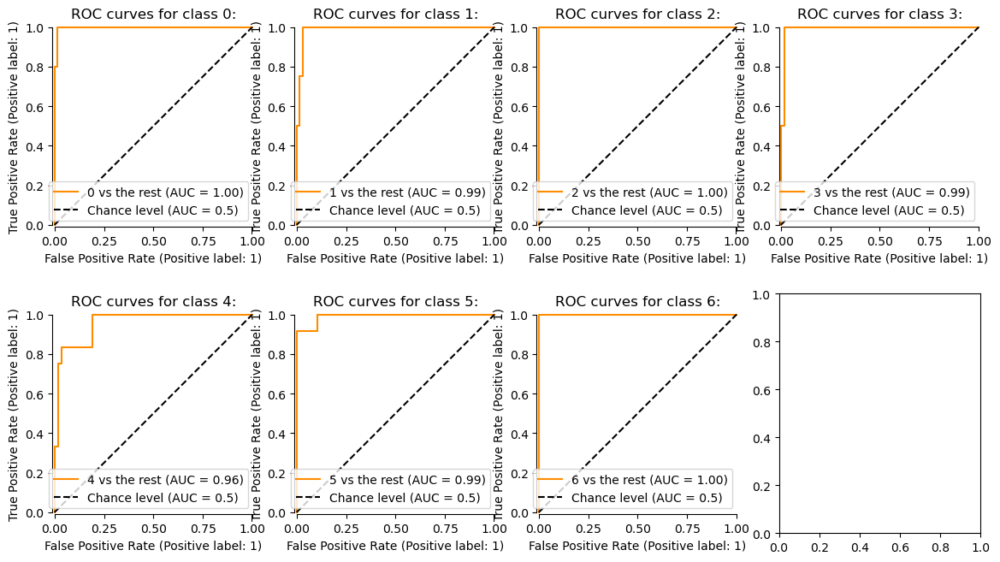

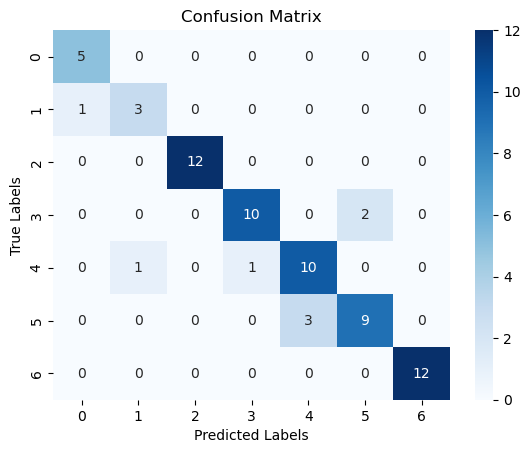

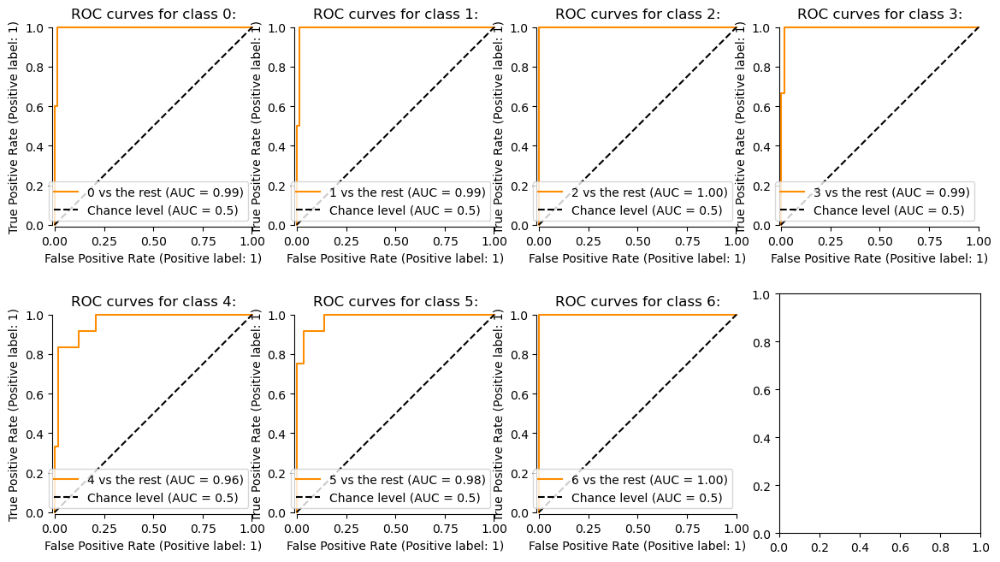

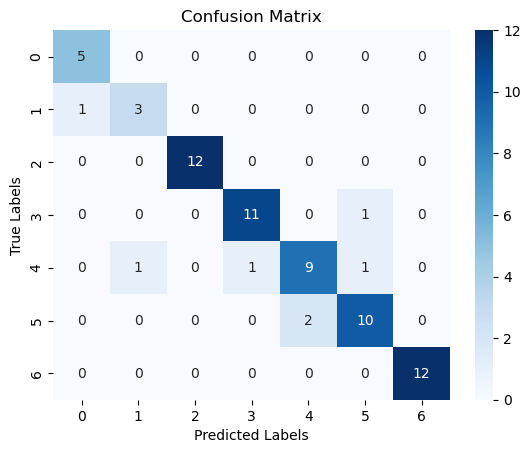

...

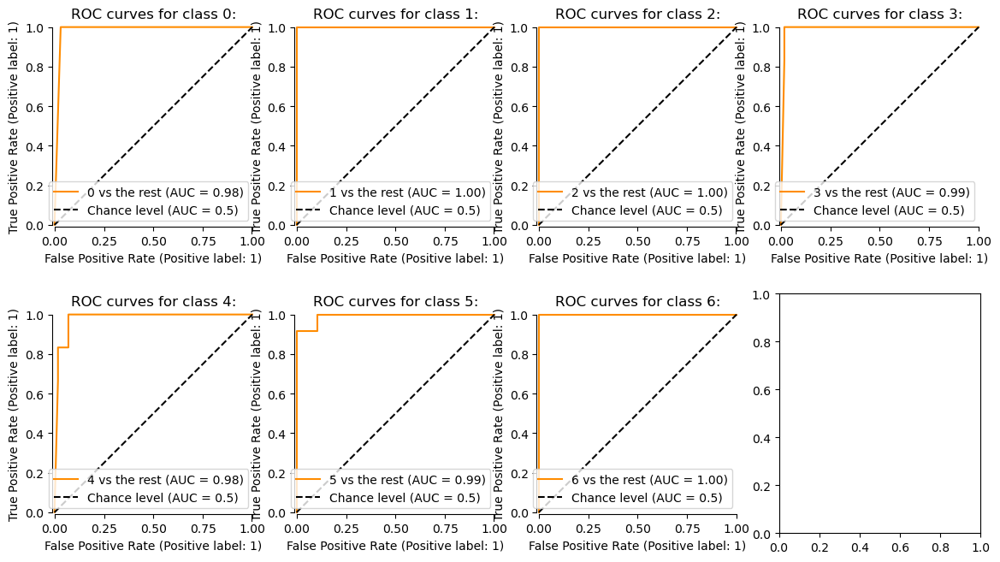

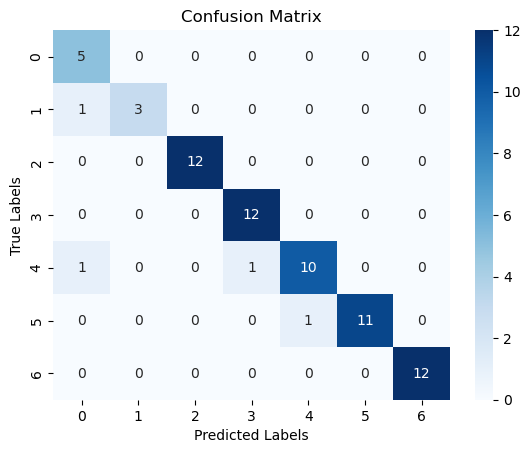

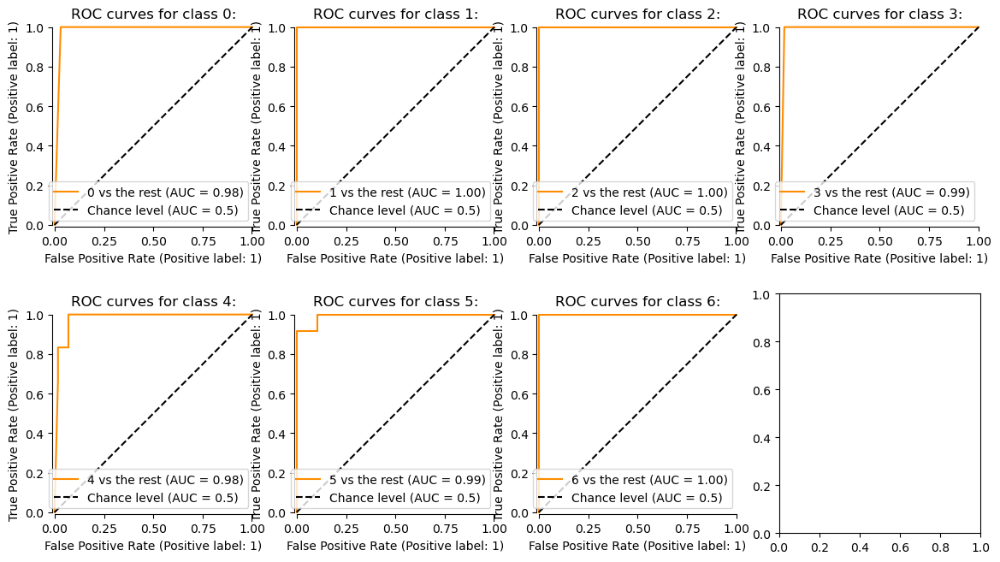

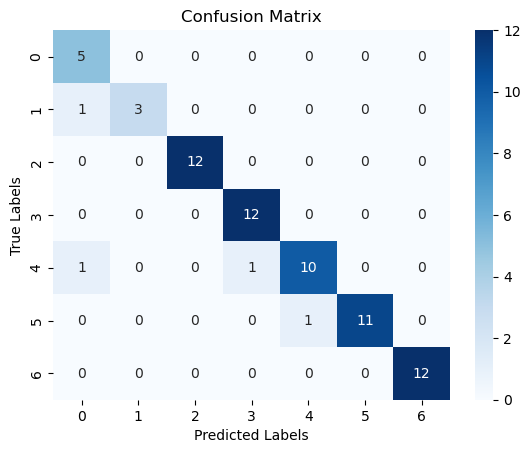

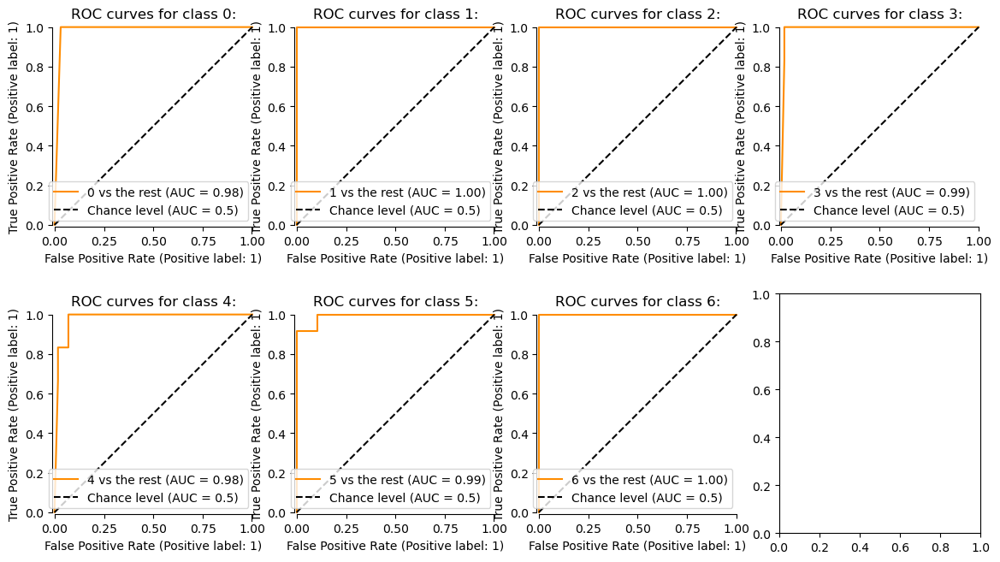

In [17]:
X_reduced_train = {}
X_reduced_test = {}
model = MultinomialNB()

for l in range(1, 21, 1):
    model.fit(X_train[l], Y_train)

    Y_pred = model.predict(X_train[l])
    Y_score = model.predict_log_proba(X_train[l])

    cm = confusion_matrix(Y_train, Y_pred)
    plt.figure()
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title('Confusion Matrix')
    plt.show()


    fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(14, 8))

    for i in range(len(cm)):
        RocCurveDisplay.from_predictions(
            Y_onehot_train[:, i],
            Y_score[:, i],
            ax=axs[i//4, i-4],
            name=f"{i} vs the rest",
            color="darkorange",
            plot_chance_level=True,
            despine=True,
        )
        axs[i//4, i-4].set_title(f'ROC curves for class {i}:')
        axs[i//4, i-4].plot(
            xlabel="False Positive Rate",
            ylabel="True Positive Rate",
        )


In [18]:
for l in range(1, 21, 1):
    print(f'l = {l}')
    print("Cross Validation Scores:", cross_val_score(model, X_train[l], Y_train, cv=5))
    model.fit(X_train[l], Y_train)
    Y_pred = model.predict(X_test[l])
    print(f'Test Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')

l = 1
Cross Validation Scores: [0.85714286 0.85714286 0.71428571 0.78571429 0.84615385]
Test Accuracy: 0.8947
l = 2
Cross Validation Scores: [0.85714286 0.78571429 0.71428571 0.71428571 0.84615385]
Test Accuracy: 0.7368
l = 3
Cross Validation Scores: [0.85714286 0.85714286 0.64285714 0.78571429 0.84615385]
Test Accuracy: 0.7895
l = 4
Cross Validation Scores: [0.85714286 0.85714286 0.64285714 0.78571429 0.84615385]
Test Accuracy: 0.7895
l = 5
Cross Validation Scores: [0.71428571 0.85714286 0.78571429 0.78571429 0.92307692]
Test Accuracy: 0.7368
l = 6
Cross Validation Scores: [0.78571429 0.92857143 0.71428571 0.71428571 0.84615385]
Test Accuracy: 0.7368
l = 7
Cross Validation Scores: [0.71428571 0.92857143 0.57142857 0.78571429 0.92307692]
Test Accuracy: 0.7368
l = 8
Cross Validation Scores: [0.71428571 0.92857143 0.71428571 0.78571429 0.76923077]
Test Accuracy: 0.7368
l = 9
Cross Validation Scores: [0.71428571 0.92857143 0.71428571 0.71428571 0.76923077]
Test Accuracy: 0.7368
l = 10
Cro

/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=

Cross Validation Scores: [0.71428571 0.92857143 0.78571429 0.71428571 0.76923077]
Test Accuracy: 0.7895
l = 16
Cross Validation Scores: [0.78571429 0.92857143 0.64285714 0.71428571 0.69230769]
Test Accuracy: 0.7895
l = 17
Cross Validation Scores: [0.78571429 0.92857143 0.57142857 0.71428571 0.69230769]
Test Accuracy: 0.8421
l = 18
Cross Validation Scores: [0.78571429 0.92857143 0.64285714 0.71428571 0.69230769]
Test Accuracy: 0.7895
l = 19
Cross Validation Scores: [0.78571429 0.92857143 0.57142857 0.71428571 0.69230769]
Test Accuracy: 0.8421
l = 20
Cross Validation Scores: [0.78571429 0.92857143 0.64285714 0.71428571 0.69230769]
Test Accuracy: 0.8421


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(
/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=

Number of features used = 37


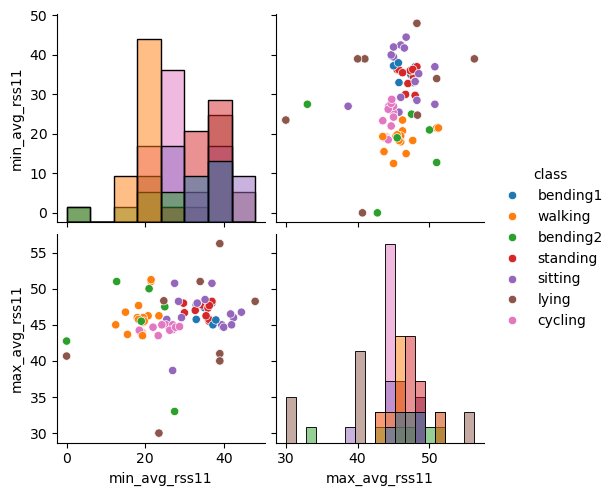

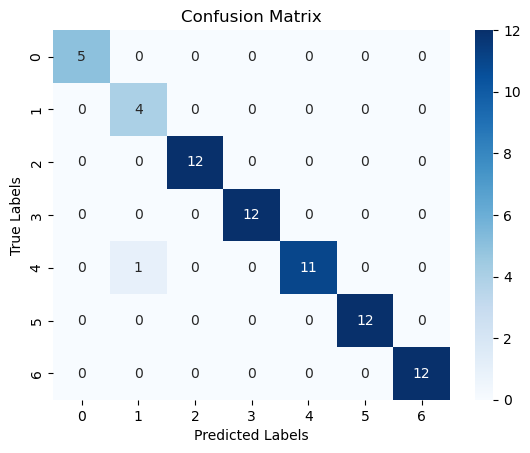

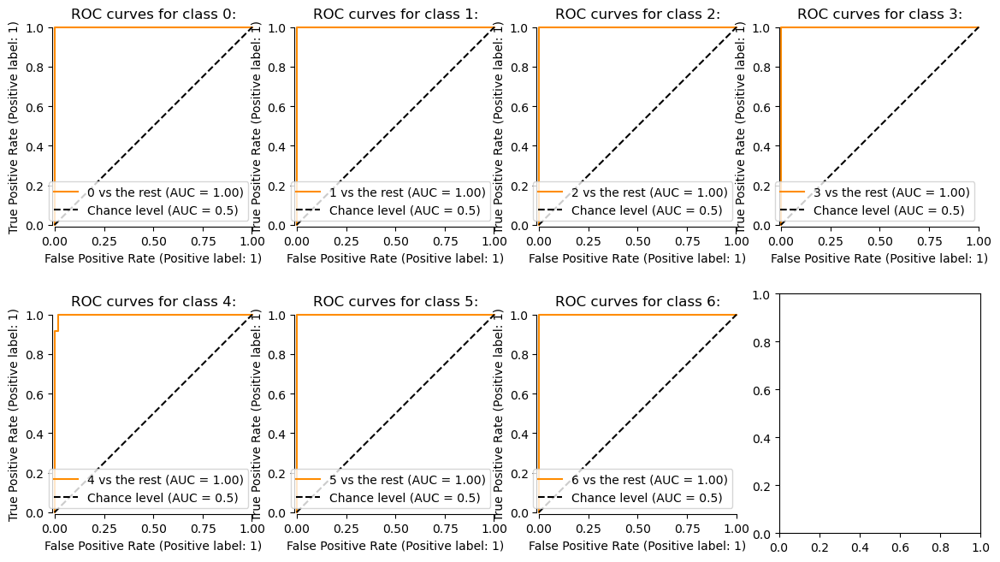

In [19]:
model = GaussianNB()

l = 1

indicies = pca_indicies
print(f'Number of features used = {len(indicies)}')
X_reduced_train = X_train[l].iloc[:, indicies]
X_reduced_test = X_test[l].iloc[:, indicies]
y_t = pd.DataFrame(Y_train, columns = ['class'])
y_tst = pd.DataFrame(Y_test, columns = ['class'])
disp = pd.concat([pd.concat([X_train[l], X_test[l]]), pd.concat([y_t, y_tst])], axis=1)
disp = disp.iloc[:, [indicies[0], indicies[1]]+[-1]]
sns.pairplot(disp, hue="class", diag_kind="hist")

model.fit(X_reduced_train, Y_train)

Y_pred = model.predict(X_reduced_train)
Y_score = model.predict_log_proba(X_reduced_train)

cm = confusion_matrix(Y_train, Y_pred)
plt.figure()
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()


fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(14, 8))

for i in range(len(cm)):
    RocCurveDisplay.from_predictions(
        Y_onehot_train[:, i],
        Y_score[:, i],
        ax=axs[i//4, i-4],
        name=f"{i} vs the rest",
        color="darkorange",
        plot_chance_level=True,
        despine=True,
    )
    axs[i//4, i-4].set_title(f'ROC curves for class {i}:')
    axs[i//4, i-4].plot(
        xlabel="False Positive Rate",
        ylabel="True Positive Rate",
    )


In [20]:
print(f'l = {l}')
print("Cross Validation Scores:", cross_val_score(model, X_reduced_train, Y_train, cv=5))
model.fit(X_reduced_train, Y_train)
Y_pred = model.predict(X_reduced_test)
print(f'Test Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')

l = 1
Cross Validation Scores: [0.92857143 0.85714286 0.92857143 0.92857143 0.53846154]
Test Accuracy: 0.8947


/Users/robin/miniconda3/lib/python3.12/site-packages/sklearn/model_selection/_split.py:805: UserWarning: The least populated class in y has only 4 members, which is less than n_splits=5.
  warnings.warn(


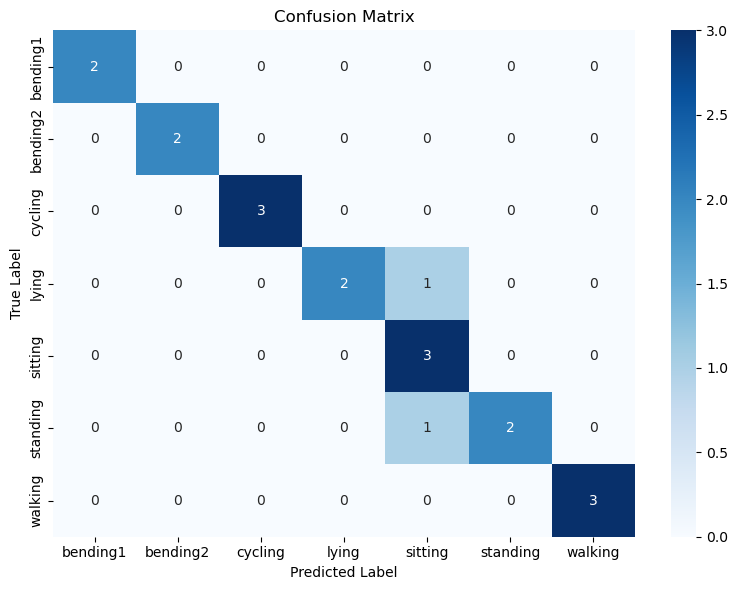

In [21]:
cm = confusion_matrix(Y_test, Y_pred)
plt.figure(figsize=(8, 6))
class_names = ['bending1', 'bending2', 'cycling', 'lying', 'sitting', 'standing', 'walking']
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.tight_layout()
plt.show()